In [ ]:
import pandas as pd
import plotly.graph_objects as go
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats

# Chapitre 2 : Préliminaire : Traitement des données climatiques et outils mathématiques

In [ ]:
filename = "tasmaxAdjust_France_CNRM-CERFACS-CNRM-CM5_CNRM-ALADIN63_Historical_METEO-FRANCE_ADAMONT-France_SAFRAN_day_20010101-20051231.txt"

my_data = pd.read_csv(
    filename,
    sep=";",
    comment="#",
    header=None,
    names=["Date", "Latitude", "Longitude", "Température"],
    parse_dates=["Date"],
    date_format="%Y%m%d",
)

loc_ids = my_data[["Latitude", "Longitude"]].drop_duplicates().reset_index(drop=True)
loc_ids["id"] = range(1, len(loc_ids) + 1)
my_data = my_data.merge(loc_ids, on=["Latitude", "Longitude"], how="left")
my_data.head()

,Date,Latitude,Longitude,Température,id
0,2001-06-01,42.3488,1.99835,6.16,1
1,2001-06-02,42.3488,1.99835,7.44,1
2,2001-06-03,42.3488,1.99835,12.14,1
3,2001-06-04,42.3488,1.99835,10.11,1
4,2001-06-05,42.3488,1.99835,8.84,1


In [ ]:
filename = "tasmaxAdjust_France_CNRM-CERFACS-CNRM-CM5_CNRM-ALADIN63_Historical_METEO-FRANCE_ADAMONT-France_SAFRAN_day_19860101-19901231.txt"

my_data1 = pd.read_csv(
    filename,
    sep=",",
    comment="#",
    header=None,
    names=["Date", "id", "Latitude", "Longitude", "Température"],
    parse_dates=["Date"],
    date_format="%Y%m%d",
)

my_data1 = my_data1.drop(columns=["id"],axis=1)
my_data1.head()

,Date,Latitude,Longitude,Température
0,1986-06-01,42.3488,1.99835,15.92
1,1986-06-02,42.3488,1.99835,12.37
2,1986-06-03,42.3488,1.99835,16.46
3,1986-06-04,42.3488,1.99835,15.14
4,1986-06-05,42.3488,1.99835,12.36


In [ ]:
filename = "tasmaxAdjust_France_CNRM-CERFACS-CNRM-CM5_CNRM-ALADIN63_Historical_METEO-FRANCE_ADAMONT-France_SAFRAN_day_19910101-19951231.txt"

my_data2 = pd.read_csv(
    filename,
    sep=",",
    comment="#",
    header=None,
    names=["Date", "id", "Latitude", "Longitude", "Température"],
    parse_dates=["Date"],
    date_format="%Y%m%d",
)

my_data2 = my_data2.drop(columns=["id"],axis=1)
my_data2.head()

,Date,Latitude,Longitude,Température
0,1991-06-01,42.3488,1.99835,12.50
1,1991-06-02,42.3488,1.99835,12.77
2,1991-06-03,42.3488,1.99835,5.96
3,1991-06-04,42.3488,1.99835,8.87
4,1991-06-05,42.3488,1.99835,13.49


In [ ]:
filename = "tasmaxAdjust_France_CNRM-CERFACS-CNRM-CM5_CNRM-ALADIN63_Historical_METEO-FRANCE_ADAMONT-France_SAFRAN_day_19960101-20001231.txt"

my_data3 = pd.read_csv(
    filename,
    sep=";",
    comment="#",
    header=None,
    names=["Date", "id", "Latitude", "Longitude", "Température"],
    parse_dates=["Date"],
    date_format="%Y%m%d",
)


my_data3 = my_data3.drop(columns=["id"],axis=1)
my_data3.head()

,Date,Latitude,Longitude,Température
0,1996-06-01,42.3488,1.99835,13.69
1,1996-06-02,42.3488,1.99835,17.12
2,1996-06-03,42.3488,1.99835,17.74
3,1996-06-04,42.3488,1.99835,19.59
4,1996-06-05,42.3488,1.99835,15.95


In [ ]:
# --- rassemblement des données de my_data1, my_data2 et my_data3 dans un seul DataFrame ----

# Mapping (Latitude, Longitude) -> id extrait de my_data1 (même grille spatiale)
id_map = my_data[["Latitude", "Longitude", "id"]].drop_duplicates(subset=["Latitude", "Longitude"])

# Attribuer l'id de my_data1/2/3 à my_data_copy via les coordonnées
my_data1_copy = my_data1.merge(id_map, on=["Latitude", "Longitude"], how="left")
my_data2_copy = my_data2.merge(id_map, on=["Latitude", "Longitude"], how="left")
my_data3_copy = my_data3.merge(id_map, on=["Latitude", "Longitude"], how="left")

# Concatenation des quatre DataFrames (colonnes : Date, Latitude, Longitude, Température, id)
all_data = pd.concat(
    [my_data, my_data1_copy, my_data2_copy, my_data3_copy],
    ignore_index=True
)[[ "id", "Date", "Latitude", "Longitude", "Température"]]

# Tri par lieu puis par date
all_data = all_data.sort_values(["id", "Date"]).reset_index(drop=True)

all_data.head()


,id,Date,Latitude,Longitude,Température
0,1,1986-06-01,42.3488,1.99835,15.92
1,1,1986-06-02,42.3488,1.99835,12.37
2,1,1986-06-03,42.3488,1.99835,16.46
3,1,1986-06-04,42.3488,1.99835,15.14
4,1,1986-06-05,42.3488,1.99835,12.36


In [ ]:
# ── Split train / test ─────────────────────────────────────────────────────
# data_full : DataFrame contenant toutes les données 1986-2005
# (à construire en concaténant data_8600 + données 2001-2005)

data_train = all_data[all_data['Date'].dt.year <= 2001].copy()
data_test  = all_data[(all_data['Date'].dt.year >= 2002) &
                       (all_data['Date'].dt.year <= 2005)].copy()


## Construiction de la grille régulière

In [ ]:
ID_COL = 'id'
SEUIL_COL = 'value'
LAT_COL = 'Latitude'
LON_COL = 'Longitude'
DATE_COL = 'Date'

In [ ]:
from sklearn.metrics.pairwise import haversine_distances 
from collections import defaultdict
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import connected_components as csgraph_cc
GRID_RES      = 0.1     # unités en degrés   
KM_PER_DEGREE = 111.32  # 1 degré en km

In [ ]:
# """Construit la grille fixe à partir de tous les points."""
lat_min = all_data[LAT_COL].min()
lat_max = all_data[LAT_COL].max()
lon_min = all_data[LON_COL].min()
lon_max = all_data[LON_COL].max()

n_rows = int(np.round((lat_max - lat_min) / GRID_RES)) + 1
n_cols = int(np.round((lon_max  - lon_min) / GRID_RES)) + 1

# la latitude de chaque ligne de la grille 
lat_array = np.linspace(lat_max, lat_min, n_rows) 

km_ns = GRID_RES * 111.32
km_ew_per_row = GRID_RES * 111.32 * np.cos(np.radians(lat_array))

meta = dict(lat_max=lat_max, lon_min=lon_min,
            lat_min=lat_min, lon_max=lon_max,
            n_rows=n_rows, n_cols=n_cols,
            km_ns=km_ns, km_ew_per_row=km_ew_per_row)


# """Remplit la grille avec un sous-ensemble S."""
def fill_grid(S):
    rows = np.round((meta['lat_max'] - S[LAT_COL].values) / GRID_RES).astype(int)
    cols = np.round((S[LON_COL].values - meta['lon_min']) / GRID_RES).astype(int)

    grid = np.zeros((meta['n_rows'], meta['n_cols']), dtype=np.int8)
    np.add.at(grid, (rows, cols), 1)
    grid = np.clip(grid, 0, 1)

    grid_to_nodes = defaultdict(list)
    for i, (r, c) in enumerate(zip(rows, cols)):
        grid_to_nodes[(r, c)].append(i)

    return grid, rows, cols, grid_to_nodes

In [ ]:
lat_max, lon_min, lat_min, lon_max

(np.float64(51.0498),
 np.float64(-4.96118),
 np.float64(42.3488),
 np.float64(8.18429))

# Chapitre 3 : L'ensmeble d'excursion en deux dimensions

In [ ]:
# définition de seuil spaciale 

def seuil_par_site(data, alp, var_col='Température'):
    """
    Calcule un seuil de température par site à partir d'un DataFrame complet.

    Parameters
    ----------
    data : pd.DataFrame — doit contenir les colonnes spécifiées par var_col et ID_COL
    alp : float — alpha à utiliser pour le seuil 
    var_col : str — nom de la colonne de variable (température, X(s,t))

    Returns
    -------
    pd.DataFrame — colonnes : id, value 
    """
    seuils = data.groupby(ID_COL)[var_col].quantile(alp).reset_index()
    seuils = seuils.rename(columns={var_col: 'value'})
    return seuils

In [ ]:

all_u_s_95 = seuil_par_site(all_data, 0.95)
all_u_s_90 = seuil_par_site(all_data, 0.90)
all_u_s_99 = seuil_par_site(all_data, 0.99)

all_u_s_95.head()

,id,value
0,1,23.3010
1,2,22.0315
2,3,26.2920
3,4,27.8310
4,5,28.7500


## L'ensemble d'excursion

In [ ]:
# extraction de l'ensemble d'excursion {x : T(x) > u} pour un seuil u donné (constant ou variable selon le site)

def excursion_set(data, u, var_col):
    """
    Returns the excursion set {x : T(x) > u}.

    Parameters
    ----------
    data : pd.DataFrame
        DataFrame with temperature observations.
    u : float or pd.DataFrame
        Scalar threshold, or a DataFrame with a threshold per location.
    var_col : str
        Name of the variable column.
    seuil_col : str
        Name of the threshold column in u if u is a DataFrame.

    Returns
    -------
    pd.DataFrame
        Rows where Température exceeds the threshold.
    """
    
    if isinstance(u, pd.DataFrame):
        key = [ID_COL] if isinstance(ID_COL, str) else ID_COL
        merged = data.merge(u[key + [SEUIL_COL]], on=ID_COL, how='left')
        return merged[merged[var_col] > merged[SEUIL_COL]].reset_index(drop=True)
    else:
        return data[data[var_col] > u].reset_index(drop=True)

In [ ]:
# l'ensemble d'excursion pour un seuil spatial
y99 = all_data[pd.to_datetime(all_data['Date']).dt.year == 1999]
excursion_set(y99, all_u_s_95,'Température')

,id,Date,Latitude,Longitude,Température,value
0,1,1999-07-26,42.3488,1.99835,23.66,23.301
1,1,1999-07-27,42.3488,1.99835,26.60,23.301
2,1,1999-07-28,42.3488,1.99835,26.74,23.301
3,1,1999-07-29,42.3488,1.99835,24.36,23.301
4,1,1999-07-30,42.3488,1.99835,25.14,23.301
...,...,...,...,...,...,...
55456,8809,1999-07-17,51.0497,2.16654,26.80,26.401
55457,8809,1999-07-18,51.0497,2.16654,26.47,26.401
55458,8809,1999-07-31,51.0497,2.16654,27.42,26.401
55459,8813,1999-07-17,51.0495,2.62163,26.71,26.346


In [ ]:
# l'ensemble d'excursion pour un seuil constant
date = np.random.choice(all_data['Date'].unique())
data_date = all_data[all_data["Date"] == pd.Timestamp(date)]
u = np.quantile(all_data['Température'], 0.95)
excursion_set(data_date, u, 'Température')

,id,Date,Latitude,Longitude,Température
0,101,2004-08-14,42.7060,3.06780,31.68
1,131,2004-08-14,42.7790,2.87364,32.10
2,132,2004-08-14,42.7784,2.97117,32.42
3,133,2004-08-14,42.7778,3.06870,31.63
4,171,2004-08-14,42.8503,2.97196,31.80
...,...,...,...,...,...
770,8510,2004-08-14,49.8757,4.83830,32.02
771,8601,2004-08-14,50.0911,4.84895,32.33
772,8748,2004-08-14,50.6165,3.18312,31.71
773,8749,2004-08-14,50.6157,3.29589,31.66


## Plot de l'ensemble d'excursion
Pour t fixé

In [ ]:
def plot_excursion_set_2d(data, u, date, var_col, ax=None):
    background = data[data[DATE_COL] == pd.Timestamp(date)].copy()
    if background.empty:
        print(f"Aucune donnée pour {date}")
        return pd.DataFrame()

    E = excursion_set(background, u, var_col=var_col)
    pct = 100 * len(E) / len(background)

    if isinstance(u, pd.DataFrame):
        u_label = f'u(s) par site ({SEUIL_COL})'
    else:
        u_label = str(u)

    standalone = ax is None
    if standalone:
        fig, ax = plt.subplots(figsize=(9, 7))

    ax.scatter(background[LON_COL], background[LAT_COL],
               color='lightgrey', s=8, zorder=1)
    ax.scatter(E[LON_COL], E[LAT_COL],
               color='crimson', s=14, zorder=2,
               label=f'{var_col} > {u_label}  ({len(E)} pts, {pct:.1f} %)')

    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.set_title(f'Ensemble d\'excursion  {{s : {var_col}(s) > {u_label}}}\n  |  {date}')
    ax.legend(markerscale=2, fontsize=10, loc='upper right')

    if standalone:
        plt.tight_layout()
        plt.show()

    return E

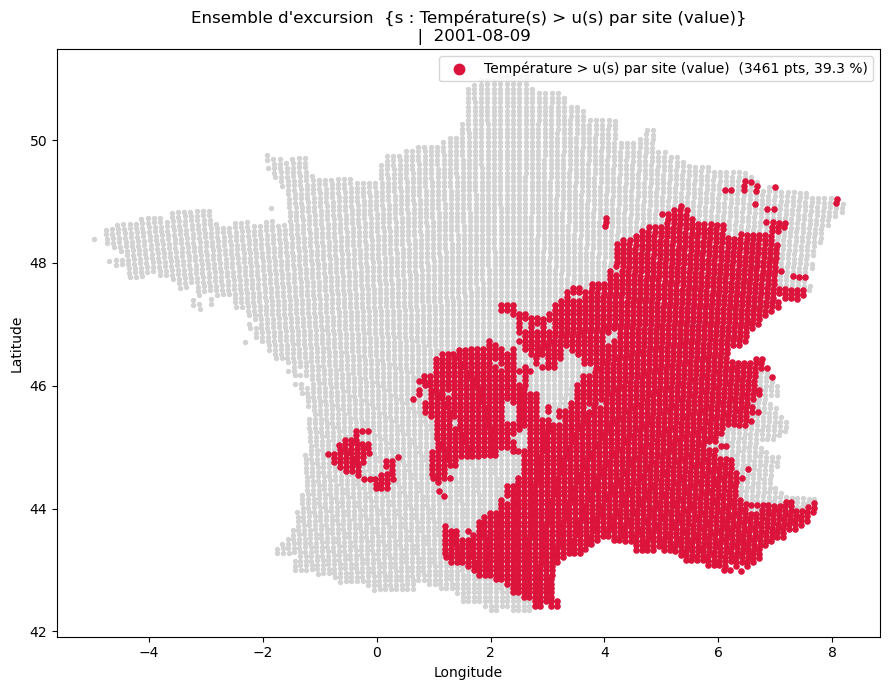

,id,Date,Latitude,Longitude,Température,value
0,16,2001-08-09,42.4202,2.77340,31.05,30.4005
1,17,2001-08-09,42.4198,2.87033,33.40,32.5905
2,18,2001-08-09,42.4186,3.06419,33.17,30.2920
3,19,2001-08-09,42.4179,3.16112,31.33,30.2020
4,33,2001-08-09,42.4920,2.77394,34.02,32.6505
...,...,...,...,...,...,...
3456,8053,2001-08-09,49.2560,6.45666,31.33,31.2600
3457,8055,2001-08-09,49.2483,6.67593,31.08,31.0215
3458,8057,2001-08-09,49.2360,7.00471,31.34,31.0205
3459,8128,2001-08-09,49.3278,6.46242,31.13,30.9780


In [ ]:
#date = np.random.choice(all_data['Date'].unique())           # random date for demonstration
date = "2001-08-09"
u = all_u_s_95

plot_excursion_set_2d(all_data, u, date, 'Température')

## Composants connextes

In [ ]:
# le nombre de composante connexe 2D dans l'ensemble d'excursion E

def get_components_2d(E):
    """
    Composantes connexes 2D. Utilise meta (global) pour le snapping.
    """
    grid, rows, cols, grid_to_nodes = fill_grid(E)
    N = len(E)

    if N == 0:
        E = E.copy()
        E['comp4'] = 0
        E['comp8'] = 0
        return E, 0, 0

    def _build_adj(offsets):
        src, dst = [], []
        for (r, c), idxs in grid_to_nodes.items():
            for a in range(len(idxs)):
                for b in range(a + 1, len(idxs)):
                    src += [idxs[a], idxs[b]]
                    dst += [idxs[b], idxs[a]]
            for dr, dc in offsets:
                for j in grid_to_nodes.get((r + dr, c + dc), []):
                    for i in idxs:
                        src.append(i)
                        dst.append(j)
        return csr_matrix(
            (np.ones(len(src), dtype=np.bool_), (src, dst)),
            shape=(N, N)
        )

    offsets4 = [(0, 1), (0, -1), (1, 0), (-1, 0)]
    offsets8 = offsets4 + [(1, 1), (1, -1), (-1, 1), (-1, -1)]

    n4, labels4 = csgraph_cc(_build_adj(offsets4), directed=False)
    n8, labels8 = csgraph_cc(_build_adj(offsets8), directed=False)

    E = E.copy()
    E['comp4'] = labels4 + 1
    E['comp8'] = labels8 + 1
    return E, n4, n8




In [ ]:
def plot_components_2d(E, min_size=1, title_extra=''):
    """

    Args:
        E : l'emsenble d'excursion pour une date donnée
        min_size : taille minimale pour colorer une composante (en rouge si plus petite, en couleur sinon), min_size=1 par défaut
        title_extra : titre additionnel à afficher sous le titre principal (ex : info sur le seuil ou la date)
    """
    E_labeled, n4, n8 = get_components_2d(E)
    
    # reconstruire les bornes pour le plot
    lon_min = meta['lon_min']
    lat_max = meta['lat_max']
    lat_min = meta['lat_min']
    lon_max = meta['lon_max']
    pad_lon = (lon_max - lon_min) * 0.02
    pad_lat = (lat_max - lat_min) * 0.02

    fig, axes = plt.subplots(1, 2, figsize=(18, 7))

    for ax, comp_col, n_comp, label_txt in [
        (axes[0], 'comp4', n4, f'4-connexité  ({n4} composantes)'),
        (axes[1], 'comp8', n8, f'8-connexité  ({n8} composantes)'),
    ]:
        ax.scatter(all_data[LON_COL], all_data[LAT_COL],
                   color='lightgrey', s=6, zorder=1)

        sizes = E_labeled.groupby(comp_col).size()

        # des composantes trop petites sont affichées en rouge, les autres en couleur
        small_mask = E_labeled[comp_col].map(sizes) < min_size
        if small_mask.any():
            ax.scatter(E_labeled.loc[small_mask, LON_COL],
                       E_labeled.loc[small_mask, LAT_COL],
                       color='red', s=12, zorder=2, label=f'< {min_size} pt(s)')

        large_comps = sizes[sizes >= min_size].sort_values(ascending=False)
        cmap = plt.get_cmap('tab20', max(len(large_comps), 1))

        for rank, (cid, size) in enumerate(large_comps.items()):
            mask = E_labeled[comp_col] == cid
            color = cmap(rank)
            ax.scatter(E_labeled.loc[mask, LON_COL],
                       E_labeled.loc[mask, LAT_COL],
                       color=color, s=14, zorder=3,
                       label=f'C{rank+1} ({size} pts)')
            cx = E_labeled.loc[mask, LON_COL].mean()
            cy = E_labeled.loc[mask, LAT_COL].mean()
            ax.annotate(f'{size}', xy=(cx, cy), fontsize=8, fontweight='bold',
                        ha='center', va='center', color='black',
                        bbox=dict(boxstyle='round,pad=0.2', fc='white', ec='none', alpha=0.7),
                        zorder=4)

        ax.set_xlim(lon_min - pad_lon, lon_max + pad_lon)
        ax.set_ylim(lat_min - pad_lat, lat_max + pad_lat)
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
        ax.set_title(f'{label_txt}\n{title_extra}')
        if len(large_comps) <= 15:
            ax.legend(markerscale=2, fontsize=8, loc='upper right')

    plt.tight_layout()
    plt.show()
    return E_labeled

2001-08-09 — 3461 points dans l'ensemble d'excursion (seuil 95%)


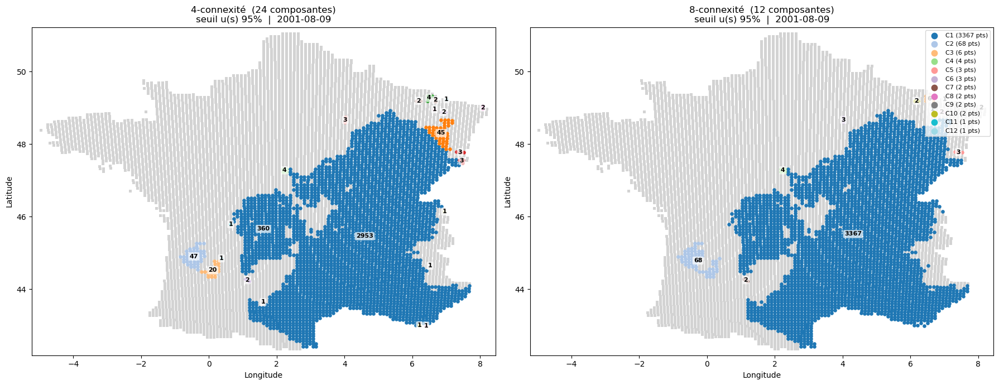

In [ ]:
#date = np.random.choice(all_data['Date'].unique())
date = "2001-08-09"
day_data = all_data[all_data['Date'] == pd.Timestamp(date)].copy()
E = excursion_set(day_data, all_u_s_95, 'Température')
print(f"{date} — {len(E)} points dans l'ensemble d'excursion (seuil 95%)")


E_labeled = plot_components_2d(
    E,
    min_size=1,
    title_extra=f'seuil u(s) 95%  |  {date}'
)

## Périmètre



In [ ]:
# la périmètre de l'emsemble d'excursioin
def compute_perimeter_2d(E, by_component=False):
    grid, rows, cols, grid_to_nodes = fill_grid(E)

    km_ns        = meta['km_ns']
    km_ew_per_row = meta['km_ew_per_row']  
    n_rows       = meta['n_rows']
    n_cols       = meta['n_cols']

    def _ns_count(g):
        """ nombre de bords verticaux (entre colonnes adjacentes, longueur=km_ns)"""
        return int((np.diff(g, axis=1) != 0).sum()
                   + g[:, 0].sum() + g[:, -1].sum())

    def _ew_km(g):
        """la longueur totale des bords horizontaux (entre lignes adjacentes, pondérés par km_ew_per_row)"""
        # bords horizontaux internes 
        diff_rows = (np.diff(g, axis=0) != 0)          # shape (n_rows-1, n_cols)
        interior  = (diff_rows * km_ew_per_row[:-1, None]).sum()
        
        # bords de contour (top: row0, bottom: last row)
        boundary  = (g[0, :].sum()  * km_ew_per_row[0]
                   + g[-1, :].sum() * km_ew_per_row[-1])
        return interior + boundary

    n_ns_tot  = _ns_count(grid)
    ew_km_tot = _ew_km(grid)
    perim_km  = n_ns_tot * km_ns + ew_km_tot

    result = {
        'perimeter_km': round(perim_km, 1),
        'n_ns':         n_ns_tot,
    }

    if by_component:
        E_lab, _, _ = get_components_2d(E)
        lat_max = meta['lat_max']
        lon_min = meta['lon_min']
        comp_perims = {}
        for k, grp in E_lab.groupby('comp8'):
            r_k  = np.round((lat_max - grp[LAT_COL].values) / GRID_RES).astype(int)
            c_k  = np.round((grp[LON_COL].values - lon_min) / GRID_RES).astype(int)
            mask = np.zeros((n_rows, n_cols), dtype=np.int8)
            mask[r_k, c_k] = 1
            n_ns_k  = _ns_count(mask)
            ew_km_k = _ew_km(mask)
            comp_perims[k] = {
                'perimeter_km': round(n_ns_k * km_ns + ew_km_k, 1),
            }
        result['by_component'] = comp_perims

    return result


In [ ]:
#date = np.random.choice(all_data['Date'].unique())
date = "2001-08-09"
day_data = all_data[all_data['Date'] == pd.Timestamp(date)].copy()
E = excursion_set(day_data, all_u_s_95, 'Température')

result_perim = compute_perimeter_2d(E)
print(f"Périmètre total : {result_perim['perimeter_km']} km pour {str(date)[:10]}")


Périmètre total : 8603.5 km pour 2001-08-09


In [ ]:
# la périmètre de l'emsemble d'excursioin par composante
result_perim = compute_perimeter_2d(E, by_component=True)
result_perim['perimeter_km'].sum()

np.float64(8603.5)

## Aire

In [ ]:
# l'aire de l'ensemble d'excursion

def compute_area_2d(E, by_component=False):
    grid, rows, cols, grid_to_nodes = fill_grid(E)

    km_ns         = meta['km_ns']
    km_ew_per_row = meta['km_ew_per_row']   # shape (n_rows,)
    n_rows        = meta['n_rows']
    n_cols        = meta['n_cols']

    # chaque ligne de la grille a une largeur (km_ew_per_row) différente,
    # donc on multiplie le nombre de cellules occupées dans chaque
    # ligne par la largeur correspondante, puis on somme sur toutes les lignes
    cells_per_row = grid.sum(axis=1)                          # shape (n_rows,)
    area_km2      = km_ns * (cells_per_row * km_ew_per_row).sum()

    result = {
        'area_km2': round(float(area_km2), 1),
        'n_cells':  int(grid.sum()),
    }

    if by_component:
        E_lab, _, _ = get_components_2d(E)
        lat_max = meta['lat_max']
        lon_min = meta['lon_min']
        comp_areas = {}
        for k, grp in E_lab.groupby('comp4'):
            r_k = np.round((lat_max - grp[LAT_COL].values) / GRID_RES).astype(int)
            c_k = np.round((grp[LON_COL].values - lon_min) / GRID_RES).astype(int)
            unique_cells = list(set(zip(r_k.tolist(), c_k.tolist())))
            unique_rows  = [r for r, c in unique_cells]
            area_k       = km_ns * km_ew_per_row[unique_rows].sum()
            comp_areas[k] = {
                'n_cells':  len(unique_cells),
                'area_km2': round(float(area_k), 1),
            }
        result['by_component'] = comp_areas

    return result


In [ ]:
#date = np.random.choice(all_data['Date'].unique())
date = "2001-08-09"
day_data = all_data[all_data['Date'] == pd.Timestamp(date)].copy()
E = excursion_set(day_data, all_u_s_95, 'Température')

result_area = compute_area_2d(E)
print(f"Aire totale : {result_area['area_km2']} km²  ({result_area['n_cells']} cellules) pour {str(date)[:10]}")

Aire totale : 220116.4 km²  (2537 cellules) pour 2001-08-09


## Le plus grand disque


### le plus grand disque dans excursion 

In [ ]:
from sklearn.metrics.pairwise import haversine_distances # attend des coordonnées en radians, retourne des distances en radians


# pour un point s_id dans E, trouver la distance au point le plus proche en dehors de E
def max_inscribed_radius(s_id, E, background):
    """
    Maximum inscribed radius at point s inside the excursion set E.

    r(s) = min_{t not in E} d(s, t)

    The largest ball centred at s that is entirely contained in E.

    Parameters
    ----------
    s_id       : int          -- station id of s (must be in E)
    E          : pd.DataFrame -- excursion set for a given day
    background : pd.DataFrame -- full grid for that day

    Returns
    -------
    float -- radius in km (np.inf if all stations are in E)
    """
    if s_id not in E['id'].values:
        raise ValueError(f"Point id={s_id} is not in the excursion set.")

    complement = background[~background['id'].isin(E['id'])]
    if complement.empty:
        return np.inf

    s_rad    = np.radians(E.loc[E['id'] == s_id, ['Latitude', 'Longitude']].values)
    comp_rad = np.radians(complement[['Latitude', 'Longitude']].values)
    R = 6371.0  
    return float(haversine_distances(s_rad, comp_rad).min() * R)




In [ ]:
# pour tous les points de E, trouver le max_inscribed_radius en ordre décroissant
def max_inscribed_radius_all(E, day_data):
    complement = day_data[~day_data[ID_COL].isin(E[ID_COL])]
    E = E.copy()
    if complement.empty:
        E['max_radius_km'] = np.inf
        return E

    E_rad    = np.radians(E[[LAT_COL, LON_COL]].values)
    comp_rad = np.radians(complement[[LAT_COL, LON_COL]].values)
    R = 6371.0
    E['max_radius_km'] = haversine_distances(E_rad, comp_rad).min(axis=1) * R

    # ── Composantes connexes ──────────────────────────────────────────────────
    E, n4, n8 = get_components_2d(E)

    # ── Meilleur centre par composante ────────────────────────────────────────
    per_comp = {}
    for k, grp in E.groupby('comp4'):
        best = grp.loc[grp['max_radius_km'].idxmax()]
        per_comp[int(k)] = {
            'center_id': int(best[ID_COL]),
            'radius_km': float(best['max_radius_km']),
            'n_pts'    : len(grp),
        }

    return E.sort_values('max_radius_km', ascending=False), n4, n8, per_comp


# trouver le rayon inscrit maximal pour une date donnée
def R_max_for_date(date, data, seuil, var_col):

    date = pd.Timestamp(date)
    day_data = data[data[DATE_COL] == date].copy()
    E = excursion_set(day_data, seuil, var_col=var_col)
    
    if E.empty:
        return 0.0  # Aucun point dans l'excursion → R_max = 0
    else:
        E_r = max_inscribed_radius_all(E, day_data)[0]
        return E_r.iloc[0]['max_radius_km']

In [ ]:
date = "2001-08-09"
day_data = all_data[all_data['Date'] == pd.Timestamp(date)].copy()
E = excursion_set(day_data, all_u_s_95, 'Température')

# radius for all points in E
E_rad, n4, n8, per_comp = max_inscribed_radius_all(E, day_data)
E_rad[['id', 'Latitude', 'Longitude', 'max_radius_km']].head()
per_comp

{1: {'center_id': 791, 'radius_km': 178.2931724241588, 'n_pts': 2953},
 2: {'center_id': 304, 'radius_km': 114.43656354889843, 'n_pts': 1},
 3: {'center_id': 305, 'radius_km': 112.20738277570528, 'n_pts': 1},
 4: {'center_id': 849, 'radius_km': 7.966891209617727, 'n_pts': 1},
 5: {'center_id': 1652, 'radius_km': 7.970859924778371, 'n_pts': 2},
 6: {'center_id': 1816, 'radius_km': 15.943500651248629, 'n_pts': 20},
 7: {'center_id': 3867, 'radius_km': 42.98251296189215, 'n_pts': 360},
 8: {'center_id': 2388, 'radius_km': 25.22195468375059, 'n_pts': 47},
 9: {'center_id': 2209, 'radius_km': 7.9725908744273095, 'n_pts': 1},
 10: {'center_id': 2313, 'radius_km': 7.9736293397051305, 'n_pts': 1},
 11: {'center_id': 3372, 'radius_km': 7.97680138393191, 'n_pts': 1},
 12: {'center_id': 3919, 'radius_km': 7.977821540465825, 'n_pts': 1},
 13: {'center_id': 5024, 'radius_km': 8.006036464807917, 'n_pts': 4},
 14: {'center_id': 5535, 'radius_km': 11.293123514523502, 'n_pts': 3},
 15: {'center_id': 59

### trier par chaque composante connexe

In [ ]:
def plot_largest_inscribed_disk(E_r, n4, per_comp, date, connexite=4):
    import matplotlib.patches as mpatches
    
    comp_col = f"comp{connexite}"
    comp_ids = sorted(E_r[comp_col].unique())
    palette  = plt.cm.get_cmap("tab10", len(comp_ids))
    comp_color = {k: palette(i) for i, k in enumerate(comp_ids)}

    # meilleur centre global
    best_comp = max(per_comp, key=lambda k: per_comp[k]['radius_km'])
    best_id   = per_comp[best_comp]['center_id']
    best_r    = per_comp[best_comp]['radius_km']

    best_row   = E_r[E_r[ID_COL] == best_id].iloc[0]
    lat0, lon0 = best_row[LAT_COL], best_row[LON_COL]

    def to_km(lat, lon):
        x = (lon - lon0) * 111.32 * np.cos(np.radians(lat0))
        y = (lat - lat0) * 111.32
        return x, y

    fig, ax = plt.subplots(figsize=(9, 8))

    # fond gris
    not_E  = day_data[~day_data[ID_COL].isin(E_r[ID_COL])]
    bx, by = to_km(not_E[LAT_COL].values, not_E[LON_COL].values)
    ax.scatter(bx, by, color="lightgrey", s=8, zorder=1)

    # points + cercle par composante
    for k in comp_ids:
        grp    = E_r[E_r[comp_col] == k]
        ex, ey = to_km(grp[LAT_COL].values, grp[LON_COL].values)
        ax.scatter(ex, ey, color=comp_color[k], s=12, zorder=2, alpha=0.7)

        center     = per_comp[k]['center_id']
        r_k        = per_comp[k]['radius_km']
        cx_k, cy_k = to_km(
            np.array([E_r.loc[E_r[ID_COL] == center, LAT_COL].iloc[0]]),
            np.array([E_r.loc[E_r[ID_COL] == center, LON_COL].iloc[0]]),
        )
        ax.add_patch(mpatches.Circle(
            (float(cx_k), float(cy_k)), radius=r_k,
            fill=False, edgecolor=comp_color[k],
            linewidth=1.5, linestyle="--", zorder=4,
        ))

    # cercle global (navy)
    ax.add_patch(mpatches.Circle(
        (0, 0), radius=best_r,
        fill=False, edgecolor="navy",
        linewidth=2.5, linestyle="-", zorder=5,
    ))
    ax.scatter(0, 0, color="navy", s=80, zorder=6, marker="*",
               label=f"Centre global  id={best_id}  r={best_r:.1f} km")

    ax.set_aspect("equal")
    ax.set_xlabel("x  (km)")
    ax.set_ylabel("y  (km)")
    ax.set_title(
        f"Plus grand disque inscrit dans $E_t$\n"
        f"Date : {str(date)[:10]}  |  {n4} composantes (4-conn.)  |  r* = {best_r:.1f} km"
    )
    ax.legend(fontsize=9, loc="upper right")
    plt.tight_layout()
    plt.show()

/var/folders/vw/x71ysw2x0pz7h6d64np8b0_80000gn/T/ipykernel_38567/1689188506.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette  = plt.cm.get_cmap("tab10", len(comp_ids))
/var/folders/vw/x71ysw2x0pz7h6d64np8b0_80000gn/T/ipykernel_38567/1689188506.py:42: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  (float(cx_k), float(cy_k)), radius=r_k,


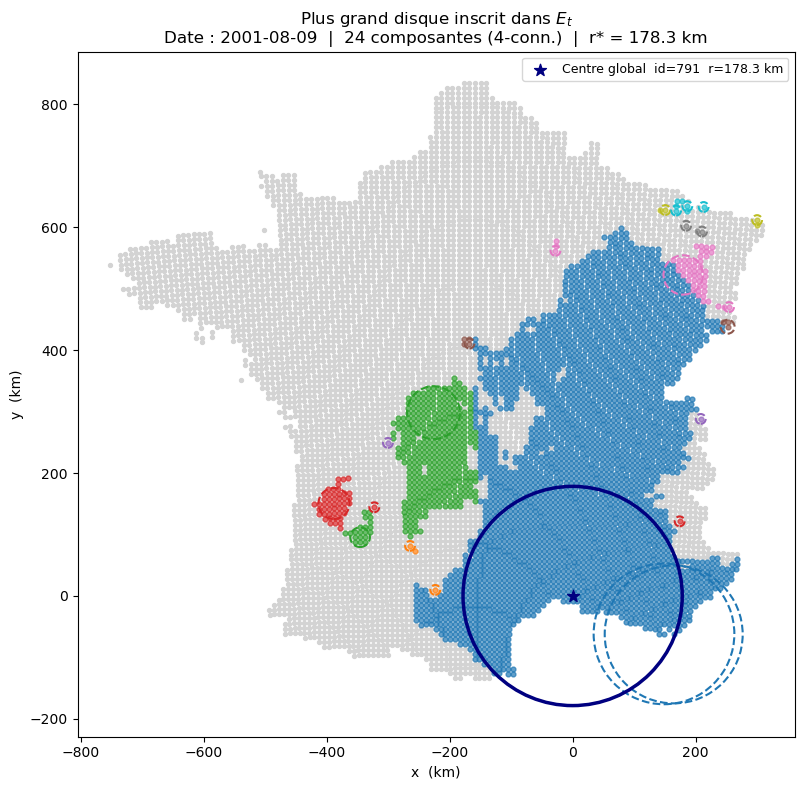

In [ ]:
#date = np.random.choice(all_data['Date'].unique())
date = "2001-08-09"
plot_largest_inscribed_disk(E_rad, n4, per_comp, date=date)

#  Chapitre 4 : L'ensemble d'excursion en trois dimensions

## L'ensemble d'excursion en trois dimensions

In [ ]:
import geopandas as gpd
from shapely.geometry import box


# la fontière de la France métropolitaine (pour le plot 3D)
_FRANCE_BORDER = None  # module-level cache so we only download once per session

def _load_france_border():
    global _FRANCE_BORDER
    if _FRANCE_BORDER is not None:
        return _FRANCE_BORDER

    world = gpd.read_file(
        "https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip"
    )
    france = world[world['NAME'] == 'France']
    france_metro = france.clip(box(-5.5, 41, 8.5, 51.5))
    outline = france_metro.union_all() if hasattr(france_metro, 'union_all') else france_metro.unary_union

    # Keep the largest polygon (metropolitan mainland, drop overseas territories)
    if outline.geom_type == 'MultiPolygon':
        largest = max(outline.geoms, key=lambda p: len(p.exterior.coords))
    else:
        largest = outline

    _FRANCE_BORDER = (
        np.array(largest.exterior.coords)[:, 0],  # lon
        np.array(largest.exterior.coords)[:, 1],  # lat
    )
    return _FRANCE_BORDER


def excursion_3d_fr(data, u, var_col):
    """
    3D Plotly figure of the excursion set {T(s,t) > u} over metropolitan France.
    Draws the France metropolitan border as a 3D wireframe (bottom, top, verticals).
    Python equivalent of the R function Excursion_3D_fr.

    Parameters
    ----------
    data      : pd.DataFrame
    u         : float | pd.DataFrame — scalar threshold or per-site threshold DataFrame
    val_col  : str — column to threshold
    on        : str | list — join column(s) when u is a DataFrame
    seuil_col : str — threshold column name in u when u is a DataFrame
    """
    E = excursion_set(data, u, var_col)

    lon_border, lat_border = _load_france_border()
    n_pts = len(lon_border)

    # ── Date axis as integer days since epoch ────────────────────────────────
    epoch = pd.Timestamp("1970-01-01")
    date_min = (pd.Timestamp(data[DATE_COL].min()) - epoch).days
    date_max = (pd.Timestamp(data[DATE_COL].max()) - epoch).days
    E_date_num = (pd.to_datetime(E[DATE_COL]) - epoch).dt.days.astype(float)

    # ── Border geometry: bottom ring, top ring, vertical lines ───────────────
    nan1 = [np.nan]

    bottom_lon  = np.concatenate([lon_border, nan1])
    bottom_lat  = np.concatenate([lat_border, nan1])
    bottom_date = np.concatenate([np.full(n_pts, date_min), nan1])

    top_lon  = np.concatenate([lon_border, nan1])
    top_lat  = np.concatenate([lat_border, nan1])
    top_date = np.concatenate([np.full(n_pts, date_max), nan1])

    step = max(1, n_pts // 60)
    vi = np.arange(0, n_pts, step)

    vert_lon  = np.array([[lon_border[i], lon_border[i], np.nan] for i in vi]).ravel()
    vert_lat  = np.array([[lat_border[i], lat_border[i], np.nan] for i in vi]).ravel()
    vert_date = np.array([[date_min,      date_max,      np.nan] for i in vi]).ravel()

    border_lon  = np.concatenate([bottom_lon,  top_lon,  vert_lon])
    border_lat  = np.concatenate([bottom_lat,  top_lat,  vert_lat])
    border_date = np.concatenate([bottom_date, top_date, vert_date])

    # ── Tick labels for the date axis ────────────────────────────────────────
    tick_vals  = np.linspace(date_min, date_max, 5).astype(int).tolist()
    tick_texts = [(epoch + pd.Timedelta(days=int(d))).strftime("%Y-%m") for d in tick_vals]

    # ── Threshold label for the legend ───────────────────────────────────────
    u_label = f'u(s)' if isinstance(u, pd.DataFrame) else round(u, 1)

    # ── Plotly figure ─────────────────────────────────────────────────────────
    fig = go.Figure()

    fig.add_trace(go.Scatter3d(
        x=E[LON_COL], y=E[LAT_COL], z=E_date_num,
        mode='markers',
        marker=dict(color='red', size=2, opacity=0.2),
        name=f'{var_col} > {u_label}'
    ))

    fig.add_trace(go.Scatter3d(
        x=border_lon, y=border_lat, z=border_date,
        mode='lines',
        line=dict(color='steelblue', width=1.5),
        opacity=0.6,
        name='Frontière métropolitaine'
    ))

    fig.update_layout(
        scene=dict(
            xaxis=dict(title='Longitude'),
            yaxis=dict(title='Latitude'),
            zaxis=dict(
                title='Date',
                range=[date_min, date_max],
                tickvals=tick_vals,
                ticktext=tick_texts
            )
        ),
        legend=dict(x=0.01, y=0.99)
    )

    return fig

In [ ]:
year = np.random.choice(all_data['Date'].dt.year.unique())
data_year = all_data[all_data['Date'].dt.year == year].copy()
excursion_3d_fr(data_year, all_u_s_95, 'Température')



## Volume normalisé de l'ensemble d'excursion

In [ ]:
def volume_excursion(data, var_col, u):
    """
    Compute V(E_u) = |E_u| / (n_time * n_spatial) for a grid of quantile levels.

    Parameters
    ----------
    data       : pd.DataFrame
    var_col    : column to threshold
    u          : threshold or per-site threshold DataFrame. Only the threshold type
    (constant or spatially varying) matters here, not its value.

    Returns
    -------
    pd.DataFrame with columns alpha, V normalised (and u when u is scalar)
    """
    alpha_step = 0.05
    alpha = np.arange(0, 1 + alpha_step / 2, alpha_step)

    if isinstance(u, pd.DataFrame):
        n_spatial = data.groupby([LON_COL, LAT_COL]).ngroups
        n_time    = data[DATE_COL].nunique()
        V = np.array([
            len(excursion_set(data, seuil_par_site(data, a, var_col), var_col)) / (n_time * n_spatial)
            for a in alpha
        ])
        return pd.DataFrame({'alpha': alpha, 'V': V})
    else:
        u_vals = np.quantile(data[var_col].dropna(), alpha)

        n_spatial = data.groupby([LON_COL, LAT_COL]).ngroups
        n_time    = data[DATE_COL].nunique()

        V = np.array([
            len(excursion_set(data, u, var_col)) / (n_time * n_spatial)
            for u in u_vals
        ])

        return pd.DataFrame({'alpha': alpha, 'u': u_vals, 'V': V})


def plot_volume(result, var_col):
    has_u = 'u' in result.columns
    ncols = 2 if has_u else 1
    figw  = 13 if has_u else 6
    fig, axes = plt.subplots(1, ncols, figsize=(figw, 5))

    ax0 = axes[0] if has_u else axes
    ax0.plot(result['alpha'], result['V'], lw=2, color='steelblue')
    ax0.set_xlabel('α  (niveau de quantile)')
    ax0.set_ylabel('V(E_u)')
    ax0.set_title(f"Volume de l'excursion en fonction de α\n({var_col})")
    ax0.grid(True, alpha=0.3)

    if has_u:
        axes[1].plot(result['u'], result['V'], lw=2, color='crimson')
        axes[1].set_xlabel('u  (seuil)')
        axes[1].set_ylabel('V(E_u)')
        axes[1].set_title(f"Volume de l'excursion en fonction du seuil\n({var_col})")
        if var_col == 'X_stat':
            axes[1].set_xscale('log')
        axes[1].grid(True, alpha=0.3)
        axes[1].set_xlim(result['u'].min(), 50)

    plt.tight_layout()
    plt.show()

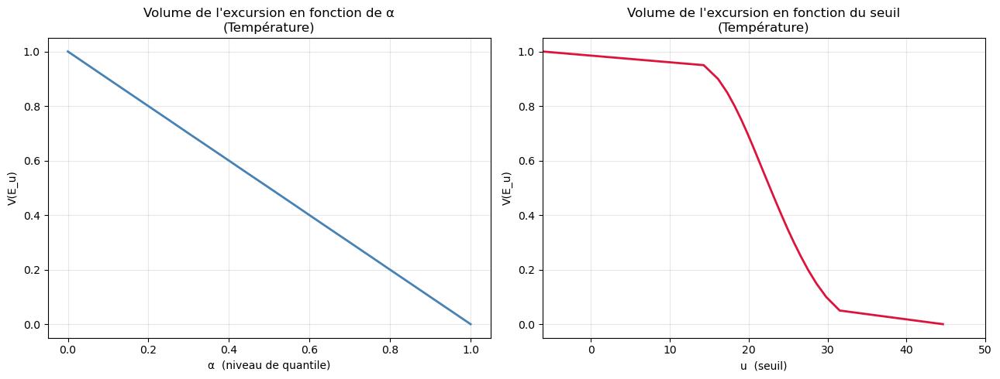

,alpha,u,V
0,0.00,-6.15,1.000000
1,0.05,14.30,0.949856
2,0.10,16.11,0.899691
3,0.15,17.28,0.849656
4,0.20,18.23,0.799631
5,0.25,19.07,0.749714
6,0.30,19.85,0.699400
7,0.35,20.58,0.649668
8,0.40,21.29,0.599729
9,0.45,22.00,0.549598


In [ ]:
# résulte pour le seuil constant
u = np.quantile(all_data['Température'], 0.95)
result_vol_constant_X = volume_excursion(all_data, 'Température', u)  
plot_volume(result_vol_constant_X, 'Température')
result_vol_constant_X

In [ ]:
# comparaison avec X guassien avec vraies données
gau_all_data = all_data.copy()
mu = all_data['Température'].mean()
sigma = all_data['Température'].std()
gau_all_data['X_gaussien'] = np.random.normal(loc=mu, scale=sigma, size=len(all_data))
u = np.quantile(gau_all_data['X_gaussien'], 0.95)
result_vol_gaussian = volume_excursion(gau_all_data, 'X_gaussien', u)  


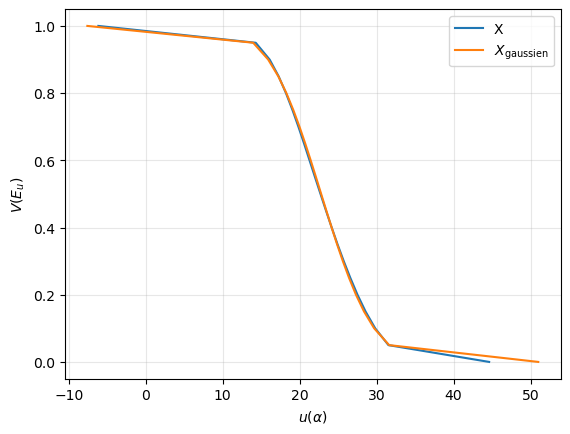

In [ ]:
plt.plot(
    result_vol_constant_X['u'],
    result_vol_constant_X['V'],
    label='X'
)

plt.plot(
    result_vol_gaussian['u'],
    result_vol_gaussian['V'],
    label=r'$X_{\mathrm{gaussien}}$'
)

plt.xlabel(r'$u(\alpha)$')
plt.ylabel(r'$V(E_u)$')
plt.legend()
plt.grid(alpha=0.3)
plt.show()

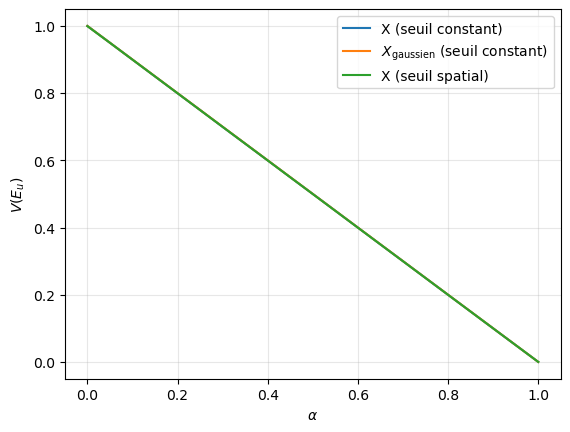

In [ ]:
# résulte pour le seuil spatial
result_vol_spatial = volume_excursion(all_data, 'Température', all_u_s_95)  

plt.plot(
    result_vol_constant_X['alpha'],
    result_vol_constant_X['V'],
    label='X (seuil constant)'
)

plt.plot(
    result_vol_gaussian['alpha'],
    result_vol_gaussian['V'],
    label=r'$X_{\mathrm{gaussien}}$ (seuil constant)'
)

plt.plot(
    result_vol_spatial['alpha'],
    result_vol_spatial['V'],
    label=r'X (seuil spatial)'
)

plt.xlabel(r'$\alpha$')
plt.ylabel(r'$V(E_u)$')
plt.legend()
plt.grid(alpha=0.3)
plt.show()


# Chapitre 5 : Transformation vers marges de Pareto standard $X^*$

Pour chaque site $s$, on estime empiriquement $F_{X(s)}$ à partir de la série temporelle, puis on applique :

$$X^*(s) = \frac{1}{1 - \hat{F}_{X(s)}(X(s))}$$

$\hat{F} = \text{rang} / (n+1)$ garantit $\hat{F} \in (0,1)$ et donc $X^*(s) \in (1, +\infty)$. Sous cette transformation, chaque marginale suit (asymptotiquement) une loi de Pareto standard.

In [ ]:
from scipy.stats import rankdata

def Xstar(x):
    '''
    x : array-like de valeurs (ex. températures à un point donné sur une période)
    Retourne un array de même taille avec les valeurs transformées en X* selon la formule
    X* = 1 / (1 - F_hat) où F_hat est l'estimation de la fonction de répartition empirique de x, gérée avec des rangs pour les ex-aequo.
    '''
    n = len(x)
    ranks = rankdata(x, method='average')   # gère les ex-aequo
    F_hat = ranks / (n + 1)
    return 1.0 / (1.0 - F_hat)
    

def compute_Xstar(data, var_col='Température', trans_col='X_star'):
    data = data.copy()
    data[trans_col] = (
        data.groupby(ID_COL)[var_col]
            .transform(Xstar)
    )
    return data

# Appliquer sur toutes les données
all_data_star = compute_Xstar(all_data)
print(f"X*(s) calculé — min={all_data_star['X_star'].min():.2f}, "
      f"max={all_data_star['X_star'].max():.1f}, "
      f"médiane={all_data_star['X_star'].median():.2f}")
all_data_star.head()

X*(s) calculé — min=1.00, max=1841.0, médiane=2.00


,id,Date,Latitude,Longitude,Température,X_star
0,1,1986-06-01,42.3488,1.99835,15.92,1.803134
1,1,1986-06-02,42.3488,1.99835,12.37,1.240566
2,1,1986-06-03,42.3488,1.99835,16.46,1.987048
3,1,1986-06-04,42.3488,1.99835,15.14,1.612084
4,1,1986-06-05,42.3488,1.99835,12.36,1.238480


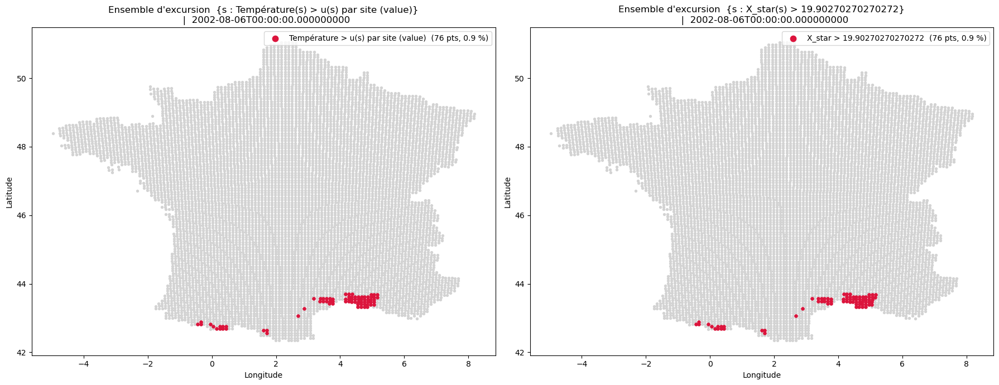

In [ ]:
def plot_excursion_X_Xstar(data, date, u, x, var_col='Température', trans_col='X_star'):
    day = data[data['Date'] == pd.Timestamp(date)].copy()

    E1 = excursion_set(day, u, var_col)  # ensemble d'excursion de X
    E2 = excursion_set(day, x, trans_col)  # ensemble d'excursion de X*
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))
    plot_excursion_set_2d(data, u, date, var_col, ax=ax1)
    plot_excursion_set_2d(data, x, date, trans_col, ax=ax2)
    plt.tight_layout()
    plt.show()



date = np.random.choice(all_data_star['Date'].unique())
u = all_u_s_95
x = np.quantile(all_data_star['X_star'], 0.95)
plot_excursion_X_Xstar(all_data_star, date, u, x)

## Volume normalisé de l'ensemble d'excursion pour un seuil spatial

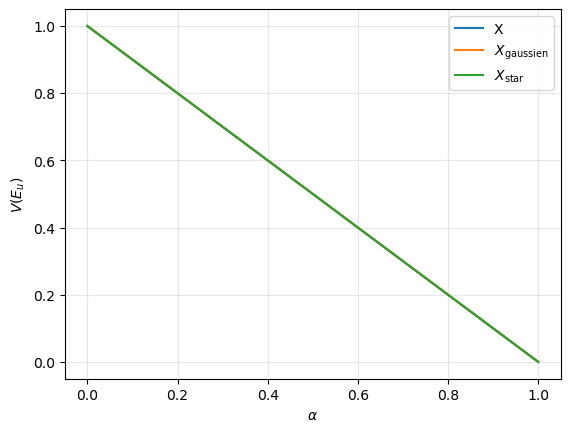

In [ ]:
x = np.quantile(all_data_star['X_star'], 0.95)
result_vol_constant_Xstar = volume_excursion(all_data_star, 'X_star', x)  



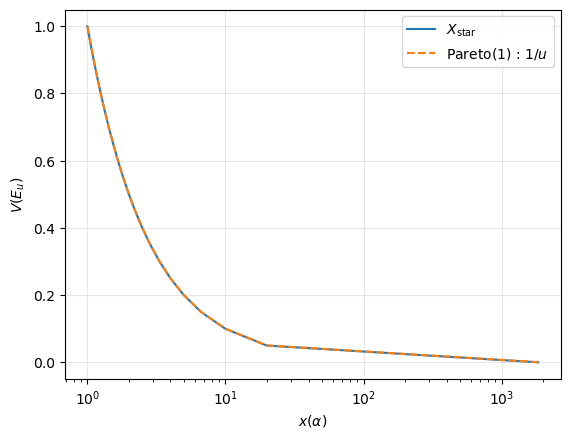

In [144]:
plt.plot(
    result_vol_constant_Xstar['u'],
    result_vol_constant_Xstar['V'],
    label=r'$X_{\mathrm{star}}$'
)

u_vals = result_vol_constant_Xstar['u'].values
u_pareto = u_vals[u_vals >= 1]

plt.plot(
    u_pareto,
    1 / u_pareto,
    '--',
    label=r'Pareto(1) : $1/u$'
)


plt.xlabel(r'$x(\alpha)$')
plt.ylabel(r'$V(E_u)$')
plt.xscale('log')
plt.legend()
plt.grid(alpha=0.3)
plt.show()

# Chapitre 6 : Évolution temporelle d'une qualité géométrique

In [42]:
def compute_qualite_temporelle(x, data, seuil, var_col):
    """
    Calcule l'évolution temporelle d'une qualité géométrique de l'ensemble d'excursion.

    Parameters
    ----------
    x        : str            — métrique : 'composants_connexes', 'aire', 'perimetre' ou 'R_max'
    data     : pd.DataFrame   — données complètes (toutes les dates)
    seuil    : float | pd.DataFrame — seuil scalaire ou DataFrame de seuils par site
    var_col  : str            — colonne de la variable (ex. 'Température' ou 'X_star')

    Returns
    -------
    pd.DataFrame — séries temporelles : Date + métrique(s)
    """
    valid = {'composants_connexes', 'aire', 'perimetre', 'R_max'}

    dates = np.sort(data[DATE_COL].unique())
    records = []

    for d in dates:
        day_data = data[data[DATE_COL] == d]
        E = excursion_set(day_data, seuil, var_col)

        if len(E) == 0:
            row = {'Date': d}
            if x == 'composants_connexes':
                row.update({'n4': 0, 'n8': 0})
            elif x == 'aire':
                row['area_km2'] = 0
            elif x == 'R_max':
                row['R_max_km'] = 0
            else:
                row['perimeter_km'] = 0
            records.append(row)
            continue

        if x == 'composants_connexes':
            _, n4, n8 = get_components_2d(E)
            records.append({'Date': d, 'n4': n4, 'n8': n8})

        elif x == 'aire':
            r = compute_area_2d(E)
            records.append({'Date': d, 'area_km2': r['area_km2']})

        elif x == 'R_max':
            r = R_max_for_date(d, data, seuil, var_col)
            records.append({'Date': d, 'R_max_km': r})

        else:
            r = compute_perimeter_2d(E)
            records.append({'Date': d, 'perimeter_km': r['perimeter_km']})

    df = pd.DataFrame(records)
    df['Date'] = pd.to_datetime(df['Date'])
    return df

In [43]:
compute_qualite_temporelle('aire', all_data_star, x, 'X_star')

,Date,area_km2
0,1986-06-01,0.0
1,1986-06-02,0.0
2,1986-06-03,1313.8
3,1986-06-04,4686.2
4,1986-06-05,0.0
...,...,...
1835,2005-08-27,3435.0
1836,2005-08-28,6766.8
1837,2005-08-29,5778.7
1838,2005-08-30,7319.7


In [44]:
def plot_qualite_temporelle(x, data, seuil,var_col,date_min=None, date_max=None):
    """
    Trace l'évolution temporelle d'une qualité géométrique de l'ensemble d'excursion.

    Parameters
    ----------
    x, data, seuil, var_col
        — identiques à compute_qualite_temporelle
    df : pd.DataFrame, optional
        — résultat pré-calculé de compute_qualite_temporelle ; si fourni,
          le calcul est ignoré.

    Returns
    -------
    pd.DataFrame — séries temporelles : Date + métrique(s)
    """

    df = compute_qualite_temporelle(x, data, seuil,var_col)

    # ── Restriction temporelle éventuelle ────────────────────────────
    if date_min is not None:
        df = df[df['Date'] >= pd.Timestamp(date_min)]
    if date_max is not None:
        df = df[df['Date'] <= pd.Timestamp(date_max)]
    df = df.reset_index(drop=True)

    seuil_label = ('u(s) par site' if isinstance(seuil, pd.DataFrame)
                   else f'{seuil:.2f}')

    # ── Axe x compressé : chaque été (juin-août) mis bout à bout ─────────────
    dates_ts = df['Date'].sort_values().values
    year_list = sorted(pd.to_datetime(dates_ts).year.unique())
    month_list = sorted(pd.to_datetime(dates_ts).month.unique())
    gap = 5

    x_pos_map = {}
    year_bounds = {}
    current_pos = 0

    for y in year_list:
        year_dates = sorted(pd.Timestamp(d) for d in dates_ts
                            if pd.Timestamp(d).year == y)
        if not year_dates:
            continue
        start = current_pos
        for d in year_dates:
            x_pos_map[d] = current_pos
            current_pos += 1
        year_bounds[y] = (start, current_pos - 1)
        current_pos += gap

    df['x_pos'] = df['Date'].map(x_pos_map)

    tick_positions, tick_labels = [], []
    month_names = {1: 'Jan', 2: 'Fév', 3: 'Mar', 4: 'Avr', 5: 'Mai', 6: 'Juin', 7: 'Juil', 8: 'Août', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Déc'}
    for y in year_list:
        first_month = True
        for m in month_list:
            month_dates = [d for d in x_pos_map if d.year == y and d.month == m]
            if month_dates:
                pos = x_pos_map[min(month_dates)]
                tick_positions.append(pos)
                label = f'{m}\n{y}' if first_month else str(m)
                tick_labels.append(label)
                first_month = False

    # ── Tracé ─────────────────────────────────────────────────────────────────
    fig, ax = plt.subplots(figsize=(14, 5))

    if x == 'composants_connexes':
        ax.plot(df['x_pos'], df['n4'], color='steelblue',  label='4-connexité')
        ax.plot(df['x_pos'], df['n8'], color='darkorange', label='8-connexité')
        ax.set_ylabel('Nombre de composantes connexes')
        ax.set_title(f'Composantes connexes  |  seuil = {seuil_label}  |  {var_col}')
        ax.legend()

    elif x == 'aire':
        #ax.scatter(df['x_pos'], df['area_km2'], color='crimson', s=20)
        ax.plot(df['x_pos'], df['area_km2'], color='crimson', lw=1.5, alpha=0.7)
        ax.set_ylabel('Aire (km²)')
        ax.set_title(f"Aire de l'ensemble d'excursion  |  seuil = {seuil_label}  |  {var_col}")

        
    elif x == 'R_max':
        ax.plot(df['x_pos'], df['R_max_km'], color='steelblue', lw=1.5, alpha=0.7)
        ax.set_ylabel('R_max (km)')
        ax.set_title(f"Rayon inscrit maximal  |  seuil = {seuil_label}  |  {var_col}")

    else:
        ax.plot(df['x_pos'], df['perimeter_km'], color='seagreen', lw=1.5, alpha=0.7)
        ax.set_ylabel('Périmètre (km)')
        ax.set_title(f"Périmètre de l'ensemble d'excursion  |  seuil = {seuil_label}  |  {var_col}")

    for y in year_list[:-1]:
        if y in year_bounds:
            sep_x = year_bounds[y][1] + gap / 2
            ax.axvline(x=sep_x, color='grey', linestyle='--', alpha=0.5, linewidth=0.8)

    ax.set_xlabel('Date')
    ax.set_xticks(tick_positions)
    ax.set_xticklabels(tick_labels, fontsize=8)
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

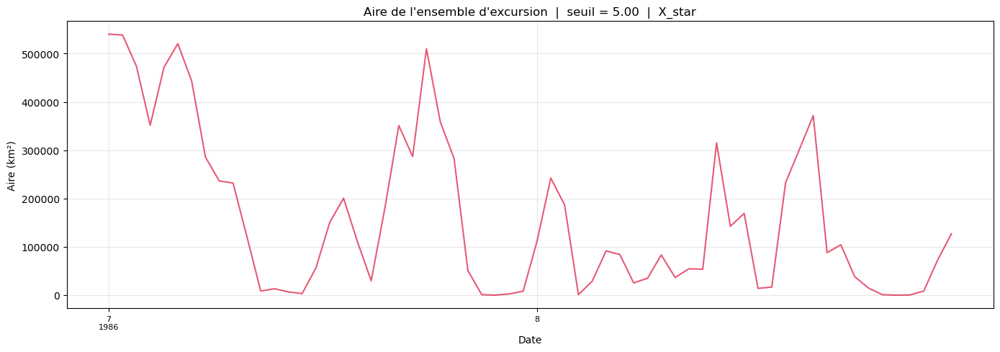

In [45]:
x = np.quantile(all_data_star['X_star'], 0.8)
df_aire = plot_qualite_temporelle('aire', all_data_star, x, 'X_star', date_min='1986-07-01', date_max='1986-08-31')

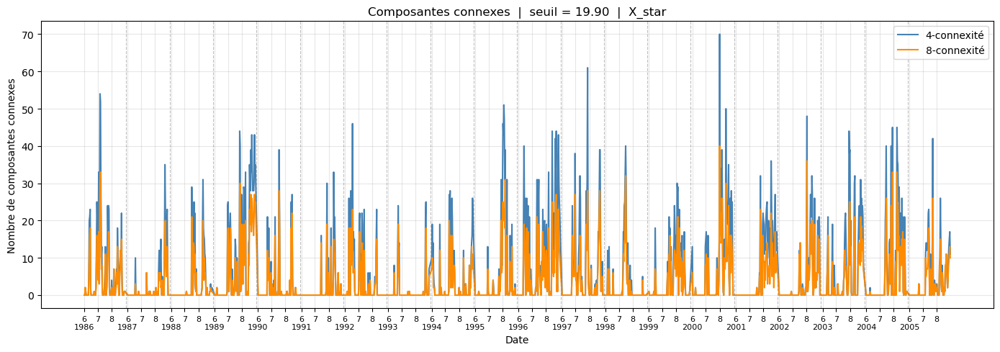

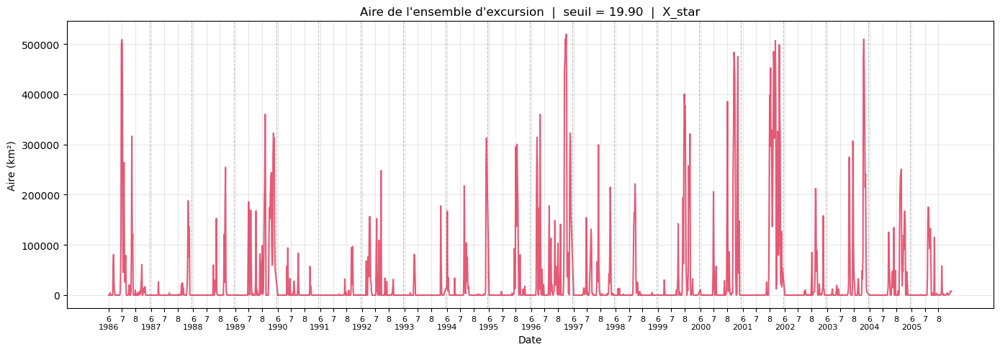

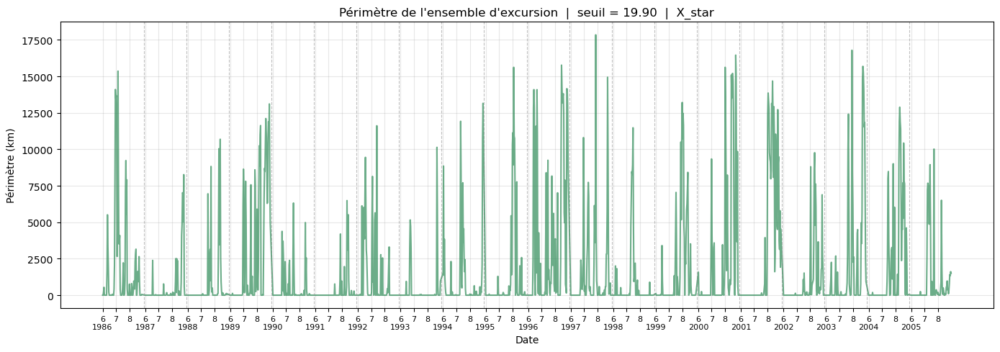

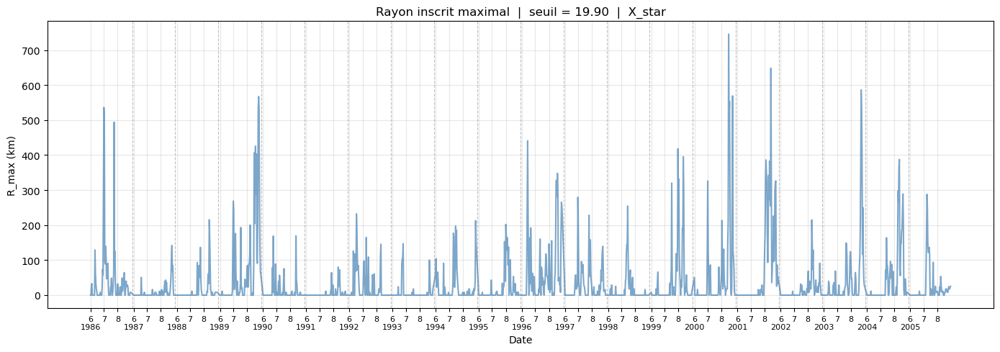

In [46]:
# ── Exemples d'utilisation ────────────────────────────────────────────────────
x = np.quantile(all_data_star['X_star'], 0.95)
# Composantes connexes
df_cc = plot_qualite_temporelle('composants_connexes', all_data_star, x, 'X_star')

# Aire 
df_aire = plot_qualite_temporelle('aire', all_data_star, x, 'X_star')

# Périmètre 
df_perim = plot_qualite_temporelle('perimetre', all_data_star, x, 'X_star')

# R_max 
df_rmax = plot_qualite_temporelle('R_max', all_data_star, x, 'X_star')


## Tests de stationnarité en temps des séries temporelles géométriques

La **stationnarité faible** exige deux conditions :

$$\mathbb{E}[X_t] = \mu \quad \text{(constante en } t)$$
$$\text{Cov}(X_t, X_{t+h}) = \gamma(h) \quad \text{(dépend uniquement du lag } h, \text{ pas de } t)$$

Les données étant des **étés concaténés** (juin-août par an), on traite chaque été comme un **bloc**
et on vérifie :
1. **Stabilité de la moyenne** : les moyennes par bloc sont-elles homogènes ? (test de Kruskal-Wallis)
2. **Stabilité de la variance** : les variances par bloc sont-elles homogènes ? (test de Levene)
3. **Autocovariance** : $\hat{\gamma}(h)$ estimée par bloc puis moyennée — doit ne dépendre que de $h$

On complète par deux tests sur la série complète :

4. **ADF** (Augmented Dickey-Fuller) : $H_0$ = racine unitaire (non-stationnaire). On rejette $H_0$ si $p < \alpha$ → série stationnaire.
5. **KPSS** (Kwiatkowski-Phillips-Schmidt-Shin) : $H_0$ = stationnaire. On rejette $H_0$ si $p < \alpha$ → série non-stationnaire.

**Règle de décision ADF + KPSS :**

| ADF rejette $H_0$ | KPSS rejette $H_0$ | Conclusion |
|:-:|:-:|:--|
| ✓ | ✗ | **Stationnaire** |
| ✗ | ✓ | **Non-stationnaire** |

else : Ambigu

In [47]:
x = np.quantile(all_data_star['X_star'], 0.95)

# ── 1. Collecter les 4 séries ─────────────────────────────────────────────────
df_aire_ts_95  = compute_qualite_temporelle('aire',                all_data_star,
                                          seuil=x, var_col='X_star')
df_perim_ts_95 = compute_qualite_temporelle('perimetre',           all_data_star,
                                          seuil=x, var_col='X_star')
df_cc_ts_95    = compute_qualite_temporelle('composants_connexes', all_data_star,
                                          seuil=x, var_col='X_star')
df_rmax_ts_95  = compute_qualite_temporelle('R_max',               all_data_star,
                                          seuil=x, var_col='X_star')

df_cc_ts_95 = df_cc_ts_95[['Date', 'n4']].rename(columns={'n4': 'n_composantes'})

In [48]:
series_dict_95 = {
    'Aire'                 : df_aire_ts_95[['Date', 'area_km2']].copy(),
    'Périmètre'            : df_perim_ts_95[['Date', 'perimeter_km']].copy(),
    'Composantes connexes' : df_cc_ts_95[['Date', 'n_composantes']].copy(),
    'R_max'                : df_rmax_ts_95[['Date', 'R_max_km']].copy(),
}

def get_val_col(df):
    return [c for c in df.columns if c != 'Date'][0]

for name, df in series_dict_95.items():
    col = get_val_col(df)
    print(f"{name:25s} |  "
          f"n restants={df[col].notna().sum()}")

Aire                      |  n restants=1840
Périmètre                 |  n restants=1840
Composantes connexes      |  n restants=1840
R_max                     |  n restants=1840


In [49]:
import warnings
from statsmodels.tsa.stattools import adfuller, kpss

def test_stationarite_blocs(name, df, alpha=0.05):
    """
    Tests combinés de stationnarité :
      - ADF            : H0 = racine unitaire (non-stationnaire) — rejeter → stationnaire
      - KPSS           : H0 = stationnaire — rejeter → non-stationnaire

    Conclusion basée sur ADF + KPSS :
      ADF rejette  + KPSS ne rejette pas → Stationnaire
      ADF ne rejette pas + KPSS rejette  → Non-stationnaire
      sinon                              → Ambigu
    """
    col = get_val_col(df)
    df_ = df[['Date', col]].copy()
    df_['year'] = pd.to_datetime(df_['Date']).dt.year

    # ── ADF : H0 = racine unitaire ────────────────────────────────────────────
    adf_stat, adf_p, *_ = adfuller(df_[col], autolag='AIC')
    adf_reject = adf_p < alpha   # True → stationnaire

    # ── KPSS : H0 = stationnaire ──────────────────────────────────────────────
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        kpss_stat, kpss_p, *_ = kpss(df_[col], regression='c', nlags='auto')
    kpss_reject = kpss_p < alpha  # True → non-stationnaire

    # ── Conclusion ADF + KPSS ─────────────────────────────────────────────────
    if adf_reject and not kpss_reject:
        conclusion = 'Stationnaire'
    elif not adf_reject and kpss_reject:
        conclusion = 'Non-stationnaire'
    else:
        conclusion = 'Ambigu'

    return {
        'Série'             : name,
        'ADF stat'          : round(adf_stat, 3),
        'ADF p-value'       : round(adf_p, 4),
        'ADF H0 rejetée'    : adf_reject,
        'KPSS stat'         : round(kpss_stat, 3),
        'KPSS p-value'      : round(kpss_p, 4),
        'KPSS H0 rejetée'   : kpss_reject,
        'Conclusion'        : conclusion,
    }


rows = [test_stationarite_blocs(name, df) for name, df in series_dict_95.items()]
df_results = pd.DataFrame(rows).set_index('Série')
df_results

,ADF stat,ADF p-value,ADF H0 rejetée,KPSS stat,KPSS p-value,KPSS H0 rejetée,Conclusion
Série,,,,,,,
Aire,-8.880,0.0,True,0.315,0.1,False,Stationnaire
Périmètre,-9.364,0.0,True,0.319,0.1,False,Stationnaire
Composantes connexes,-13.227,0.0,True,0.245,0.1,False,Stationnaire
R_max,-9.287,0.0,True,0.278,0.1,False,Stationnaire


## Estimation de l'ordre p d'un modèle AR(p)

Les séries étant stationnaires, on cherche à les modéliser par un processus autorégressif d'ordre $p$ :

$$X_t = \mu + \phi_1 X_{t-1} + \cdots + \phi_p X_{t-p} + \varepsilon_t, \quad \varepsilon_t \sim \mathcal{N}(0, \sigma^2)$$


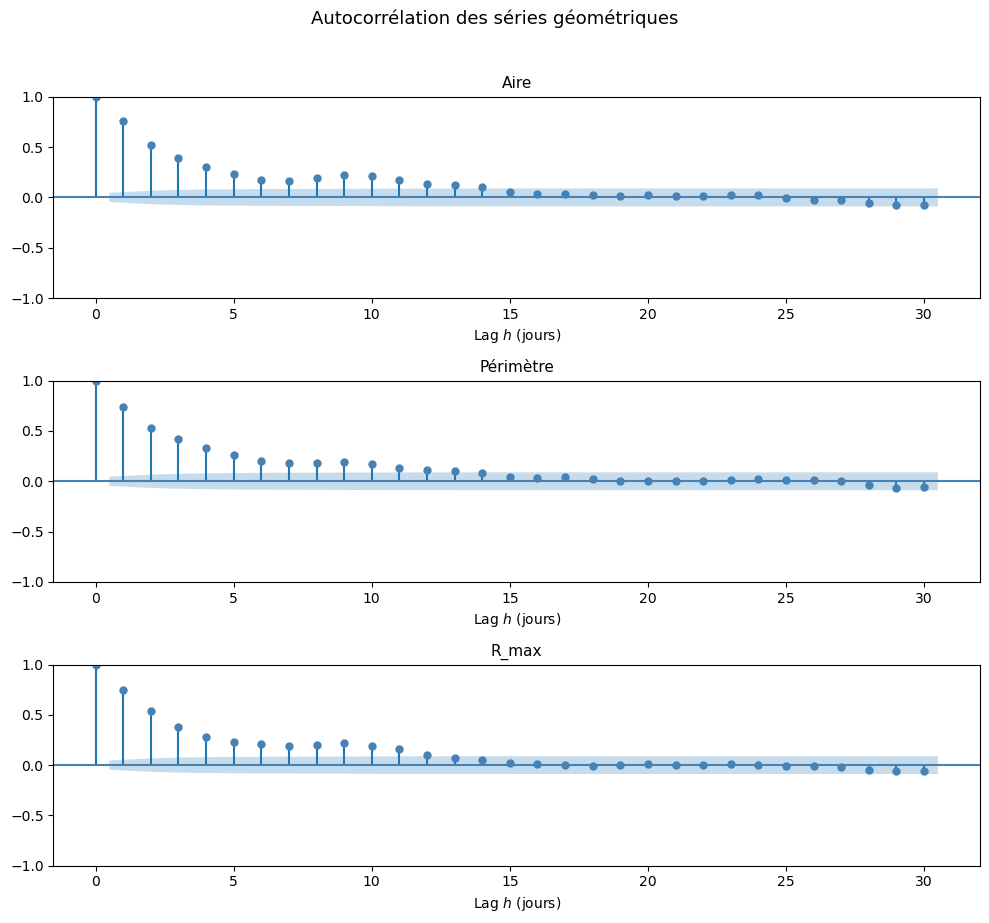

In [50]:
# acf plots
from statsmodels.graphics.tsaplots import plot_acf

series_dict_ar = series_dict_95.copy()
del series_dict_ar['Composantes connexes']    

fig, axes = plt.subplots(len(series_dict_ar), 1,
                          figsize=(10, 3 * len(series_dict_ar)))

for ax, (name, df) in zip(axes, series_dict_ar.items()):
    col   = get_val_col(df)
    df_   = df[['Date', col]].copy()
    s=df_[col]
    # lag h : h jour après, on regarde la corrélation entre s(t) et s(t+h)
    n_lags  = min(30, len(s) // 4) # min 30 jour(1 mois), len(s)//4 éviter d'avoir trop de lags si la série est courte

    plot_acf(s, ax=ax, lags=n_lags, alpha=0.05, color='steelblue')
    ax.set_title(f'{name}', fontsize=11)
    ax.set_xlabel('Lag $h$ (jours)')

plt.suptitle("Autocorrélation des séries géométriques",
             fontsize=13, y=1.02)
plt.tight_layout()
plt.show()

### PACF plot

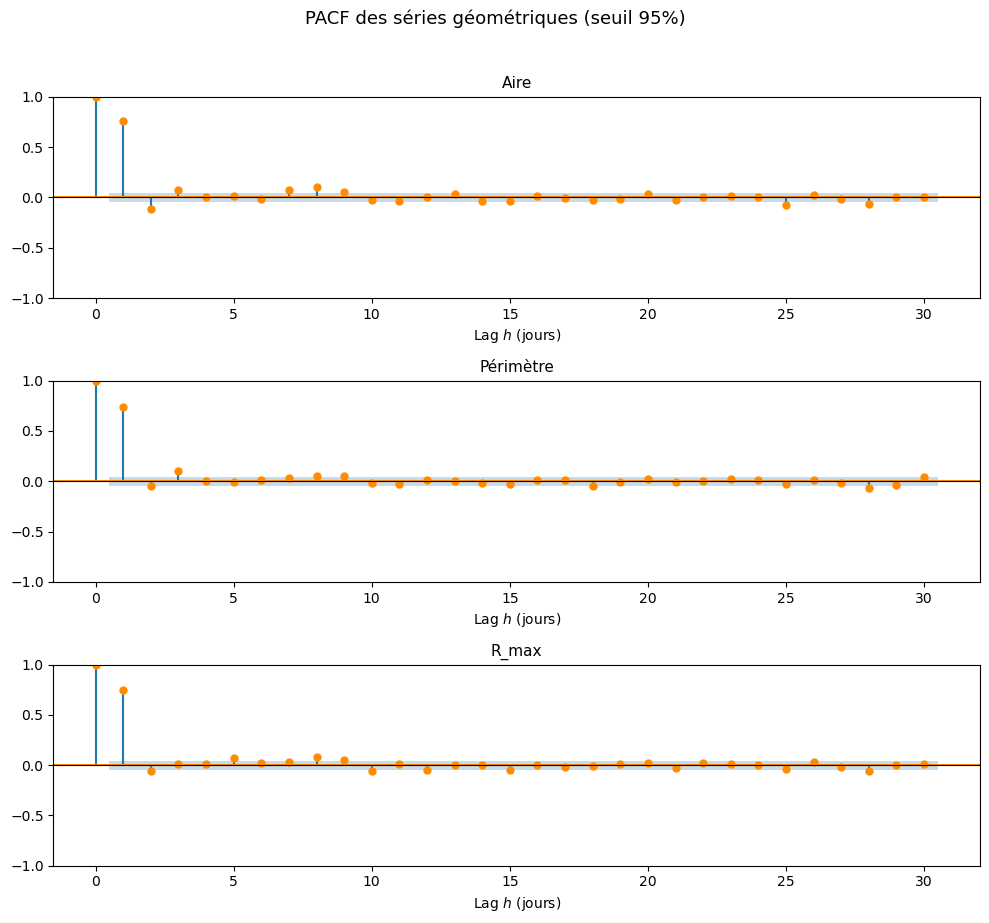

In [51]:
from statsmodels.graphics.tsaplots import plot_pacf

fig, axes = plt.subplots(len(series_dict_ar), 1,
                          figsize=(10, 3 * len(series_dict_ar)))

for ax, (name, df) in zip(axes, series_dict_ar.items()):
    col   = get_val_col(df)
    df_   = df[['Date', col]].copy()
    #df_[col] = df_[col].replace([np.inf, -np.inf], np.nan)
    #s_clean = df_[col].dropna().reset_index(drop=True)
    s=df_[col]
    n_lags  = min(30, len(s) // 4)

    plot_pacf(s, ax=ax, lags=n_lags, alpha=0.05,
              method='ywm', color='darkorange')          # method='ywm' : Yule-Walker method with MLE adjustment
                                                                         #yule-walker et maximum de vraisemblance
    ax.set_title(f'{name}', fontsize=11)
    ax.set_xlabel('Lag $h$ (jours)')
    ax.axhline(0, color='k', lw=0.8)

plt.suptitle("PACF des séries géométriques (seuil 95%)",
             fontsize=13, y=1.02)
plt.tight_layout()
plt.show()

### AIC / BIC

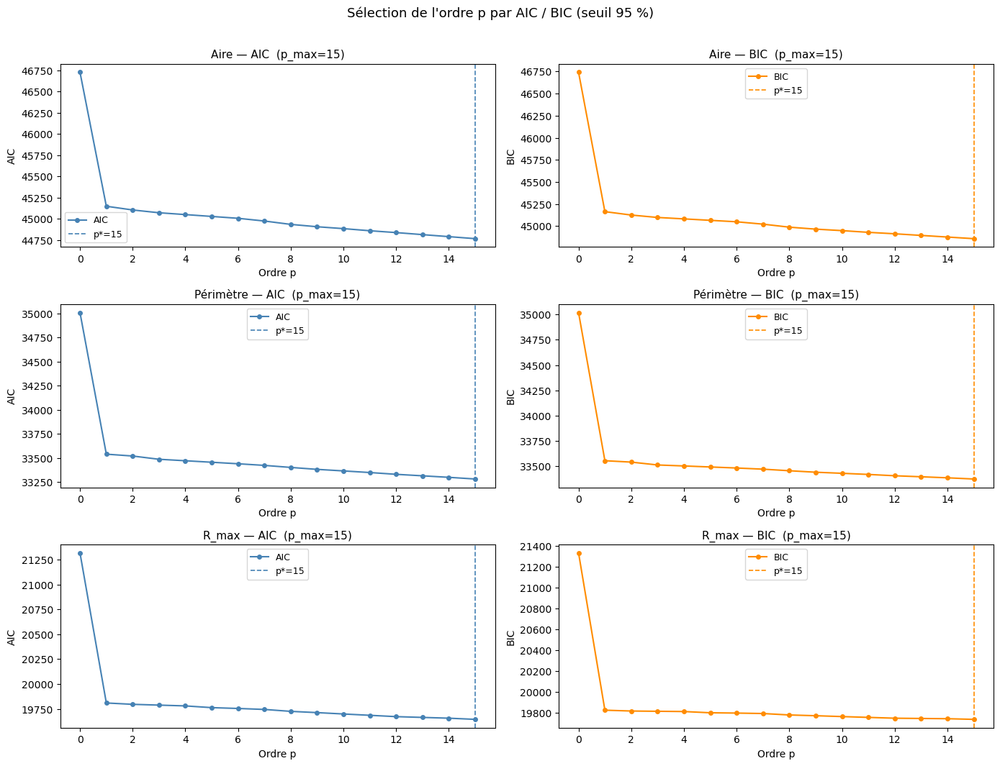

,p_max,p (AIC),AIC min,p (BIC),BIC min
Série,,,,,
Aire,15,15,44765.15,15,44858.81
Périmètre,15,15,33279.89,15,33373.55
R_max,15,15,19644.01,15,19737.67


In [52]:
from statsmodels.tsa.ar_model import AutoReg

results_aic_bic = []

fig, axes = plt.subplots(len(series_dict_ar), 2,
                          figsize=(14, 3.5 * len(series_dict_ar)),
                          sharex=False)

for row_idx, (name, df) in enumerate(series_dict_ar.items()):
    col   = get_val_col(df)
    df_   = df[['Date', col]].copy()
    s = df_[col]

    p_max = 15    

    p_vals, aic_vals, bic_vals = [], [], []

    for p in range(0, p_max + 1):
        try:  
            with warnings.catch_warnings():  # ignorer les warnings liés à des modèles mal ajustés pour certains p
                warnings.simplefilter('ignore')
                res = AutoReg(s, lags=p, old_names=False).fit()
            p_vals.append(p)
            aic_vals.append(res.aic)
            bic_vals.append(res.bic)
        except Exception:
            pass

    p_opt_aic = p_vals[np.argmin(aic_vals)]
    p_opt_bic = p_vals[np.argmin(bic_vals)]

    results_aic_bic.append({
        'Série'    : name,
        'p_max'    : p_max,
        'p (AIC)'  : p_opt_aic,
        'AIC min'  : round(min(aic_vals), 2),
        'p (BIC)'  : p_opt_bic,
        'BIC min'  : round(min(bic_vals), 2),
    })

    # AIC curve
    ax_aic = axes[row_idx, 0]
    ax_aic.plot(p_vals, aic_vals, marker='o', ms=4, color='steelblue', label='AIC')
    ax_aic.axvline(p_opt_aic, color='steelblue', ls='--', lw=1.2,
                   label=f'p*={p_opt_aic}')
    ax_aic.set_title(f'{name} — AIC  (p_max={p_max})', fontsize=11)
    ax_aic.set_xlabel('Ordre p')
    ax_aic.set_ylabel('AIC')
    ax_aic.legend(fontsize=9)

    # BIC curve
    ax_bic = axes[row_idx, 1]
    ax_bic.plot(p_vals, bic_vals, marker='o', ms=4, color='darkorange', label='BIC')
    ax_bic.axvline(p_opt_bic, color='darkorange', ls='--', lw=1.2,
                   label=f'p*={p_opt_bic}')
    ax_bic.set_title(f'{name} — BIC  (p_max={p_max})', fontsize=11)
    ax_bic.set_xlabel('Ordre p')
    ax_bic.set_ylabel('BIC')
    ax_bic.legend(fontsize=9)

plt.suptitle("Sélection de l'ordre p par AIC / BIC (seuil 95 %)",
             fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

# Tableau récapitulatif
df_aic_bic = pd.DataFrame(results_aic_bic).set_index('Série')
df_aic_bic


## Probabilité d'excursion conditionnelle $\hat{p}(h, \alpha)$

On étudie la **persistance temporelle des extrêmes** d'un fonctionnel géométrique $A_t$ (aire, périmètre, $R_{\max}$, …).

**Estimateur :**

$$\hat{p}(h, \alpha) \;=\; \frac{\dfrac{1}{n-h}\displaystyle\sum_{t=1}^{n-h} \mathbf{1}(A_{t+h} > a_\alpha,\; A_t > a_\alpha)}{\dfrac{1}{n}\displaystyle\sum_{t=1}^{n} \mathbf{1}(A_t > a_\alpha)}$$

où $a_\alpha = Q_\alpha(A_t)$ est le quantile d'ordre $\alpha$.

**Lecture :** si $A_t$ est i.i.d. alors $\hat{p}(h,\alpha) \approx 1-\alpha$. Une valeur $> 1-\alpha$ indique de la **persistance** (clustering des extrêmes).

In [53]:
def compute_conditional_exceedance(df_series, val_col, h_max=15):
    """
    Estime la probabilité d'excursion conditionnelle :

        p_hat(h, alpha) = P(A_{t+h} > a_alpha | A_t > a_alpha)

    Formule de l'estimateur empirique (voir Chapitre 7) :

        numérateur  = (1/(n-h)) * sum_{t=1}^{n-h} 1(A_{t+h} > a_alpha, A_t > a_alpha)
        dénominateur = (1/n)     * sum_{t=1}^{n}   1(A_t > a_alpha)

    Seules les paires (t, t+h) séparées d'exactement h jours calendaires sont retenues,
    ce qui évite de mélanger la fin d'un été avec le début du suivant.

    Parameters
    ----------
    df_series : pd.DataFrame
        Série temporelle du fonctionnel géométrique (une ligne par date).
        Doit contenir la colonne DATE_COL (globale) et val_col.
    val_col : str
        Nom du fonctionnel à analyser, ex. 'area_km2', 'R_max_km', 'perimeter_km'.
    h_max : int
        Lag maximal à calculer (défaut : 10 jours).

    Returns
    -------
    pd.DataFrame
        Matrice p_hat de forme (len(alphas), h_max).
        Index = niveaux alpha, colonnes = lags h = 1..h_max.
    """
    # ── Grille de quantiles ─────────────────────────────────────────
    alphas = np.arange(0.10, 0.999, 0.01)

    # ── Préparation de la série temporelle ────────────────────────────────────
    df = df_series.copy()

    # Les jours sans excursion (excursion vide → NaN dans compute_qualite_temporelle)
    # sont remplacés par 0, car le fonctionnel (aire, R_max…)
    # vaut naturellement 0 quand aucun point ne dépasse le seuil.
    df[val_col] = df[val_col].fillna(0)

    # Trier chronologiquement pour que les décalages d'indice correspondent
    # bien aux décalages temporels.
    df = df.sort_values(DATE_COL).reset_index(drop=True)

    dates = pd.to_datetime(df[DATE_COL]).values   # tableau numpy de dates
    A     = df[val_col].values                    # tableau numpy du fonctionnel A_t
    n     = len(A)

    # Matrice résultat : NaN par défaut (remplie au fur et à mesure)
    result = np.full((len(alphas), h_max), np.nan)

    # ── Boucle sur les niveaux alpha ──────────────────────────────────────────
    for i, alpha in enumerate(alphas):

        # Seuil a_alpha = quantile d'ordre alpha de la série A_t
        # C'est la valeur que A_t doit dépasser pour être considéré "extrême".
        a_alpha = np.quantile(A, alpha)

        # Indicatrice d'excès : 1 si A_t > a_alpha, 0 sinon
        exceed = A > a_alpha

        # Dénominateur = fréquence empirique d'excès de la série entière.
        denom = exceed.mean()

        # Si aucun point ne dépasse le seuil (alpha trop proche de 1 sur
        # un petit jeu de données), on passe.
        #if denom == 0:
            #continue

        # ── Boucle sur les lags h = 1 … h_max ───────────────────────────────
        for h in range(1, h_max + 1):

            # Différence de jours entre les paires (t, t+h)
            diff_days = ((dates[h:] - dates[:n - h])
                         .astype('timedelta64[D]').astype(int))
            valid = diff_days == h              # s'il dépasse une année, on ne le garde pas

            # Sécurité : si moins de 5 paires valides, la statistique est
            # trop instable et on laisse NaN.
            #if valid.sum() < 5:
                #continue

            # Numérateur = fréquence des co-excès (A_t > a_alpha ET A_{t+h} > a_alpha)
            # sur les paires valides uniquement.
            joint = (exceed[:n - h][valid] & exceed[h:][valid]).mean()

            # p_hat(h, alpha) = P(A_{t+h} > a_alpha, A_t > a_alpha) / P(A_t > a_alpha)
            result[i, h - 1] = joint / denom

    # ── Retour sous forme de DataFrame lisible ────────────────────────────────
    return pd.DataFrame(
        result,
        index=np.round(alphas, 3),   # lignes = niveaux alpha
        columns=range(1, h_max + 1)  # colonnes = lags h
    )


In [54]:
def plot_conditional_exceedance(p_hat_df, title=''):
    """
    Trace p_hat(h, alpha) avec h en x et alpha en y,
    en reliant les points par des courbes de niveau (contour).

    Parameters
    ----------
    p_hat_df : pd.DataFrame
        Sortie de compute_conditional_exceedance.
        Index = alpha, colonnes = lags h = 1..h_max.
    title : str
        Titre additionnel.
    """
    h_vals     = np.array(p_hat_df.columns, dtype=float)   # 1...h_max
    alpha_vals = np.array(p_hat_df.index,   dtype=float)   # grille de alpha
    Z          = p_hat_df.values                           # shape (n_alpha, h_max)

    fig, ax = plt.subplots(figsize=(10, 6))

    # Fond rempli (dégradé de couleurs)
    cf = ax.contourf(h_vals, alpha_vals, Z, levels=15, cmap='YlOrRd')   # arrière-plan
    plt.colorbar(cf, ax=ax, label=r'$\hat{p}(h,\,\alpha)$')  

    # Courbes de niveau tracées par-dessus avec leurs valeurs
    cs = ax.contour(h_vals, alpha_vals, Z, levels=15,              # ligne de contour remplie
                    colors='black', linewidths=0.6, alpha=0.5)
    ax.clabel(cs, fmt='%.2f', fontsize=7)                          # anote les valeurs des contours

    ax.set_xlabel('Lag $h$ (jours)')
    ax.set_ylabel(r'Niveau $\alpha$')
    ax.set_xticks(h_vals.astype(int))
    ax.set_title(f'Probabilité d\'excursion conditionnelle\n{title}')

    plt.tight_layout()
    plt.show()
    return 

         1      2      3      4      5      6      7      8      9      10  \
0.10  0.785  0.689  0.655  0.623  0.591  0.572  0.558  0.544  0.547  0.540   
0.11  0.785  0.689  0.655  0.623  0.591  0.572  0.558  0.544  0.547  0.540   
0.12  0.785  0.689  0.655  0.623  0.591  0.572  0.558  0.544  0.547  0.540   
0.13  0.785  0.689  0.655  0.623  0.591  0.572  0.558  0.544  0.547  0.540   
0.14  0.785  0.689  0.655  0.623  0.591  0.572  0.558  0.544  0.547  0.540   
...     ...    ...    ...    ...    ...    ...    ...    ...    ...    ...   
0.95  0.626  0.422  0.326  0.261  0.230  0.209  0.200  0.226  0.241  0.232   
0.96  0.587  0.387  0.307  0.254  0.229  0.188  0.190  0.222  0.255  0.258   
0.97  0.596  0.402  0.258  0.168  0.132  0.134  0.155  0.196  0.238  0.240   
0.98  0.601  0.387  0.196  0.254  0.171  0.145  0.117  0.237  0.210  0.182   
0.99  0.532  0.269  0.163  0.110  0.000  0.000  0.057  0.115  0.117  0.000   

         11     12     13     14     15  
0.10  0.524  0.516  0

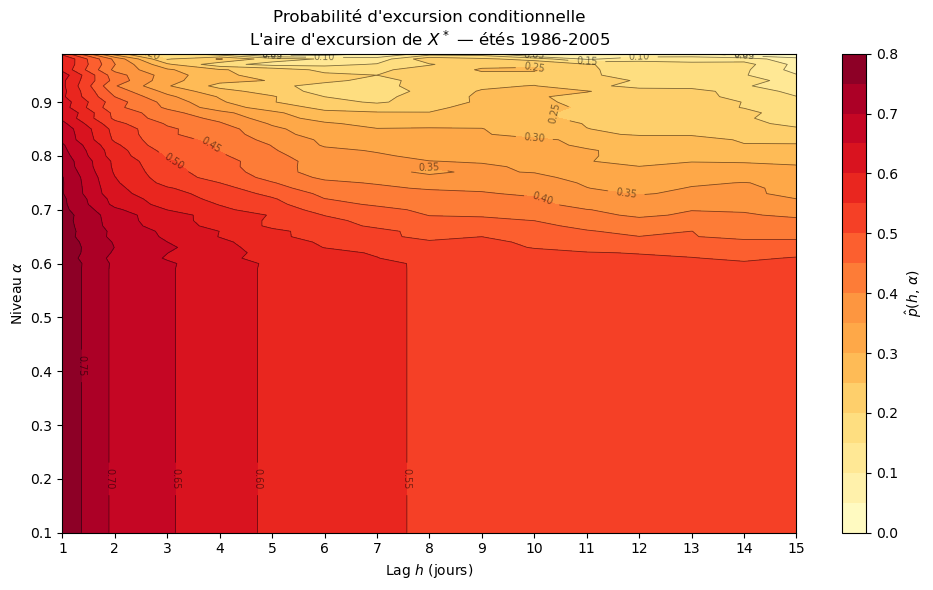

In [55]:
# ── Application : Aire de X* sur les étés 1986-2005 ──────────────────────────
x_seuil = np.quantile(all_data_star['X_star'], 0.95)


# Série temporelle du plus grand disque de l'excursion
df_aire = compute_qualite_temporelle('aire', all_data_star, x_seuil, 'X_star')

# Calcul de p_hat(h, alpha) pour h=1..15 et alpha=0.50..0.95
p_hat_aire = compute_conditional_exceedance(
    df_aire, val_col='area_km2', h_max=15
)

print(p_hat_aire.round(3))

plot_conditional_exceedance(p_hat_aire, title="L'aire d\'excursion de $X^*$ — étés 1986-2005")

# Chapitre 7 : QQ plot

In [56]:
# Tracer la position du point s sur la carte
def s_plot(s_id):
    date_carte = '2003-08-01'
    background = all_data[all_data['Date'] == pd.Timestamp(date_carte)].copy()
    s_row = background[background['id'] == s_id]
    # Tracer la position du point s sur la carte
    fig, ax = plt.subplots(figsize=(9, 7))
    ax.scatter(background['Longitude'], background['Latitude'],
            color='lightgrey', s=8, zorder=1)
    ax.scatter(s_row['Longitude'], s_row['Latitude'], s=120, zorder=5, marker='*',)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.set_title(f'Position du point s (id={s_id})')
    ax.legend(fontsize=9)
    ax.grid(True, alpha=0.2)
    plt.tight_layout()
    plt.show()

/var/folders/vw/x71ysw2x0pz7h6d64np8b0_80000gn/T/ipykernel_38567/227591240.py:14: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=9)


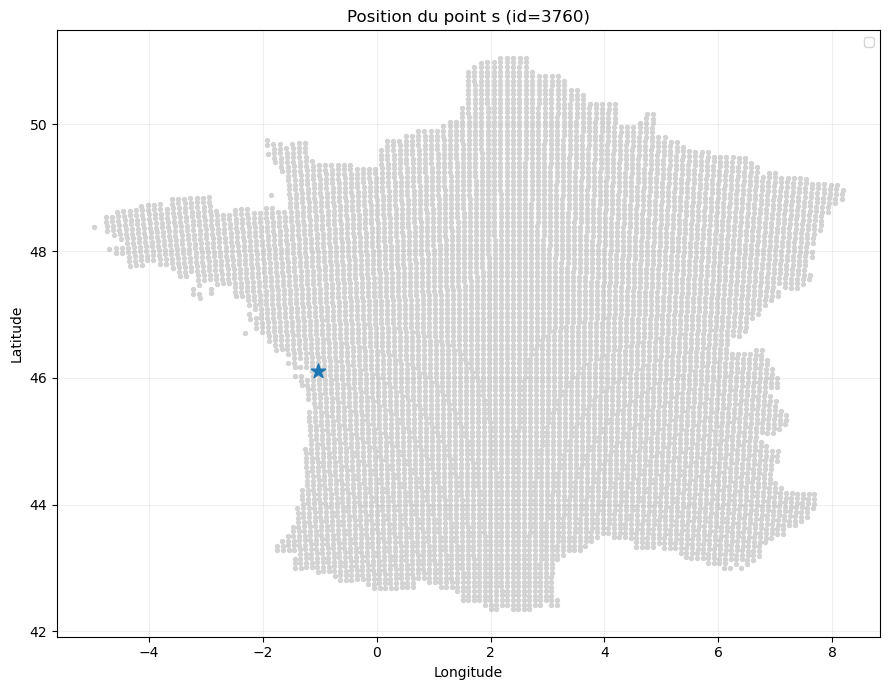

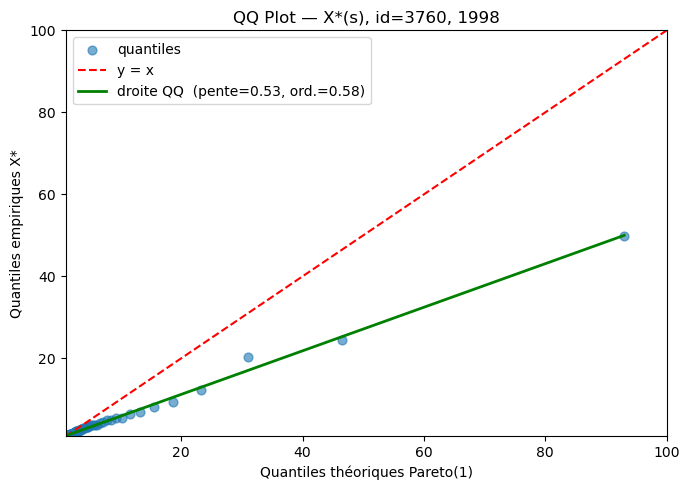

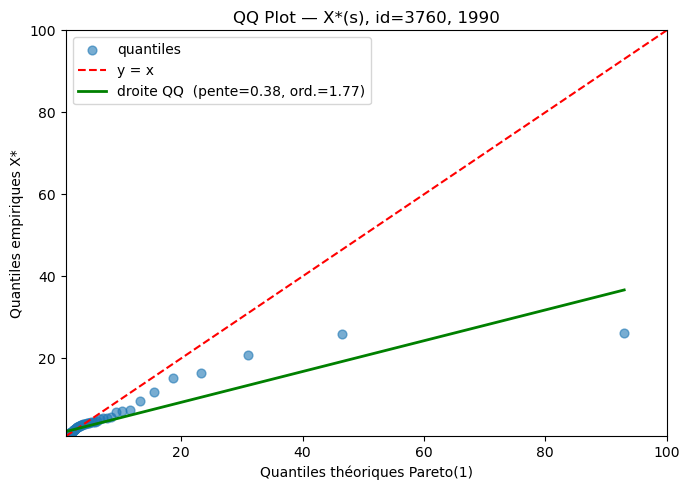

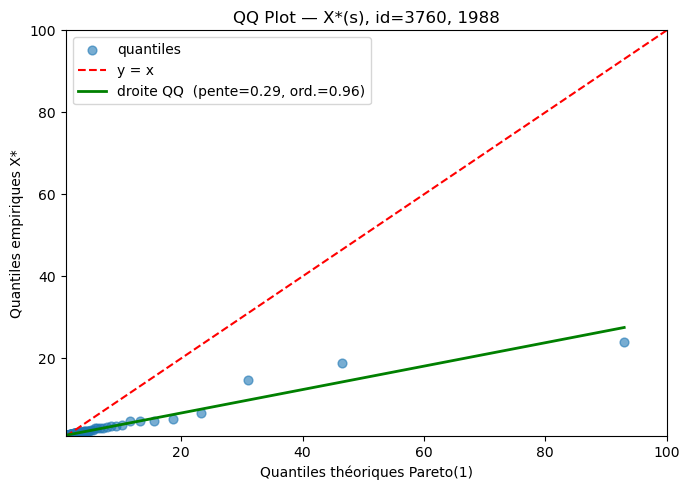

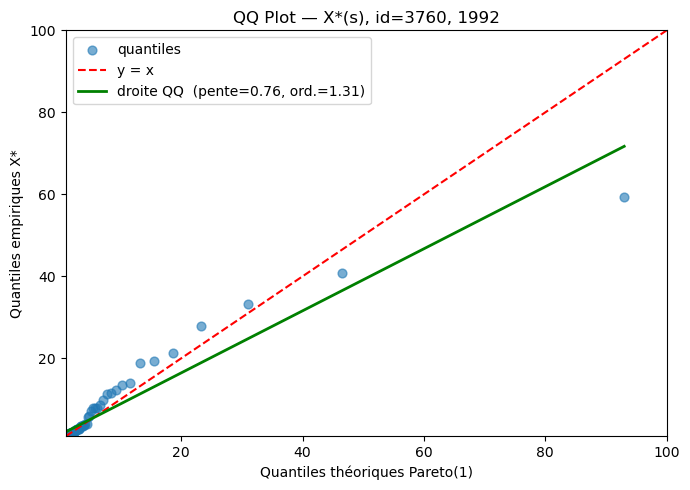

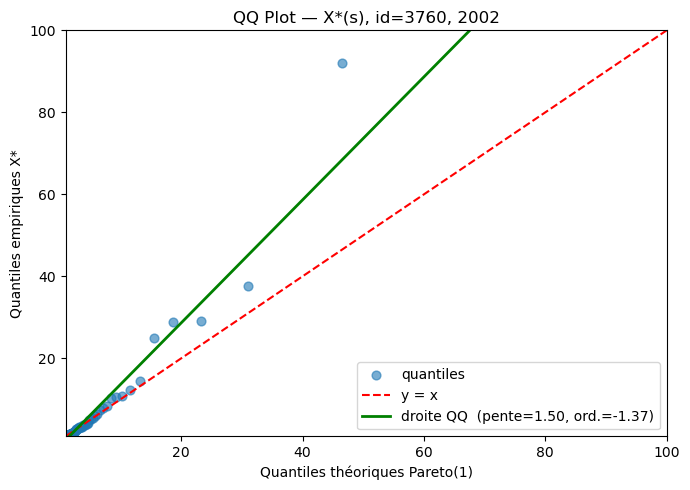

In [57]:
# tracer un point aléatoire et son QQ plot pour chaque été (5 étés choisis)

s_id = np.random.choice(all_data['id'].values)
s_plot(s_id)

all_years = sorted(all_data_star['Date'].dt.year.unique())
years = np.random.choice(all_years, size=5, replace=False)
for year in years:
    X_star_year = all_data_star[(all_data_star['id'] == s_id) &
                                   (all_data_star['Date'].dt.year == year)]['X_star'].values
    
    n = len(X_star_year)
    probs = np.arange(1, n + 1) / (n + 1)
    theo_q = stats.pareto.ppf(probs, b=1)
    emp_q  = np.sort(X_star_year)

    # ── Droite QQ (régression linéaire OLS) ──────────────────────────────────
    slope, intercept, *_ = stats.linregress(theo_q, emp_q)
    x_line = np.array([theo_q.min(), theo_q.max()])
    ## ── Tracé du QQ plot ─────────────────────────────────────────────────────
    fig, ax = plt.subplots(figsize=(7, 5))
    ax.scatter(theo_q, emp_q, alpha=0.6, s=40, label='quantiles')   # points du QQ plot
    q_min = stats.pareto.ppf(0.01, b=1)
    q_max = stats.pareto.ppf(0.99, b=1)
    ax.set_xlim(q_min, q_max); ax.set_ylim(q_min, q_max)
    ax.plot([q_min, q_max], [q_min, q_max], 'r--', lw=1.5, label='y = x')  # diagonale
    ax.plot(x_line, slope * x_line + intercept, 'g-', lw=2,
            label=f'droite QQ  (pente={slope:.2f}, ord.={intercept:.2f})')  # droite de régression
    ax.set_xlabel('Quantiles théoriques Pareto(1)')
    ax.set_ylabel('Quantiles empiriques X*')
    ax.set_title(f'QQ Plot — X*(s), id={s_id}, {year}')
    ax.legend()
    plt.tight_layout()
    plt.show()


/var/folders/vw/x71ysw2x0pz7h6d64np8b0_80000gn/T/ipykernel_38567/227591240.py:14: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=9)


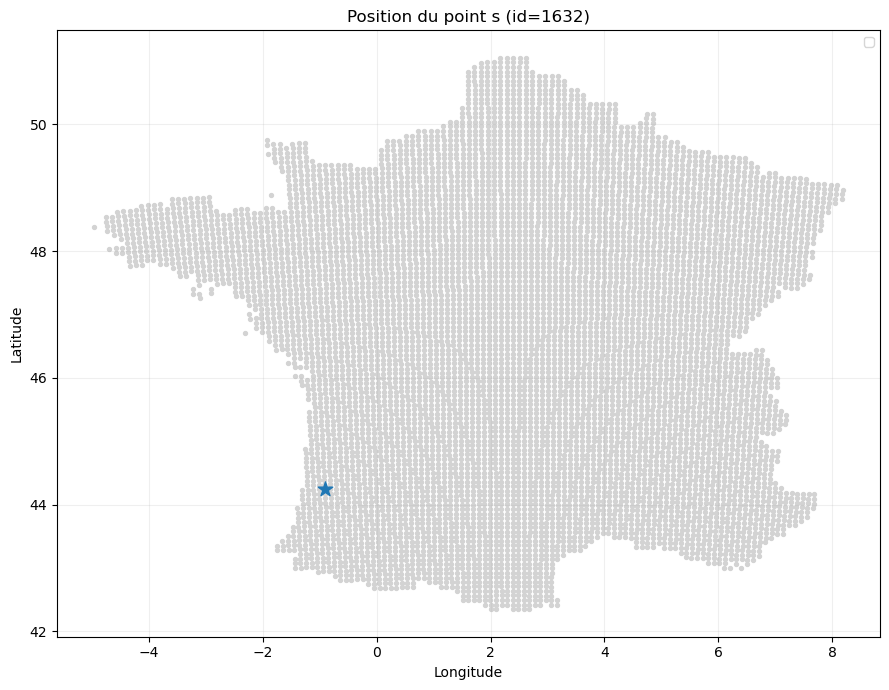

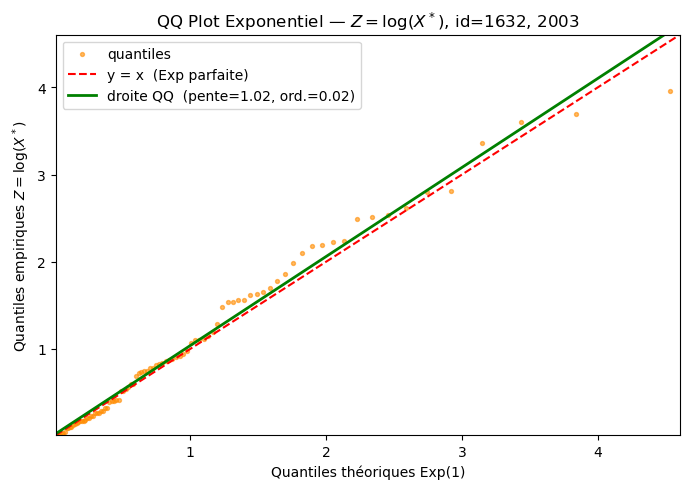

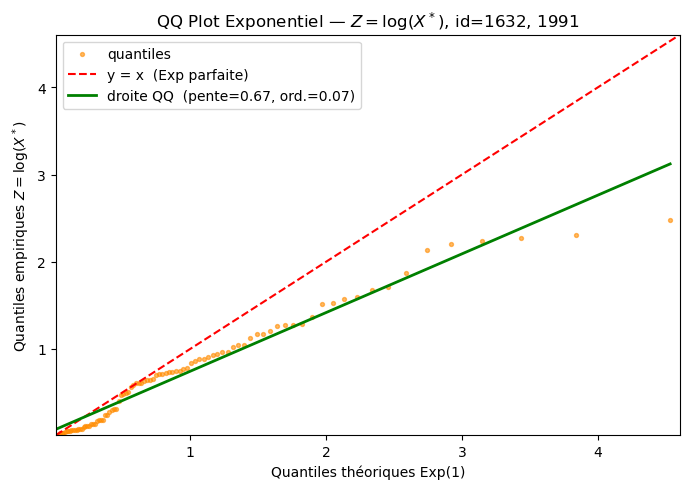

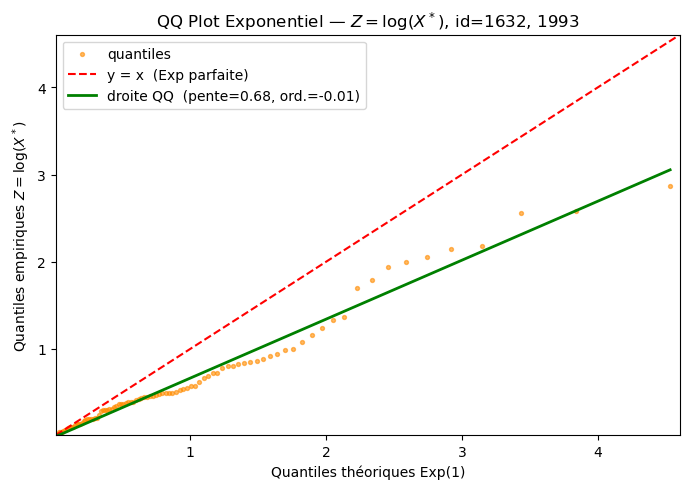

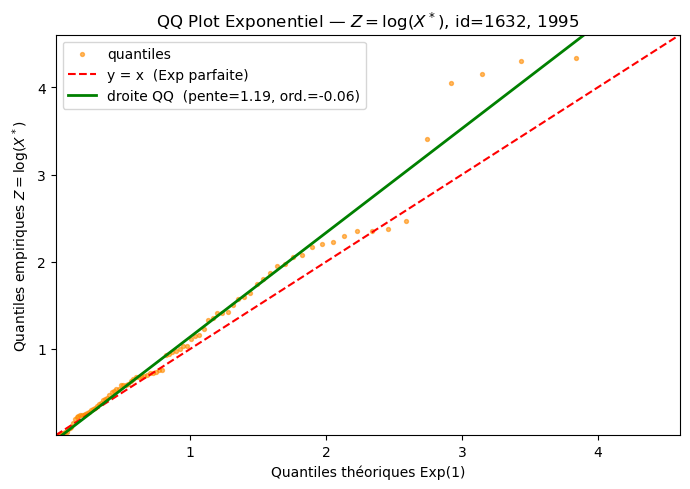

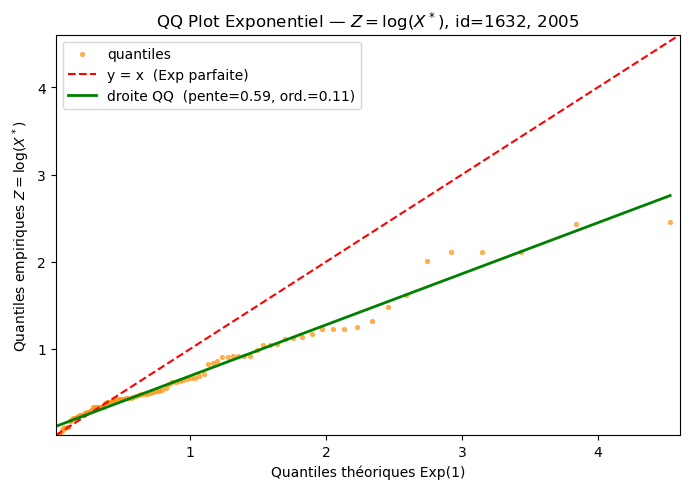

In [58]:
# QQ plot sous loi Exponentielle(1) — transformation Z = log(X*)
# Si X* ~ Pareto(1) alors Z = log(X*) ~ Exp(1)

s_id = np.random.choice(all_data['id'].values)
s_plot(s_id)

years = np.random.choice(all_years, size=5, replace=False)
for year in years:
    X_star_year = all_data_star[(all_data_star['id'] == s_id) &
                                   (all_data_star['Date'].dt.year == year)]['X_star'].values

    Z = np.log(X_star_year)          # Z ~ Exp(1)
    n = len(Z)
    probs   = np.arange(1, n + 1) / (n + 1)
    theo_q  = stats.expon.ppf(probs)
    emp_q   = np.sort(Z)

    # ── Droite QQ (régression linéaire OLS) ──────────────────────────────────
    slope, intercept, *_ = stats.linregress(theo_q, emp_q)
    x_line = np.array([theo_q.min(), theo_q.max()])

    fig, ax = plt.subplots(figsize=(7, 5))
    ax.scatter(theo_q, emp_q, s=8, alpha=0.6, color='darkorange', label='quantiles')
    q_min = stats.expon.ppf(0.01)
    q_max = stats.expon.ppf(0.99)
    ax.set_xlim(q_min, q_max); ax.set_ylim(q_min, q_max)
    ax.plot([q_min, q_max], [q_min, q_max], 'r--', lw=1.5, label='y = x  (Exp parfaite)')
    ax.plot(x_line, slope * x_line + intercept, 'g-', lw=2,
            label=f'droite QQ  (pente={slope:.2f}, ord.={intercept:.2f})')
    ax.set_xlabel('Quantiles théoriques Exp(1)')
    ax.set_ylabel(r'Quantiles empiriques $Z = \log(X^*)$')
    ax.set_title(f'QQ Plot Exponentiel — $Z=\log(X^*)$, id={s_id}, {year}')
    ax.legend()
    plt.tight_layout()
    plt.show()

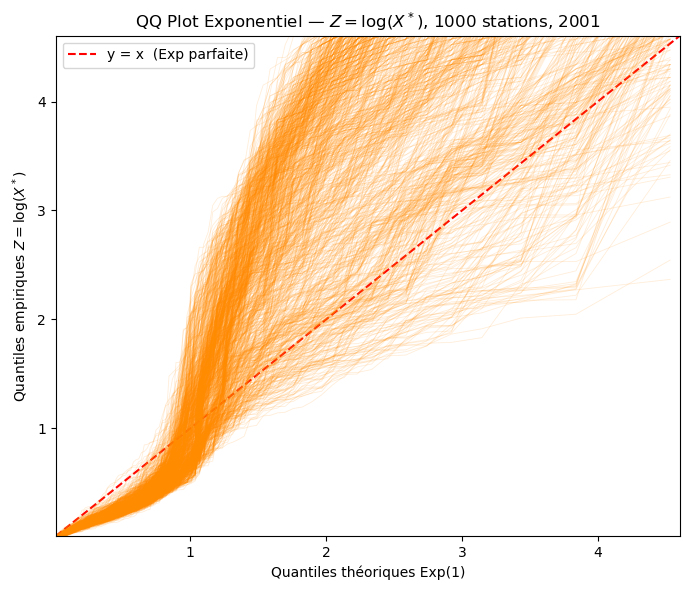

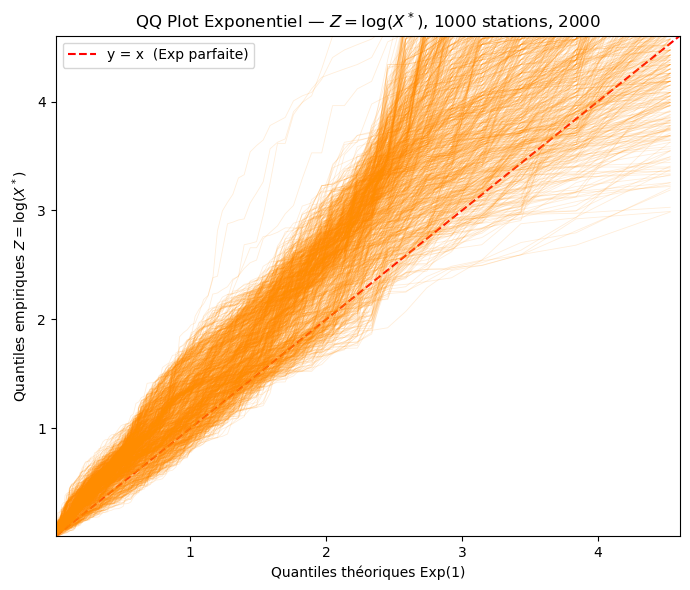

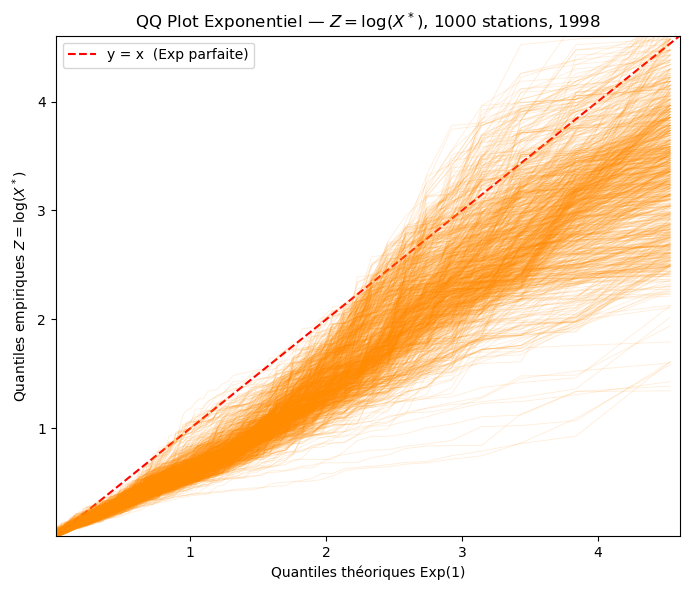

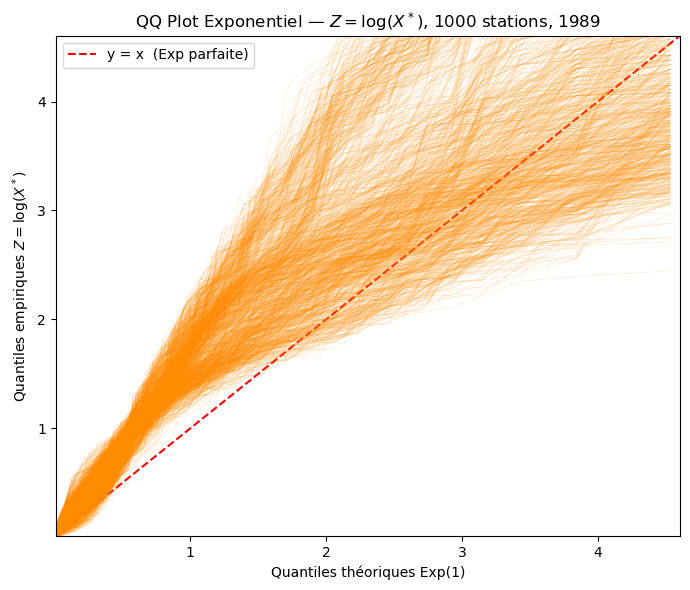

In [59]:
# QQ plot sous loi Exponentielle(1) — transformation Z = log(X*)
# Si X* ~ Pareto(1) alors Z = log(X*) ~ Exp(1)
# 1000 stations aléatoires : une ligne QQ par station, un graphique par année (1986-2005)

n_stations = 1000
all_ids    = all_data['id'].unique()
sample_ids = np.random.choice(all_ids, size=min(n_stations, len(all_ids)), replace=False)

years = np.random.choice(all_years, size=4, replace=False)

q_min = stats.expon.ppf(0.01)
q_max = stats.expon.ppf(0.99)

for year in years:
    data_year = all_data_star[all_data_star['id'].isin(sample_ids) &
                                 (all_data_star['Date'].dt.year == year)]

    fig, ax = plt.subplots(figsize=(7, 6))
    ax.plot([q_min, q_max], [q_min, q_max], 'r--', lw=1.5, label='y = x  (Exp parfaite)')

    for s_id, grp in data_year.groupby('id'):
        X_star_s = grp['X_star'].values
        Z = np.log(X_star_s)        
        n      = len(Z)
        probs  = np.arange(1, n + 1) / (n + 1)
        theo_q = stats.expon.ppf(probs)
        emp_q  = np.sort(Z)

        ax.plot(theo_q, emp_q, lw=0.6, alpha=0.15, color='darkorange')

    ax.set_xlim(q_min, q_max); ax.set_ylim(q_min, q_max)
    ax.set_xlabel('Quantiles théoriques Exp(1)')
    ax.set_ylabel(r'Quantiles empiriques $Z = \log(X^*)$')
    ax.set_title(f'QQ Plot Exponentiel — $Z=\log(X^*)$, {n_stations} stations, {year}')
    ax.legend()
    plt.tight_layout()
    plt.show()


## Classifiacation la future (2002-2005) par l'histoire (1986-2001)  

In [60]:
# ── QQ plot train (1986-2001) vs test (2002-2005), par station ──────────────
from scipy.interpolate import interp1d

def qq_residue(data_train, data_test, year, var_col='Température'):
    """
    QQ 2-échantillons par station, vectorisé sur toutes les stations à la fois :
    quantiles train (16 ans) interpolés sur la grille de probabilité de
    l'année `year` de test, résidu = test_q - train_q.

    Retourne un DataFrame long (une ligne par point de quantile et par
    station) avec les colonnes : id, train_q, test_q, residue.
    """
    test_year = data_test[data_test[DATE_COL].dt.year == year]

    pivot_tr = data_train.pivot_table(index=DATE_COL, columns=ID_COL, values=var_col)
    pivot_te = test_year.pivot_table(index=DATE_COL, columns=ID_COL, values=var_col)
    ids      = pivot_tr.columns.intersection(pivot_te.columns)
    
    
    if var_col == 'Precipitation':
        rows = []

        for s_id in ids:
            y_tr = pivot_tr[s_id].values
            y_te = pivot_te[s_id].values

            seuil = np.quantile(y_tr, 0.5)          # seuil sur le train uniquement

            exc_tr = np.sort(y_tr[y_tr > seuil] - seuil)
            exc_te = np.sort(y_te[y_te > seuil] - seuil)

            n_tr_s = len(exc_tr)
            n_te_s = len(exc_te)
            if n_tr_s < 10 or n_te_s < 10:
                continue                             # station exclue : trop peu d'excès

            probs_tr = np.arange(1, n_tr_s + 1) / (n_tr_s + 1)
            probs_te = np.arange(1, n_te_s + 1) / (n_te_s + 1)

            # Même principe que pour la température : quantiles train
            # interpolés sur la grille de probabilité du test
            F       = interp1d(probs_tr, exc_tr, fill_value='extrapolate')
            train_q = F(probs_te)

            rows.append(pd.DataFrame({
                'id':      s_id,
                'train_q': train_q,
                'test_q':  exc_te,
                'residue': exc_te - train_q,
            }))

        return pd.concat(rows, ignore_index=True)

    emp_tr = np.sort(pivot_tr[ids].values, axis=0)   # (n_tr, n_stations)
    emp_te = np.sort(pivot_te[ids].values, axis=0)   # (n_te, n_stations)

    n_tr     = len(emp_tr)
    probs_tr = np.arange(1, n_tr + 1) / (n_tr + 1)
    n_te     = len(emp_te)
    probs_te = np.arange(1, n_te + 1) / (n_te + 1)

    # Build a 1D interpolation function mapping training probabilities (probs_tr)
    # to their empirical values (emp_tr); extrapolate linearly for out-of-range inputs
    F       = interp1d(probs_tr, emp_tr, axis=0, fill_value='extrapolate')
    train_q = F(probs_te)   # (n_te, n_stations)

    residue = emp_te - train_q   # (n_te, n_stations)

    return pd.DataFrame({
        'id':      np.repeat(ids.values, n_te),
        'train_q': train_q.T.ravel(),
        'test_q':  emp_te.T.ravel(),
        'residue': residue.T.ravel(),
    })

In [61]:
prop = 0.90   # proportion minimale de points nécessaire pour classer une station (>= 90% du temps)
tol  = 1e-5   # tolérance numérique autour de 0 pour décider du signe du résidu

cat_order  = ['above', 'below', 'mixed']
cat_colors = {'above': '#e34948', 'below': '#2a78d6', 'mixed': 'orange'}

cat_title_dict = {'above' : 'Toujours au-dessus',
                  'below' : 'Toujours en-dessous',
                  'mixed' : 'Autre'}

def _classify(residue):
        residue = np.asarray(residue)
        n = len(residue)

        is_above = residue > tol   # compatible "au-dessus" à tol près
        is_below = residue < -tol   # compatible "en-dessous" à tol près

        if is_above.sum() / n >= prop:
            return 'above'
        elif is_below.sum() / n >= prop:
            return 'below'
        else:
            return 'mixed'


def classify_stations(df_qq):
    """
    Retourne df_qq complété d'une colonne 'category'.
    """
    categories = df_qq.groupby('id')['residue'].apply(_classify)
    return df_qq.merge(categories.rename('category'), on='id')



=== 2002 — 8813 stations ===
Toujours au-dessus                                      n=    9 (  0.1%)
Toujours en-dessous                                     n= 5744 ( 65.2%)
Autre                                                   n= 3060 ( 34.7%)


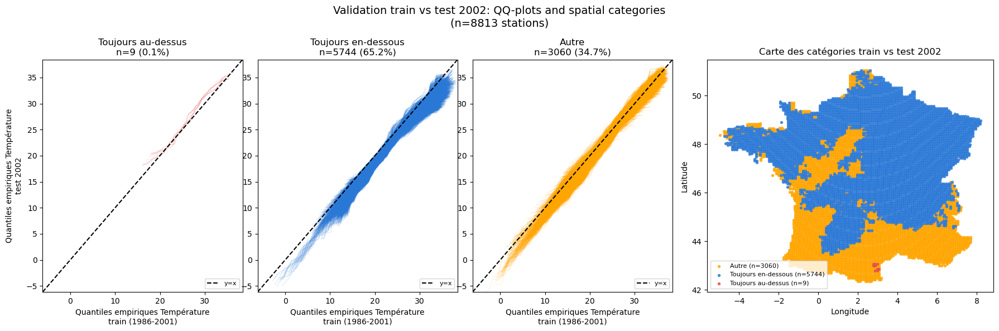


=== 2003 — 8813 stations ===
Toujours au-dessus                                      n= 6165 ( 70.0%)
Toujours en-dessous                                     n=    0 (  0.0%)
Autre                                                   n= 2648 ( 30.0%)


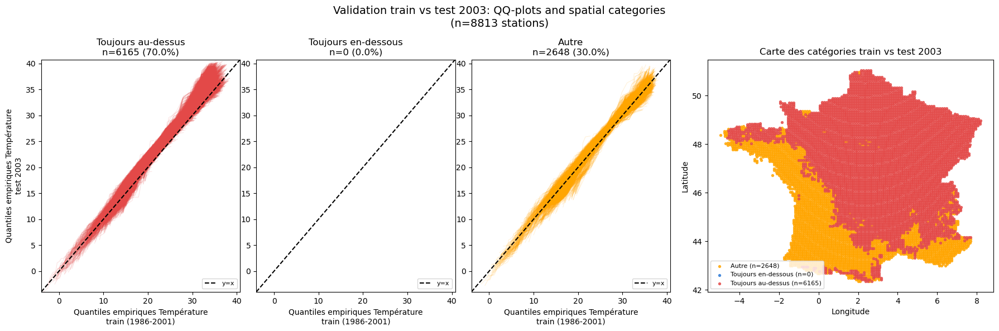


=== 2004 — 8813 stations ===
Toujours au-dessus                                      n= 4419 ( 50.1%)
Toujours en-dessous                                     n=  208 (  2.4%)
Autre                                                   n= 4186 ( 47.5%)


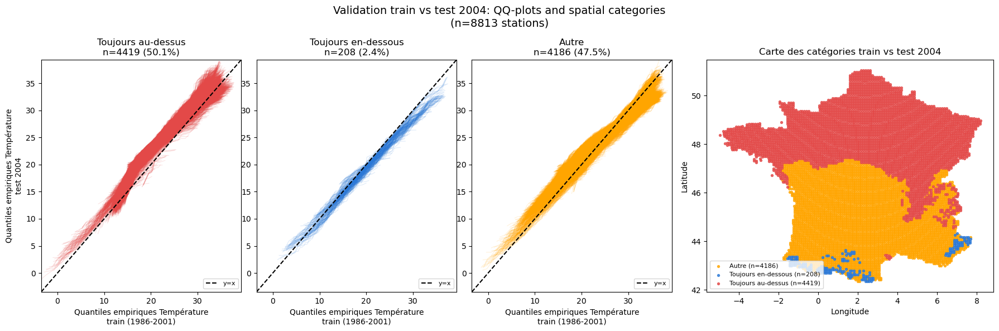


=== 2005 — 8813 stations ===
Toujours au-dessus                                      n=   99 (  1.1%)
Toujours en-dessous                                     n=  572 (  6.5%)
Autre                                                   n= 8142 ( 92.4%)


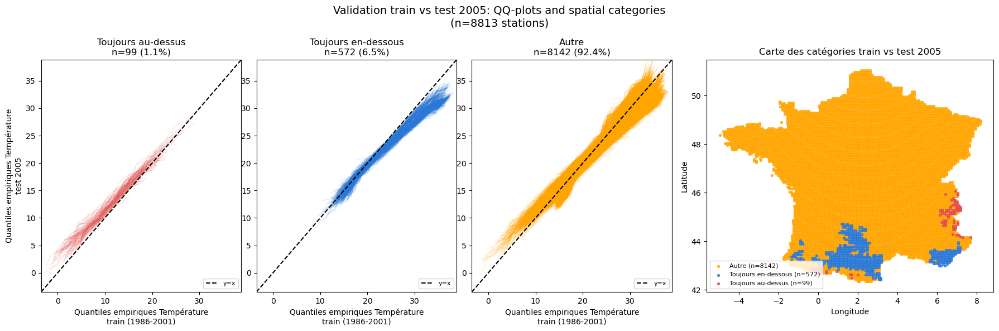

In [62]:
years = [2002, 2003, 2004, 2005]

cat_order = ['above', 'below', 'mixed']
cat_colors = {'above': '#e34948' , 'below':  '#2a78d6', 'mixed': 'orange'}

station_info = all_data.drop_duplicates(ID_COL)[[ID_COL, LAT_COL, LON_COL]].set_index(ID_COL)

for year in years:
    df_qq = classify_stations(
        qq_residue(data_train, data_test, year)
    )
    df_cat = df_qq.drop_duplicates('id')[['id', 'category']]
    n_stations = df_qq['id'].nunique()

    counts = df_qq.groupby('category')['id'].nunique()
    print(f"\n=== {year} — {n_stations} stations ===")
    for cat in cat_order:
        n_cat = int(counts.get(cat, 0))
        print(f"{cat_title_dict[cat]:<55} n={n_cat:5d} ({n_cat/n_stations*100:5.1f}%)")

    fig = plt.figure(figsize=(18, 6))
    gs = fig.add_gridspec(1, 2, width_ratios=[2.2, 1])
    gs_left = gs[0].subgridspec(1, 3)

    axes = [fig.add_subplot(gs_left[i]) for i in range(3)]

    lims = [min(df_qq['train_q'].min(), df_qq['test_q'].min()),
            max(df_qq['train_q'].max(), df_qq['test_q'].max())]

    for ax, cat in zip(axes, cat_order):
        sub = df_qq[df_qq['category'] == cat]
        n_cat = sub['id'].nunique()

        for _, grp in sub.groupby('id'):
            ax.plot(grp['train_q'], grp['test_q'],
                    color=cat_colors[cat],
                    alpha=0.15,
                    linewidth=0.8)

        ax.plot(lims, lims, 'k--', lw=1.5, label='y=x')
        ax.set(xlim=lims,
               ylim=lims,
               xlabel='Quantiles empiriques Température\ntrain (1986-2001)',
               title=f"{cat_title_dict[cat]}\nn={n_cat} ({n_cat/n_stations*100:.1f}%)")
        ax.legend(fontsize=8, loc='lower right')

    axes[0].set_ylabel(f'Quantiles empiriques Température\ntest {year}')

    ax_map = fig.add_subplot(gs[1])

    for cat in ['mixed', 'below', 'above']:
        ids_cat = df_cat.loc[df_cat['category'] == cat, 'id']

        ax_map.scatter(station_info.loc[ids_cat, LON_COL],
                       station_info.loc[ids_cat, LAT_COL],
                       s=8,
                       alpha=0.8,
                       color=cat_colors[cat],
                       label=f'{cat_title_dict[cat]} (n={len(ids_cat)})')

    ax_map.set(xlabel='Longitude',
               ylabel='Latitude',
               title=f'Carte des catégories train vs test {year}')
    ax_map.legend(fontsize=8, loc='lower left')

    fig.suptitle(f'Validation train vs test {year}: QQ-plots and spatial categories\n'
                 f'(n={n_stations} stations)',
                 fontsize=14)

    plt.tight_layout()
    plt.show()

# Chapitre 8 : Pipeline pour une autre variable: les précipitations

## import datas

In [63]:
filename = "prtotAdjust_France_CNRM-CERFACS-CNRM-CM5_CNRM-ALADIN63_Historical_METEO-FRANCE_ADAMONT-France_SAFRAN_day_19860101-19901231.txt"

my_data_p = pd.read_csv(
    filename,
    sep=";",
    comment="#",
    header=None,
    names=["Date", "Latitude", "Longitude", "Precipitation"],
    parse_dates=["Date"],
    date_format="%Y%m%d",
)

loc_ids = my_data_p[["Latitude", "Longitude"]].drop_duplicates().reset_index(drop=True)
loc_ids["id"] = range(1, len(loc_ids) + 1)
my_data_p = my_data_p.merge(loc_ids, on=["Latitude", "Longitude"], how="left")
my_data_p.head()

,Date,Latitude,Longitude,Precipitation,id
0,1986-09-01,42.3488,1.99835,1.685,1
1,1986-09-02,42.3488,1.99835,0.000,1
2,1986-09-03,42.3488,1.99835,0.000,1
3,1986-09-04,42.3488,1.99835,0.000,1
4,1986-09-05,42.3488,1.99835,0.000,1


In [64]:
filename = "prtotAdjust_France_CNRM-CERFACS-CNRM-CM5_CNRM-ALADIN63_Historical_METEO-FRANCE_ADAMONT-France_SAFRAN_day_19910101-19951231.txt"

my_data_p_1 = pd.read_csv(
    filename,
    sep=";",
    comment="#",
    header=None,
    names=["Date", "Latitude", "Longitude", "Precipitation"],
    parse_dates=["Date"],
    date_format="%Y%m%d",
)

loc_ids = my_data_p_1[["Latitude", "Longitude"]].drop_duplicates().reset_index(drop=True)
loc_ids["id"] = range(1, len(loc_ids) + 1)
my_data_p_1 = my_data_p_1.merge(loc_ids, on=["Latitude", "Longitude"], how="left")
my_data_p_1.head()

,Date,Latitude,Longitude,Precipitation,id
0,1991-09-01,42.3488,1.99835,0.084,1
1,1991-09-02,42.3488,1.99835,39.778,1
2,1991-09-03,42.3488,1.99835,21.216,1
3,1991-09-04,42.3488,1.99835,2.796,1
4,1991-09-05,42.3488,1.99835,58.645,1


In [65]:
filename = "prtotAdjust_France_CNRM-CERFACS-CNRM-CM5_CNRM-ALADIN63_Historical_METEO-FRANCE_ADAMONT-France_SAFRAN_day_19960101-20001231.txt"

my_data_p_2 = pd.read_csv(
    filename,
    sep=";",
    comment="#",
    header=None,
    names=["Date", "Latitude", "Longitude", "Precipitation"],
    parse_dates=["Date"],
    date_format="%Y%m%d",
)

loc_ids = my_data_p_2[["Latitude", "Longitude"]].drop_duplicates().reset_index(drop=True)
loc_ids["id"] = range(1, len(loc_ids) + 1)
my_data_p_2 = my_data_p_2.merge(loc_ids, on=["Latitude", "Longitude"], how="left")
my_data_p_2.head()

,Date,Latitude,Longitude,Precipitation,id
0,1996-09-01,42.3488,1.99835,0.000,1
1,1996-09-02,42.3488,1.99835,0.000,1
2,1996-09-03,42.3488,1.99835,0.446,1
3,1996-09-04,42.3488,1.99835,0.000,1
4,1996-09-05,42.3488,1.99835,3.453,1


In [66]:
filename = "prtotAdjust_France_CNRM-CERFACS-CNRM-CM5_CNRM-ALADIN63_Historical_METEO-FRANCE_ADAMONT-France_SAFRAN_day_20010101-20051231.txt"

my_data_p_3 = pd.read_csv(
    filename,
    sep=";",
    comment="#",
    header=None,
    names=["Date", "Latitude", "Longitude", "Precipitation"],
    parse_dates=["Date"],
    date_format="%Y%m%d",
)

loc_ids = my_data_p_3[["Latitude", "Longitude"]].drop_duplicates().reset_index(drop=True)
loc_ids["id"] = range(1, len(loc_ids) + 1)
my_data_p_3 = my_data_p_3.merge(loc_ids, on=["Latitude", "Longitude"], how="left")
my_data_p_3.head()

,Date,Latitude,Longitude,Precipitation,id
0,2001-09-01,42.3488,1.99835,0.000,1
1,2001-09-02,42.3488,1.99835,1.574,1
2,2001-09-03,42.3488,1.99835,8.040,1
3,2001-09-04,42.3488,1.99835,1.609,1
4,2001-09-05,42.3488,1.99835,0.160,1


In [67]:
# Mapping (Latitude, Longitude) -> id (même grille spatiale)
id_map = my_data_p_1[["Latitude", "Longitude", "id"]].drop_duplicates(
    subset=["Latitude", "Longitude"]
)

# Attribuer l'id via les coordonnées (en supprimant l'éventuelle colonne id existante)
my_data_p_1_copy = my_data_p_1.drop(columns="id", errors="ignore").merge(
    id_map, on=["Latitude", "Longitude"], how="left"
)
my_data_p_2_copy = my_data_p_2.drop(columns="id", errors="ignore").merge(
    id_map, on=["Latitude", "Longitude"], how="left"
)
my_data_p_3_copy = my_data_p_3.drop(columns="id", errors="ignore").merge(
    id_map, on=["Latitude", "Longitude"], how="left"
)

all_data_p = pd.concat(
    [my_data_p, my_data_p_1_copy, my_data_p_2_copy, my_data_p_3_copy],
    ignore_index=True
)[["id", "Date", "Latitude", "Longitude", "Precipitation"]]

all_data_p = all_data_p[all_data_p["Date"].dt.month != 9]

all_data_p = all_data_p.sort_values(["id", "Date"]).reset_index(drop=True)
all_data_p.head()


,id,Date,Latitude,Longitude,Precipitation
0,1,1986-10-01,42.3488,1.99835,5.068
1,1,1986-10-02,42.3488,1.99835,3.381
2,1,1986-10-03,42.3488,1.99835,11.890
3,1,1986-10-04,42.3488,1.99835,12.417
4,1,1986-10-05,42.3488,1.99835,11.845


## l'ensemble d'excursion en 2D

In [68]:
# seuil de quantile par station (pour la variable Précipitation)
all_u_s_95_p = seuil_par_site(all_data_p, 0.95, var_col='Precipitation')
all_u_s_90_p = seuil_par_site(all_data_p, 0.90, var_col='Precipitation')
all_u_s_99_p = seuil_par_site(all_data_p, 0.99, var_col='Precipitation')

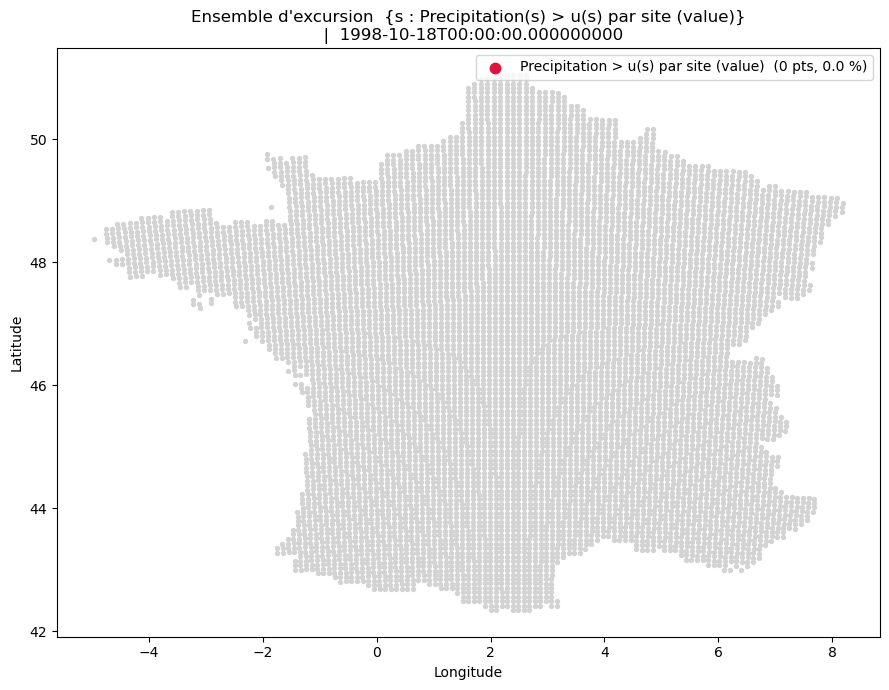

,id,Date,Latitude,Longitude,Precipitation,value


In [69]:
# plot de l'ensemble d'excursion pour une date donnée
date = np.random.choice(all_data_p['Date'].unique())
plot_excursion_set_2d(all_data_p, all_u_s_95_p, date, 'Precipitation')

### Composant connexe

2005-11-16T00:00:00.000000000 — 0 points dans l'ensemble d'excursion (seuil 95%)


/var/folders/vw/x71ysw2x0pz7h6d64np8b0_80000gn/T/ipykernel_38567/2614196479.py:60: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(markerscale=2, fontsize=8, loc='upper right')
/var/folders/vw/x71ysw2x0pz7h6d64np8b0_80000gn/T/ipykernel_38567/2614196479.py:60: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(markerscale=2, fontsize=8, loc='upper right')


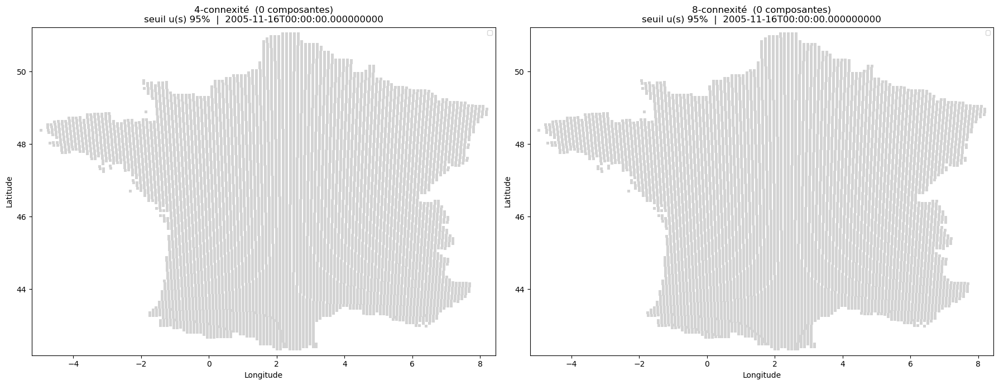

In [70]:
date = np.random.choice(all_data_p['Date'].unique())
day_data = all_data_p[all_data_p['Date'] == pd.Timestamp(date)].copy()


E = excursion_set(day_data, all_u_s_95_p, 'Precipitation')
print(f"{date} — {len(E)} points dans l'ensemble d'excursion (seuil 95%)")


E_labeled = plot_components_2d(
    E,
    min_size=1,
    title_extra=f'seuil u(s) 95%  |  {date}'
)

### Périmètre

In [71]:
date = np.random.choice(all_data_p['Date'].unique())

# 1. Données de ce jour-là
day_data = all_data_p[all_data_p['Date'] == pd.Timestamp(date)].copy()

# 2. Ensemble d'excursion de ce jour
E = excursion_set(day_data, all_u_s_95_p, 'Precipitation')

result_perim = compute_perimeter_2d(E)
print(f"Périmètre total : {result_perim['perimeter_km']} km pour date {str(date)[:10]}")


Périmètre total : 0.0 km pour date 2004-11-21


### Aire

In [72]:
date = np.random.choice(all_data_p['Date'].unique())

# 1. Données de ce jour-là
day_data = all_data_p[all_data_p['Date'] == pd.Timestamp(date)].copy()

# 2. Ensemble d'excursion de ce jour
E = excursion_set(day_data, all_u_s_95_p, 'Precipitation')

result_area = compute_area_2d(E)
print(f"Aire totale : {result_area['area_km2']} km²  ({result_area['n_cells']} cellules) pour date {str(date)[:10]}")

Aire totale : 5758.3 km²  (73 cellules) pour date 1989-11-28


### le plus grand rayon

In [74]:
date = np.random.choice(all_data_p['Date'].unique())
day_data = all_data_p[all_data_p['Date'] == pd.Timestamp(date)].copy()
E = excursion_set(day_data, all_u_s_95_p, 'Precipitation')

# radius for all points in E
E_rad, n4, n8, per_comp = max_inscribed_radius_all(E, day_data)
E_rad[['id', 'Latitude', 'Longitude', 'max_radius_km']].head()
print(f"Rayon maximal inscrit pour chaque point de l'ensemble d'excursion (seuil 95%) pour date {str(date)[:10]} :")
per_comp

Rayon maximal inscrit pour chaque point de l'ensemble d'excursion (seuil 95%) pour date 1989-11-28 :


{1: {'center_id': 7897, 'radius_km': 15.984932949091753, 'n_pts': 15},
 2: {'center_id': 8384, 'radius_km': 7.997616029841101, 'n_pts': 2},
 3: {'center_id': 8385, 'radius_km': 7.9653084015960625, 'n_pts': 1},
 4: {'center_id': 8781, 'radius_km': 53.40262825177912, 'n_pts': 61},
 5: {'center_id': 8811, 'radius_km': 39.838087855061126, 'n_pts': 17}}

/var/folders/vw/x71ysw2x0pz7h6d64np8b0_80000gn/T/ipykernel_38567/1689188506.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette  = plt.cm.get_cmap("tab10", len(comp_ids))
/var/folders/vw/x71ysw2x0pz7h6d64np8b0_80000gn/T/ipykernel_38567/1689188506.py:42: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  (float(cx_k), float(cy_k)), radius=r_k,


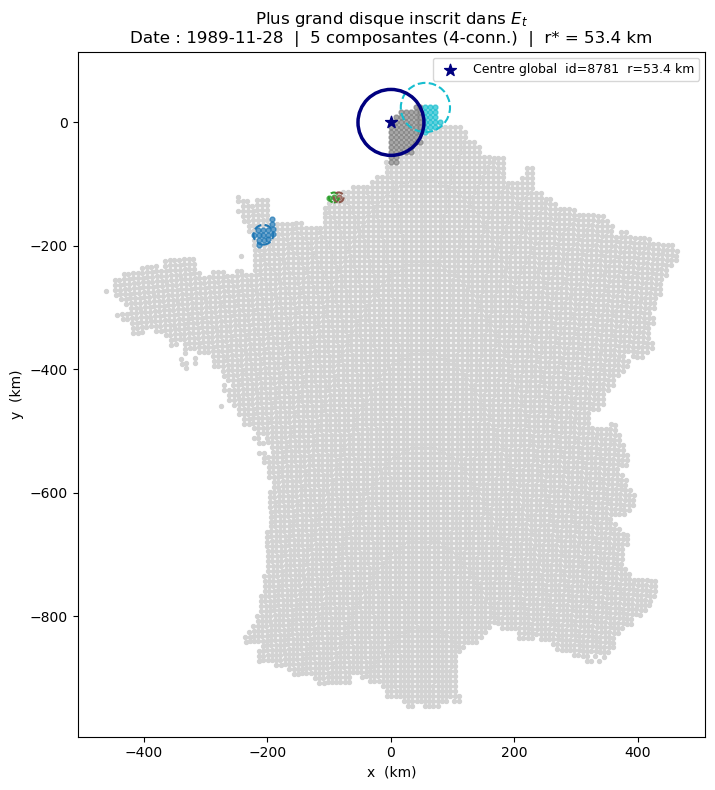

In [75]:
plot_largest_inscribed_disk(E_rad, n4, per_comp, date=date)

## Transformation de précipitation $Y^*$

In [76]:
all_data_p_star = compute_Xstar(all_data_p,var_col='Precipitation', trans_col='Y_star')
print(f"Y*(s) calculé — min={all_data_p_star['Y_star'].min():.2f}, "
      f"max={all_data_p_star['Y_star'].max():.1f}, "
      f"médiane={all_data_p_star['Y_star'].median():.2f}")
all_data_p_star.head()

Y*(s) calculé — min=1.15, max=1221.0, médiane=1.92


,id,Date,Latitude,Longitude,Precipitation,Y_star
0,1,1986-10-01,42.3488,1.99835,5.068,9.250000
1,1,1986-10-02,42.3488,1.99835,3.381,7.224852
2,1,1986-10-03,42.3488,1.99835,11.890,20.350000
3,1,1986-10-04,42.3488,1.99835,12.417,21.421053
4,1,1986-10-05,42.3488,1.99835,11.845,19.693548


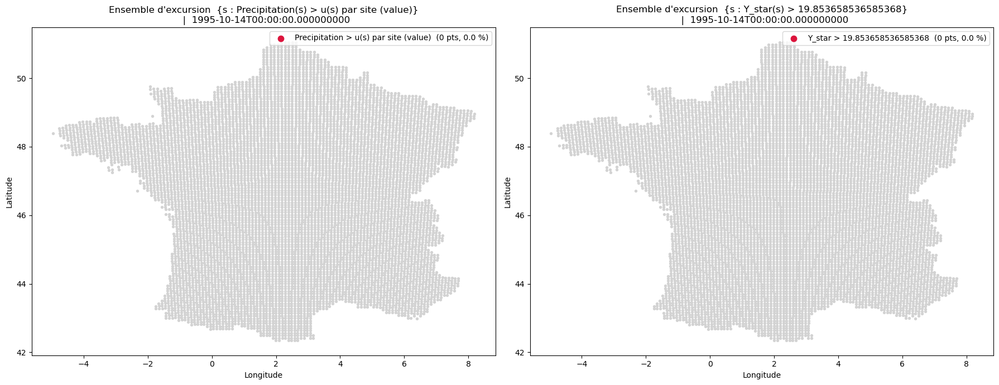

In [77]:
date = np.random.choice(all_data_p_star['Date'].unique())
u = all_u_s_95_p
x = np.quantile(all_data_p_star['Y_star'], 0.95)
plot_excursion_X_Xstar(all_data_p_star, date, u, x, var_col='Precipitation', trans_col='Y_star')

## Séries temporelles

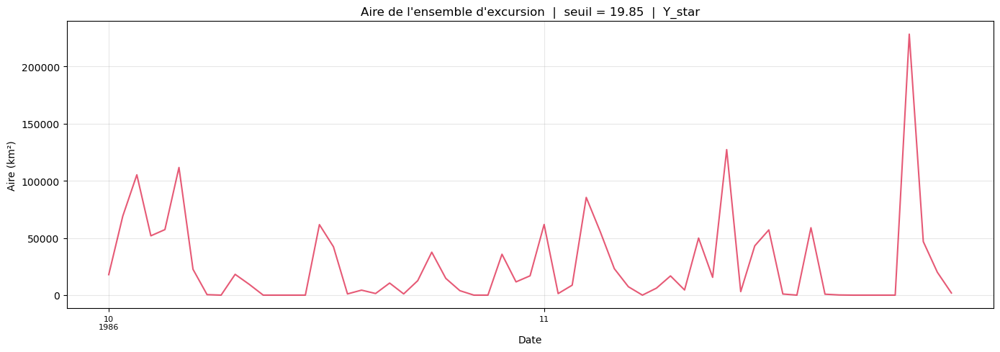

In [78]:
x_p = np.quantile(all_data_p_star['Y_star'], 0.95)
df_aire = plot_qualite_temporelle('aire', all_data_p_star, x_p, 'Y_star',date_min='1986-10-01', date_max='1986-11-30')

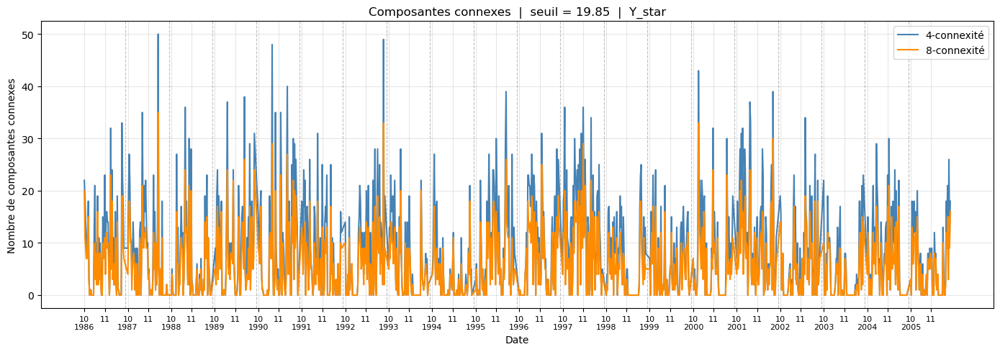

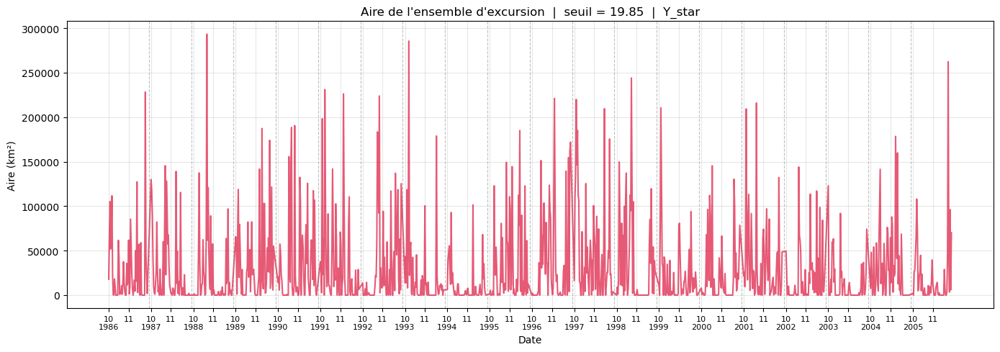

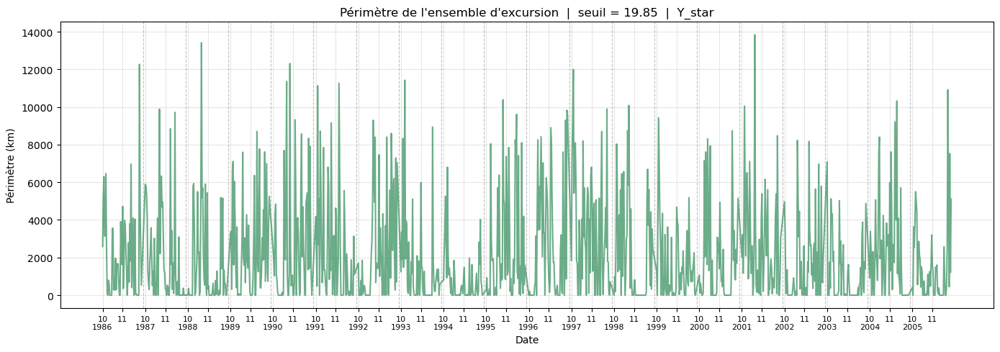

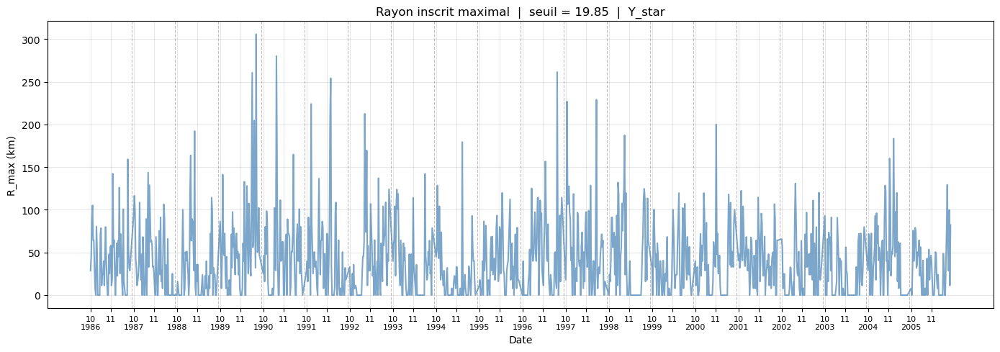

In [79]:
# ── Qualité temporelle des composantes connexes, aire, périmètre et R_max ─────

x_p = np.quantile(all_data_p_star['Y_star'], 0.95)
# Composantes connexes
df_cc = plot_qualite_temporelle('composants_connexes', all_data_p_star, x_p, 'Y_star')

# Aire 
df_aire = plot_qualite_temporelle('aire', all_data_p_star, x_p, 'Y_star')

# Périmètre 
df_perim = plot_qualite_temporelle('perimetre', all_data_p_star, x_p, 'Y_star')

# R_max 
df_rmax = plot_qualite_temporelle('R_max', all_data_p_star, x_p, 'Y_star')

In [80]:
x_p = np.quantile(all_data_p_star['Y_star'], 0.95)

# ── Collecter les 4 séries ─────────────────────────────────────────────────
df_p_aire_ts_95  = compute_qualite_temporelle('aire',                all_data_p_star,
                                          seuil=x_p, var_col='Y_star')
df_p_perim_ts_95 = compute_qualite_temporelle('perimetre',           all_data_p_star,
                                          seuil=x_p, var_col='Y_star')
df_p_cc_ts_95    = compute_qualite_temporelle('composants_connexes', all_data_p_star,
                                          seuil=x_p, var_col='Y_star')
df_p_rmax_ts_95  = compute_qualite_temporelle('R_max',               all_data_p_star,
                                          seuil=x_p, var_col='Y_star')

df_p_cc_ts_95 = df_p_cc_ts_95[['Date', 'n4']].rename(columns={'n4': 'n_composantes'})


In [81]:
# appliquer la fonction de test de stationnarité sur chaque série temporelle
series_p_dict_95 = {
    'Aire'                 : df_p_aire_ts_95[['Date', 'area_km2']].copy(),
    'Périmètre'            : df_p_perim_ts_95[['Date', 'perimeter_km']].copy(),
    'Composantes connexes' : df_p_cc_ts_95[['Date', 'n_composantes']].copy(),
    'R_max'                : df_p_rmax_ts_95[['Date', 'R_max_km']].copy(),
}

rows = [test_stationarite_blocs(name, df) for name, df in series_p_dict_95.items()]
df_results = pd.DataFrame(rows).set_index('Série')
df_results

,ADF stat,ADF p-value,ADF H0 rejetée,KPSS stat,KPSS p-value,KPSS H0 rejetée,Conclusion
Série,,,,,,,
Aire,-13.490,0.0,True,0.217,0.1,False,Stationnaire
Périmètre,-12.594,0.0,True,0.166,0.1,False,Stationnaire
Composantes connexes,-10.462,0.0,True,0.161,0.1,False,Stationnaire
R_max,-12.644,0.0,True,0.218,0.1,False,Stationnaire


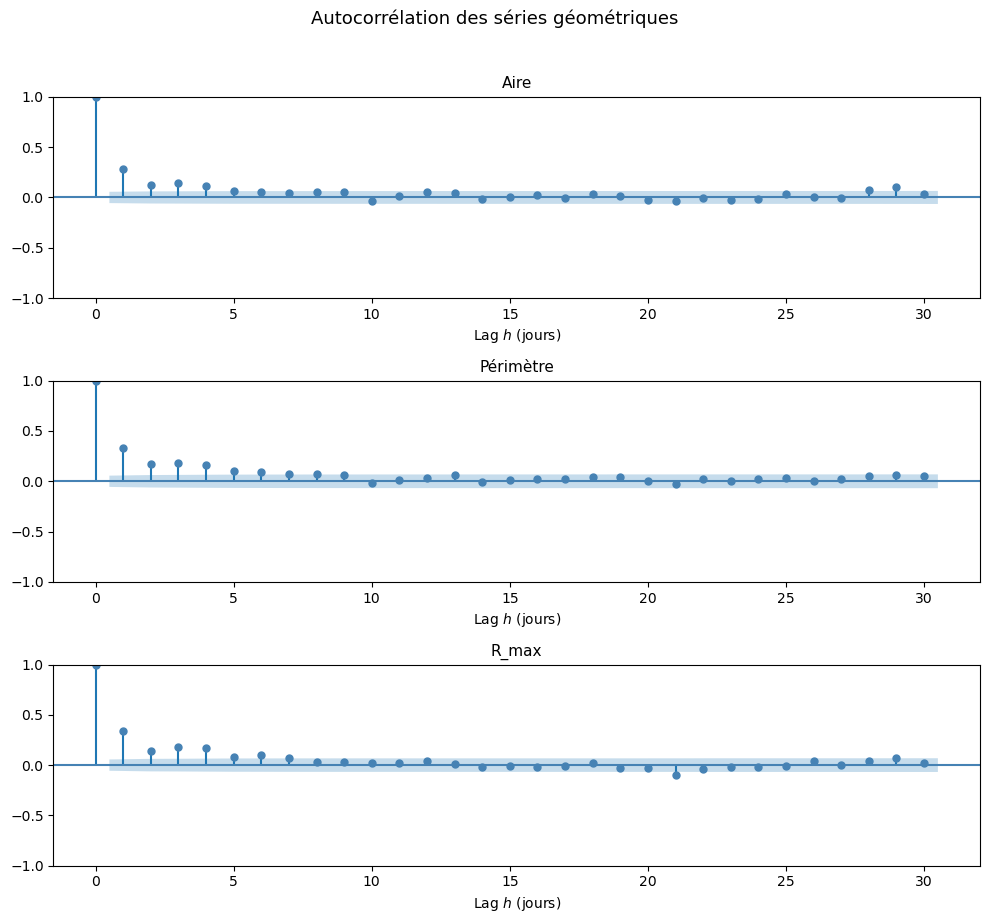

In [82]:
# acf plots
from statsmodels.graphics.tsaplots import plot_acf

series_p_dict_ar = series_p_dict_95.copy()
del series_p_dict_ar['Composantes connexes']    

fig, axes = plt.subplots(len(series_p_dict_ar), 1,
                          figsize=(10, 3 * len(series_p_dict_ar)))

for ax, (name, df) in zip(axes, series_p_dict_ar.items()):
    col   = get_val_col(df)
    df_   = df[['Date', col]].copy()
    #df_[col] = df_[col].replace([np.inf, -np.inf], np.nan)
    #s_clean = df_[col].dropna().reset_index(drop=True)
    # lag h : h jour après, on regarde la corrélation entre s(t) et s(t+h)
    n_lags  = min(30, len(df_[col]) // 4) # min 30 jour(1 mois), len(s_clean)//4 éviter d'avoir trop de lags si la série est courte

    plot_acf(df_[col], ax=ax, lags=n_lags, alpha=0.05, color='steelblue')
    ax.set_title(f'{name}', fontsize=11)
    ax.set_xlabel('Lag $h$ (jours)')

plt.suptitle("Autocorrélation des séries géométriques",
             fontsize=13, y=1.02)
plt.tight_layout()
plt.show()

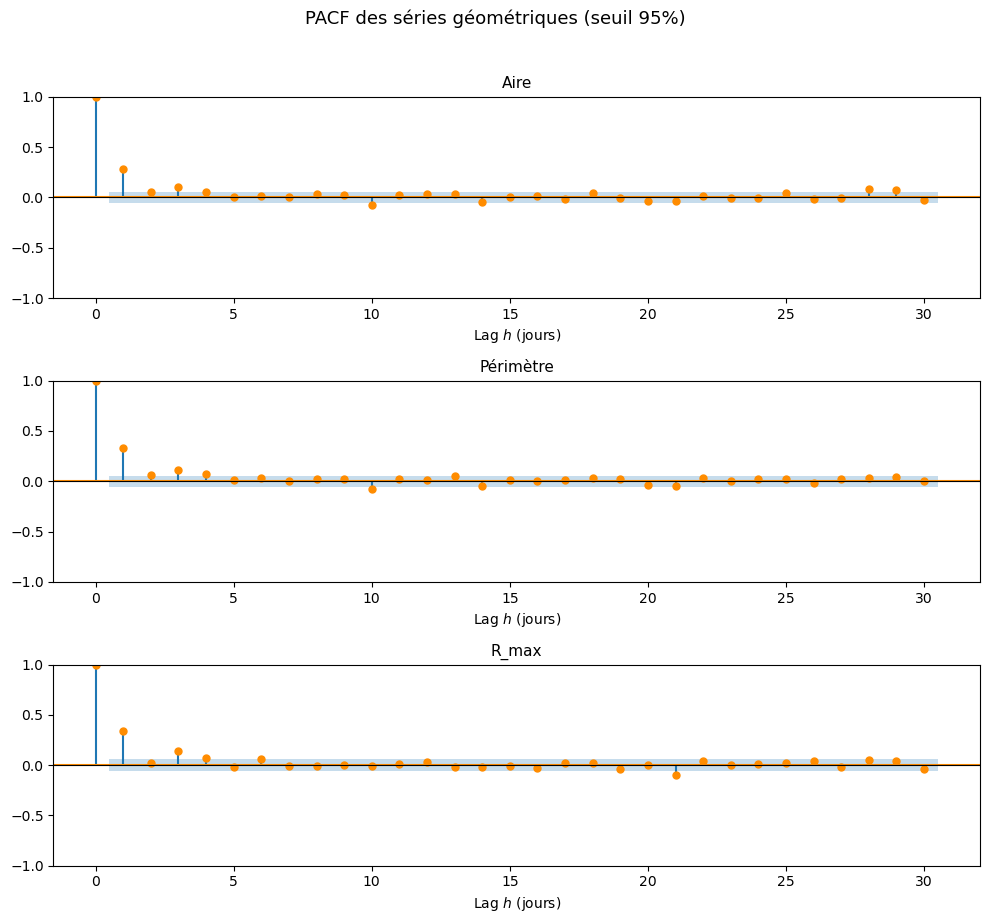

In [83]:
# pacf
fig, axes = plt.subplots(len(series_p_dict_ar), 1,
                          figsize=(10, 3 * len(series_p_dict_ar)))

for ax, (name, df) in zip(axes, series_p_dict_ar.items()):
    col   = get_val_col(df)
    df_   = df[['Date', col]].copy()
    #df_[col] = df_[col].replace([np.inf, -np.inf], np.nan)
    #s_clean = df_[col].dropna().reset_index(drop=True)
    n_lags  = min(30, len(df_[col]) // 4)

    plot_pacf(df_[col], ax=ax, lags=n_lags, alpha=0.05,
              method='ywm', color='darkorange')          # method='ywm' : Yule-Walker method with MLE adjustment
                                                                         #yule-walker et maximum de vraisemblance
    ax.set_title(f'{name}', fontsize=11)
    ax.set_xlabel('Lag $h$ (jours)')
    ax.axhline(0, color='k', lw=0.8)

plt.suptitle("PACF des séries géométriques (seuil 95%)",
             fontsize=13, y=1.02)
plt.tight_layout()
plt.show()

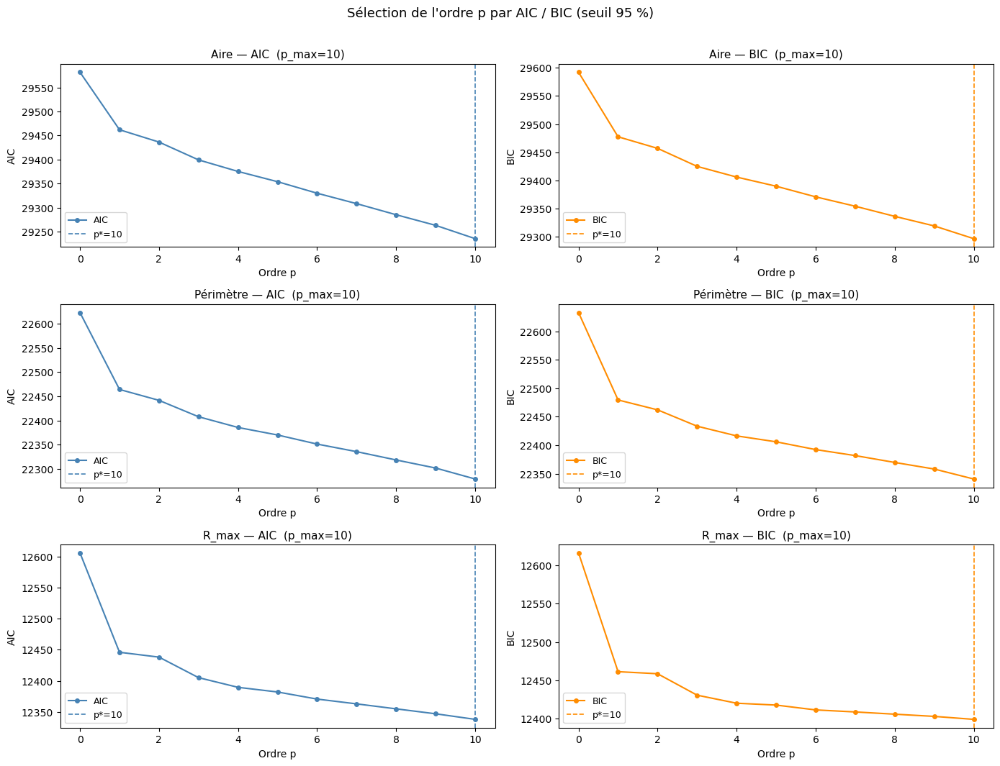

,p_max,p (AIC),AIC min,p (BIC),BIC min
Série,,,,,
Aire,10,10,29235.15,10,29296.33
Périmètre,10,10,22279.44,10,22340.62
R_max,10,10,12337.83,10,12399.01


In [84]:
# AIC & BIC

results_aic_bic = []

fig, axes = plt.subplots(len(series_p_dict_ar), 2,
                          figsize=(14, 3.5 * len(series_p_dict_ar)),
                          sharex=False)

for row_idx, (name, df) in enumerate(series_p_dict_ar.items()):
    col   = get_val_col(df)
    df_   = df[['Date', col]].copy()
    #df_[col] = df_[col].replace([np.inf, -np.inf], np.nan)
    #s_clean = df_[col].dropna().reset_index(drop=True)

    p_max = 10    

    p_vals, aic_vals, bic_vals = [], [], []

    for p in range(0, p_max + 1):
        try:  
            with warnings.catch_warnings():  # ignorer les warnings liés à des modèles mal ajustés pour certains p
                warnings.simplefilter('ignore')
                res = AutoReg(df_[col], lags=p, old_names=False).fit()
            p_vals.append(p)
            aic_vals.append(res.aic)
            bic_vals.append(res.bic)
        except Exception:
            pass

    p_opt_aic = p_vals[np.argmin(aic_vals)]
    p_opt_bic = p_vals[np.argmin(bic_vals)]

    results_aic_bic.append({
        'Série'    : name,
        'p_max'    : p_max,
        'p (AIC)'  : p_opt_aic,
        'AIC min'  : round(min(aic_vals), 2),
        'p (BIC)'  : p_opt_bic,
        'BIC min'  : round(min(bic_vals), 2),
    })

    # AIC curve
    ax_aic = axes[row_idx, 0]
    ax_aic.plot(p_vals, aic_vals, marker='o', ms=4, color='steelblue', label='AIC')
    ax_aic.axvline(p_opt_aic, color='steelblue', ls='--', lw=1.2,
                   label=f'p*={p_opt_aic}')
    ax_aic.set_title(f'{name} — AIC  (p_max={p_max})', fontsize=11)
    ax_aic.set_xlabel('Ordre p')
    ax_aic.set_ylabel('AIC')
    ax_aic.legend(fontsize=9)

    # BIC curve
    ax_bic = axes[row_idx, 1]
    ax_bic.plot(p_vals, bic_vals, marker='o', ms=4, color='darkorange', label='BIC')
    ax_bic.axvline(p_opt_bic, color='darkorange', ls='--', lw=1.2,
                   label=f'p*={p_opt_bic}')
    ax_bic.set_title(f'{name} — BIC  (p_max={p_max})', fontsize=11)
    ax_bic.set_xlabel('Ordre p')
    ax_bic.set_ylabel('BIC')
    ax_bic.legend(fontsize=9)

plt.suptitle("Sélection de l'ordre p par AIC / BIC (seuil 95 %)",
             fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

# Tableau récapitulatif
df_aic_bic = pd.DataFrame(results_aic_bic).set_index('Série')
df_aic_bic


         1      2      3      4      5      6      7      8      9      10  \
0.10  0.839  0.779  0.776  0.761  0.737  0.728  0.720  0.710  0.695  0.678   
0.11  0.839  0.779  0.776  0.761  0.737  0.728  0.720  0.710  0.695  0.678   
0.12  0.839  0.779  0.776  0.761  0.737  0.728  0.720  0.710  0.695  0.678   
0.13  0.839  0.779  0.776  0.761  0.737  0.728  0.720  0.710  0.695  0.678   
0.14  0.839  0.779  0.776  0.761  0.737  0.728  0.720  0.710  0.695  0.678   
...     ...    ...    ...    ...    ...    ...    ...    ...    ...    ...   
0.95  0.100  0.085  0.086  0.070  0.018  0.036  0.019  0.075  0.058  0.000   
0.96  0.124  0.084  0.107  0.087  0.022  0.045  0.023  0.047  0.048  0.000   
0.97  0.137  0.084  0.114  0.058  0.029  0.030  0.000  0.031  0.032  0.000   
0.98  0.000  0.041  0.042  0.043  0.044  0.000  0.000  0.046  0.000  0.000   
0.99  0.000  0.000  0.000  0.000  0.000  0.000  0.000  0.000  0.000  0.000   

         11     12     13     14     15  
0.10  0.681  0.695  0

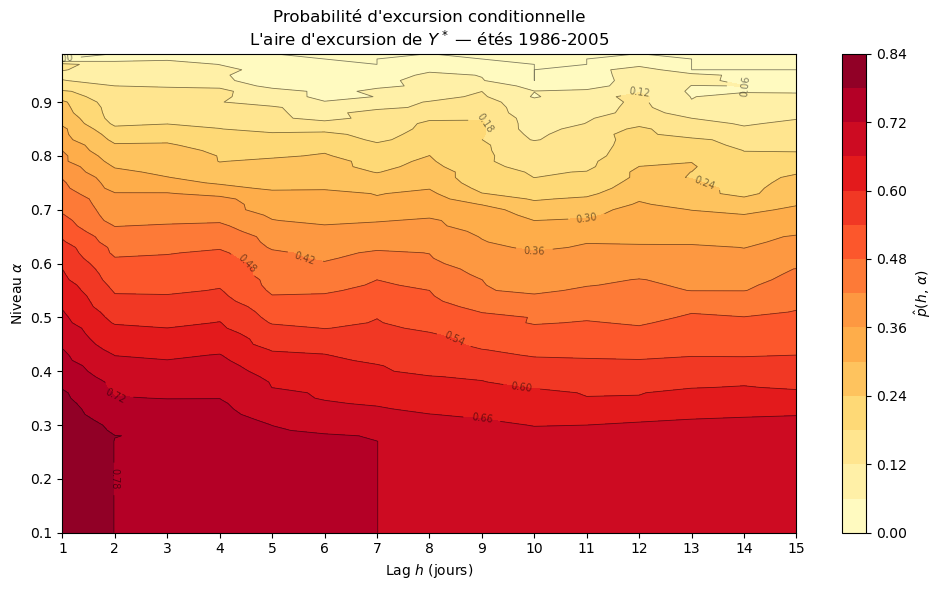

In [85]:


x_p = np.quantile(all_data_p_star['Y_star'], 0.95)

df_aire = compute_qualite_temporelle('aire', all_data_p_star, x_p, 'Y_star')

p_hat_aire = compute_conditional_exceedance(
    df_aire, val_col='area_km2', h_max=15
)

print(p_hat_aire.round(3))

plot_conditional_exceedance(p_hat_aire, title="L\'aire d\'excursion de $Y^*$ — étés 1986-2005")

## QQ plot

/var/folders/vw/x71ysw2x0pz7h6d64np8b0_80000gn/T/ipykernel_38567/227591240.py:14: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=9)


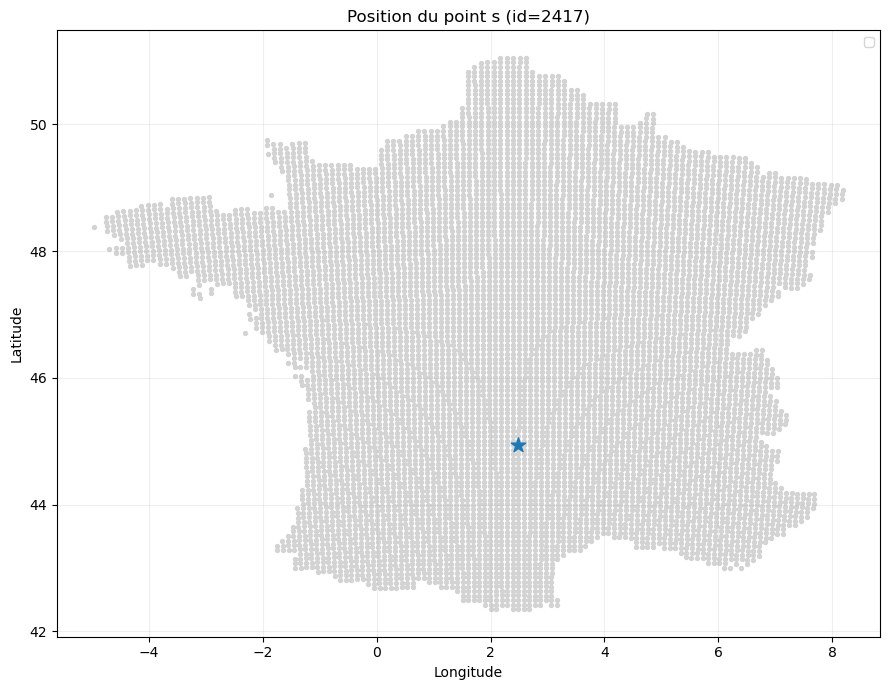

Station id=2417, année=1989 — 61 valeurs Y*


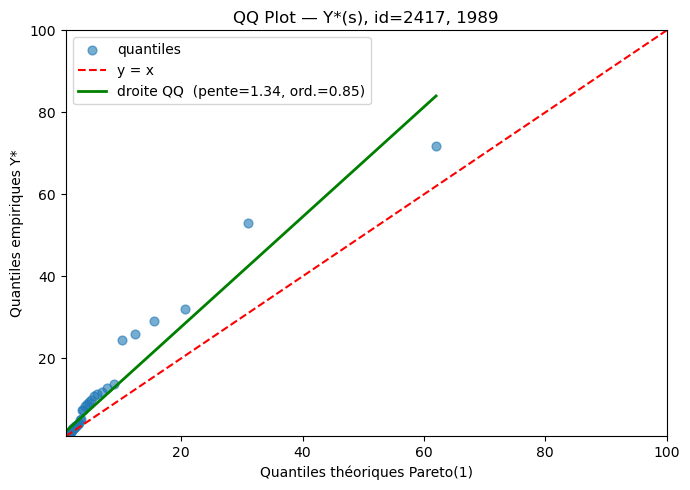

Station id=2417, année=1996 — 61 valeurs Y*


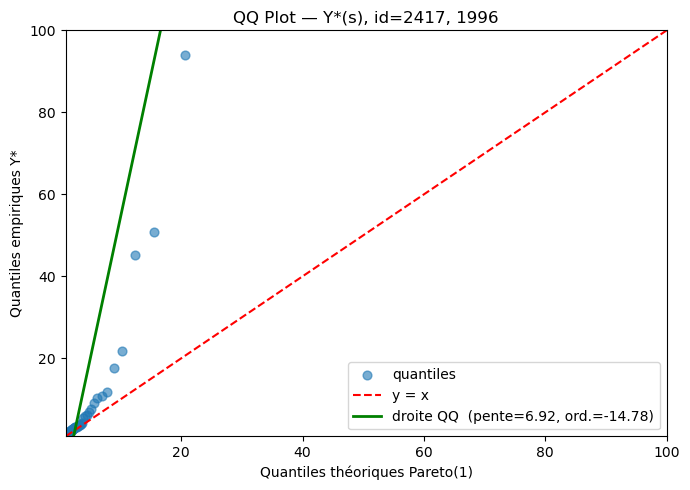

Station id=2417, année=2003 — 61 valeurs Y*


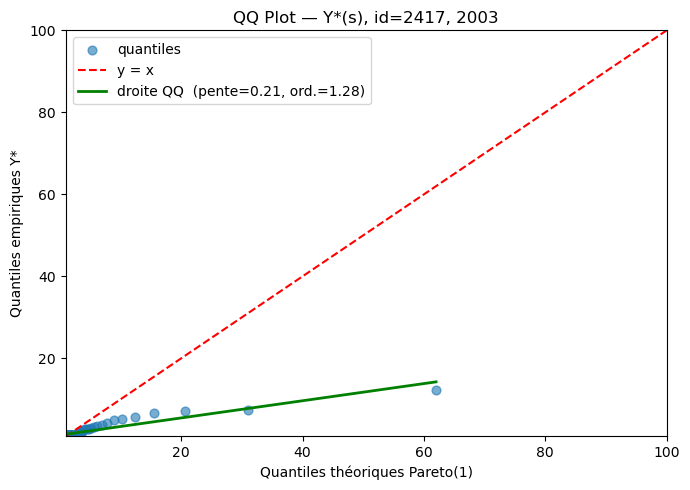

Station id=2417, année=1995 — 61 valeurs Y*


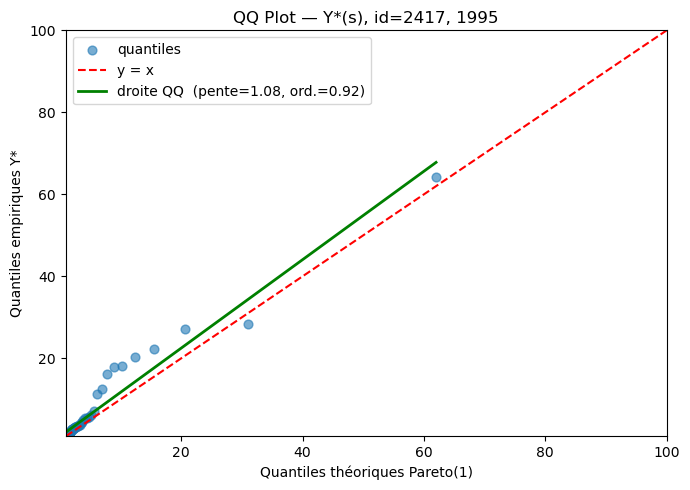

Station id=2417, année=1993 — 61 valeurs Y*


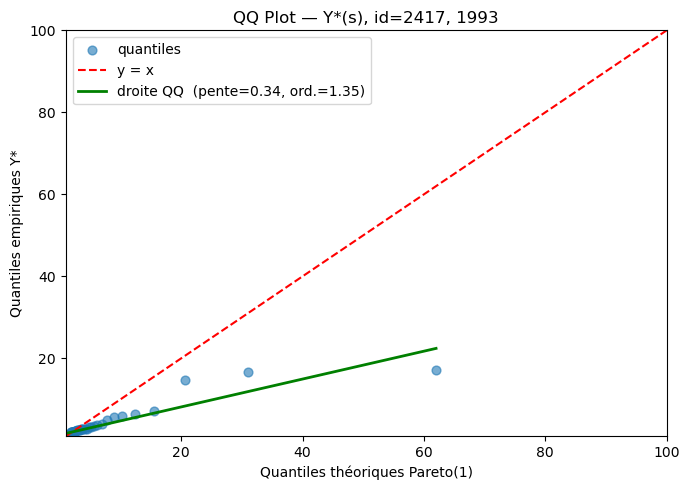

In [86]:
s_id = np.random.choice(all_data_p_star['id'].values)
s_plot(s_id)

years = np.random.choice(all_years, size=5, replace=False)
for year in years:
    Y_star_year = all_data_p_star[(all_data_p_star['id'] == s_id) &
                                   (all_data_p_star['Date'].dt.year == year)]['Y_star'].values
    print(f"Station id={s_id}, année={year} — {len(Y_star_year)} valeurs Y*")

    n = len(Y_star_year)
    probs = np.arange(1, n + 1) / (n + 1)
    theo_q = stats.pareto.ppf(probs, b=1)
    emp_q  = np.sort(Y_star_year)

    # ── Droite QQ (régression linéaire OLS) ──────────────────────────────────
    slope, intercept, *_ = stats.linregress(theo_q, emp_q)
    x_line = np.array([theo_q.min(), theo_q.max()])
    ## ── Tracé du QQ plot ─────────────────────────────────────────────────────
    fig, ax = plt.subplots(figsize=(7, 5))
    ax.scatter(theo_q, emp_q, alpha=0.6, s=40, label='quantiles')   # points du QQ plot
    q_min = stats.pareto.ppf(0.01, b=1)
    q_max = stats.pareto.ppf(0.99, b=1)
    ax.set_xlim(q_min, q_max); ax.set_ylim(q_min, q_max)
    ax.plot([q_min, q_max], [q_min, q_max], 'r--', lw=1.5, label='y = x')  # diagonale
    ax.plot(x_line, slope * x_line + intercept, 'g-', lw=2,
            label=f'droite QQ  (pente={slope:.2f}, ord.={intercept:.2f})')  # droite de régression
    ax.set_xlabel('Quantiles théoriques Pareto(1)')
    ax.set_ylabel('Quantiles empiriques Y*')
    ax.set_title(f'QQ Plot — Y*(s), id={s_id}, {year}')
    ax.legend()
    plt.tight_layout()
    plt.show()


In [87]:
import pandas as pd
year = 1995
s_id = np.random.choice(all_data['id'].values)
Y_star_year = all_data_p_star[(all_data_p_star['id'] == s_id) &
                                   (all_data_p_star['Date'].dt.year == year)]['Y_star'].values
vc = pd.Series(Y_star_year).value_counts()
print(vc.head(10))         

1.294118     20
2.373178      1
2.625806      1
10.901786     1
6.672131      1
33.000000     1
2.180357      1
3.163212      1
6.359375      1
6.059553      1
Name: count, dtype: int64


/var/folders/vw/x71ysw2x0pz7h6d64np8b0_80000gn/T/ipykernel_38567/227591240.py:14: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=9)


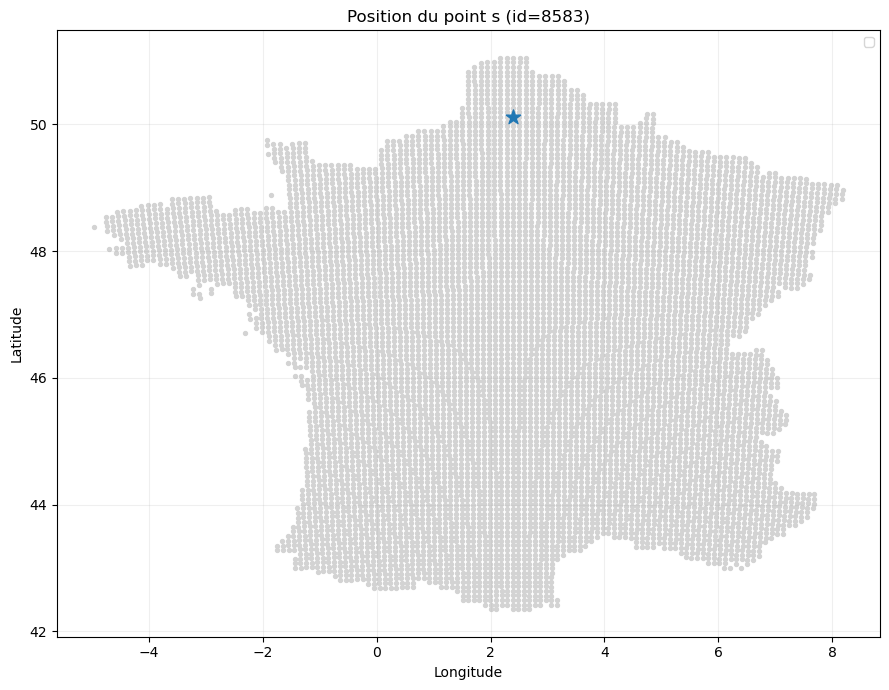

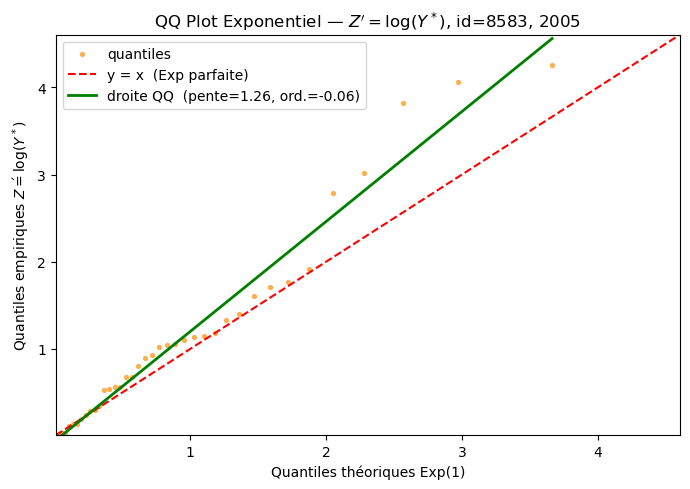

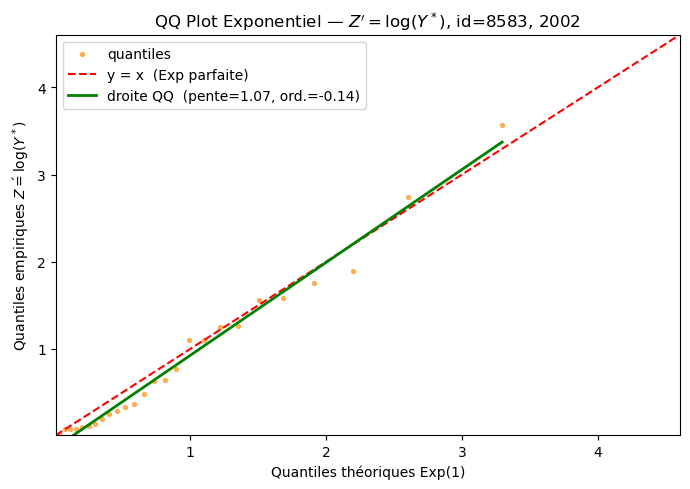

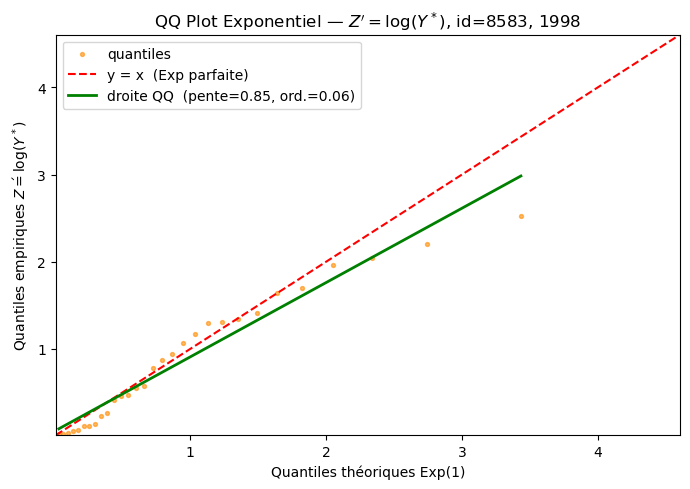

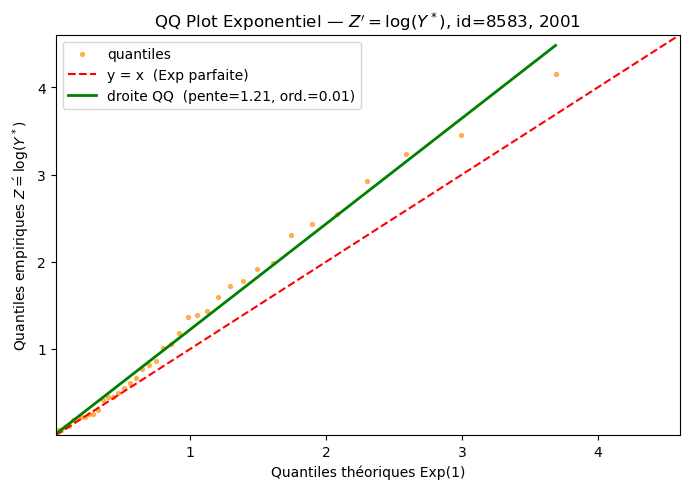

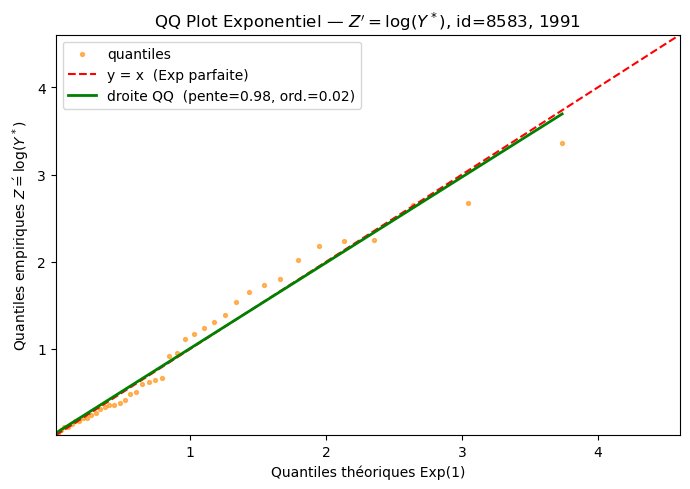

In [88]:
# QQ plot sous loi Exponentielle(1) — transformation Z = log(X*)
# Si X* ~ Pareto(1) alors Z = log(X*) ~ Exp(1)

s_id = np.random.choice(all_data['id'].values)
s_plot(s_id)

years = np.random.choice(all_years, size=5, replace=False)
for year in years:
    Y_star_year = all_data_p_star[(all_data_p_star['id'] == s_id) &
                                   (all_data_p_star['Date'].dt.year == year)]['Y_star'].values
    z0= np.quantile(all_data_p_star['Y_star'], 0.5)
    Y_star_year = Y_star_year[Y_star_year > z0]   # filtrer les valeurs Y* > z0
    Z_prime = np.log(Y_star_year)   - np.log(z0)     # Z_prime ~ Exp(1)
    n = len(Z_prime)
    probs   = np.arange(1, n + 1) / (n + 1)
    theo_q  = stats.expon.ppf(probs)
    emp_q   = np.sort(Z_prime)

    # ── Droite QQ (régression linéaire OLS) ──────────────────────────────────
    slope, intercept, *_ = stats.linregress(theo_q, emp_q)
    x_line = np.array([theo_q.min(), theo_q.max()])

    fig, ax = plt.subplots(figsize=(7, 5))
    ax.scatter(theo_q, emp_q, s=8, alpha=0.6, color='darkorange', label='quantiles')
    q_min = stats.expon.ppf(0.01)
    q_max = stats.expon.ppf(0.99)
    ax.set_xlim(q_min, q_max); ax.set_ylim(q_min, q_max)
    ax.plot([q_min, q_max], [q_min, q_max], 'r--', lw=1.5, label='y = x  (Exp parfaite)')
    ax.plot(x_line, slope * x_line + intercept, 'g-', lw=2,
            label=f'droite QQ  (pente={slope:.2f}, ord.={intercept:.2f})')
    ax.set_xlabel('Quantiles théoriques Exp(1)')
    ax.set_ylabel(r'Quantiles empiriques $Z\' = \log(Y^*)$')
    ax.set_title(f'QQ Plot Exponentiel — $Z\'=\log(Y^*)$, id={s_id}, {year}')
    ax.legend()
    plt.tight_layout()
    plt.show()

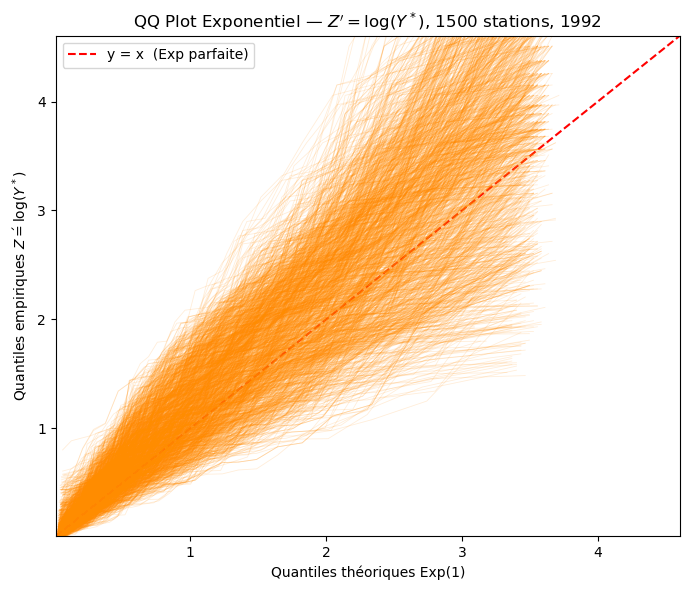

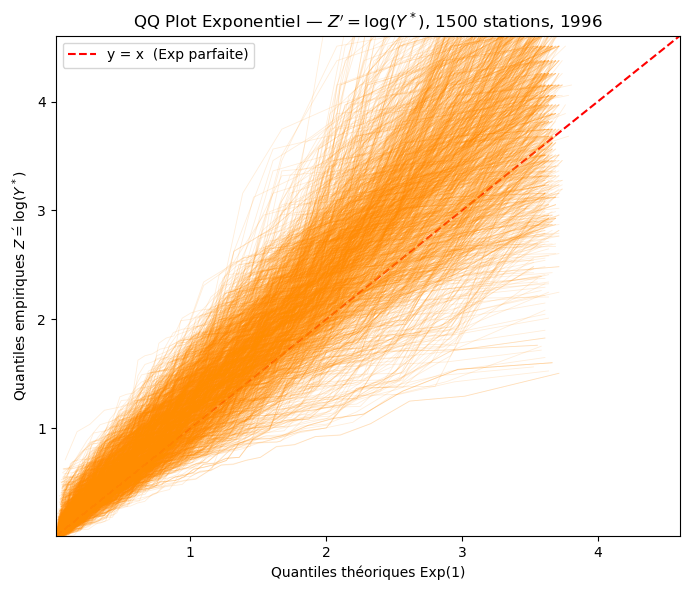

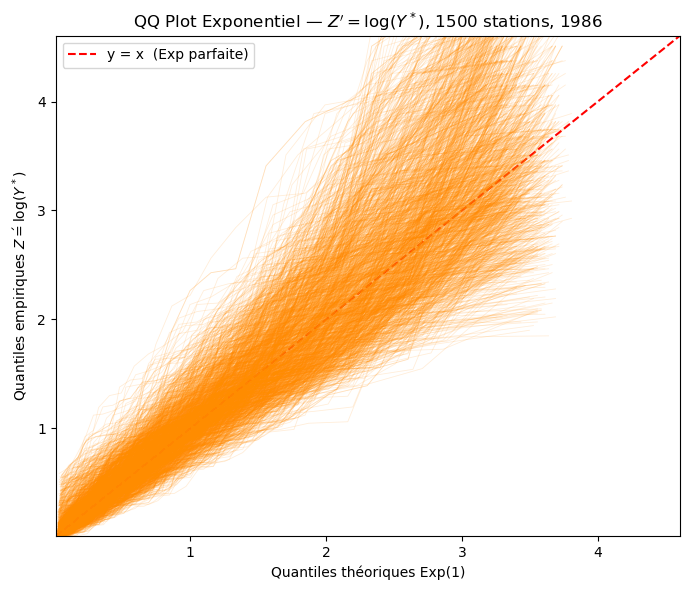

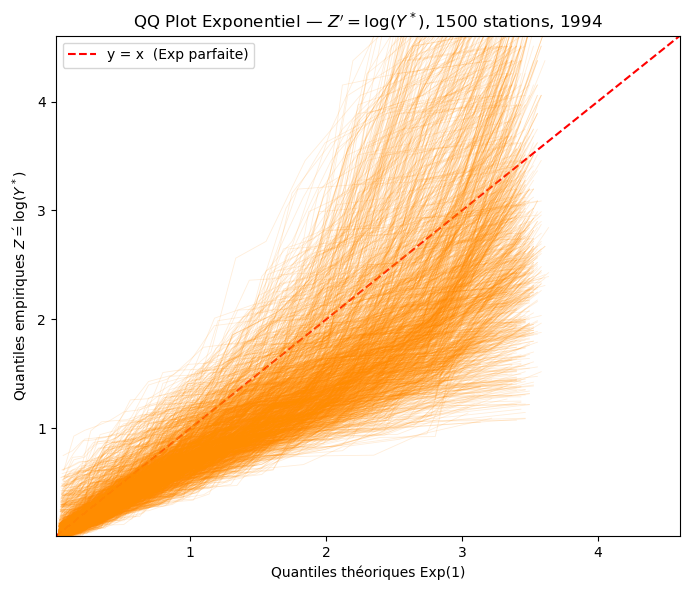

In [89]:

# 1000 stations aléatoires : une ligne QQ par station, un graphique par année (1986-2005)

n_stations = 1500
all_ids    = all_data_p['id'].unique()
sample_ids = np.random.choice(all_ids, size=min(n_stations, len(all_ids)), replace=False)

years = np.random.choice(all_years, size=4, replace=False)

q_min = stats.expon.ppf(0.01)
q_max = stats.expon.ppf(0.99)

for year in years:
    z0= np.quantile(all_data_p_star['Y_star'], 0.5)
    data_year = all_data_p_star[all_data_p_star['id'].isin(sample_ids) &
                                   (all_data_p_star['Date'].dt.year == year)]
    

    fig, ax = plt.subplots(figsize=(7, 6))
    ax.plot([q_min, q_max], [q_min, q_max], 'r--', lw=1.5, label='y = x  (Exp parfaite)')

    for s_id, grp in data_year.groupby('id'):
        Y_star_s = grp['Y_star'].values
        Y_star_s = Y_star_s[Y_star_s > z0]
        Z_prime = np.log(Y_star_s) - np.log(z0)   # Z_prime ~ Exp(1)
        n      = len(Z_prime)
        probs  = np.arange(1, n + 1) / (n + 1)
        theo_q = stats.expon.ppf(probs)
        emp_q  = np.sort(Z_prime)

        ax.plot(theo_q, emp_q, lw=0.6, alpha=0.15, color='darkorange')

    ax.set_xlim(q_min, q_max); ax.set_ylim(q_min, q_max)
    ax.set_xlabel('Quantiles théoriques Exp(1)')
    ax.set_ylabel(r'Quantiles empiriques $Z\' = \log(Y^*)$')
    ax.set_title(f'QQ Plot Exponentiel — $Z\'=\log(Y^*)$, {n_stations} stations, {year}')
    ax.legend()
    plt.tight_layout()
    plt.show()


In [90]:
# séparation des années pour les QQ plots
data_p_train = all_data_p[all_data_p['Date'].dt.year <= 2001].copy()
data_p_test  = all_data_p[(all_data_p['Date'].dt.year >= 2002) &
                        (all_data_p['Date'].dt.year <= 2005)].copy()

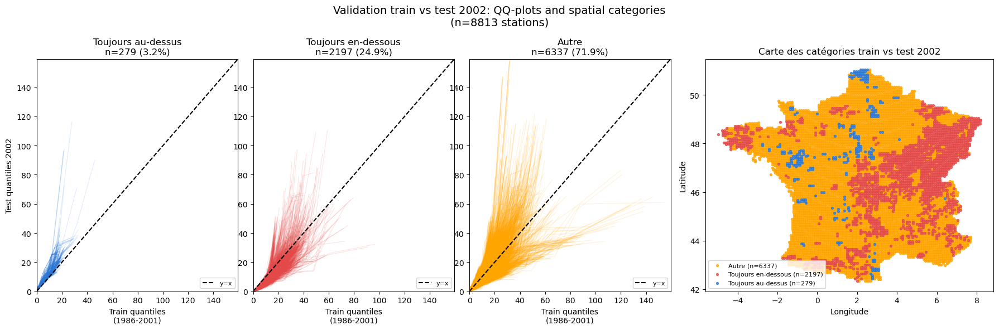

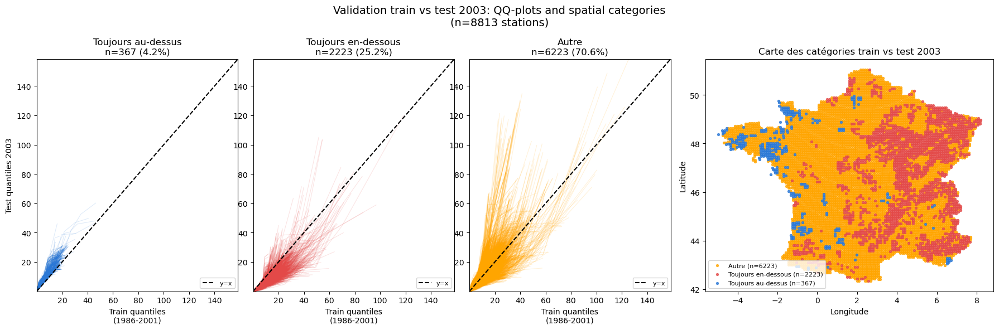

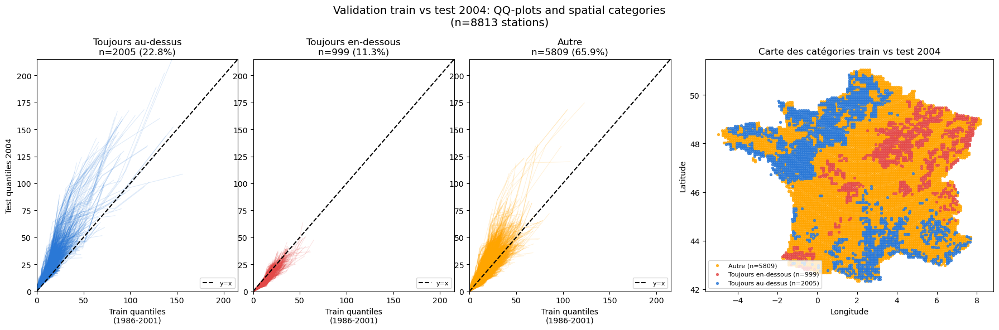

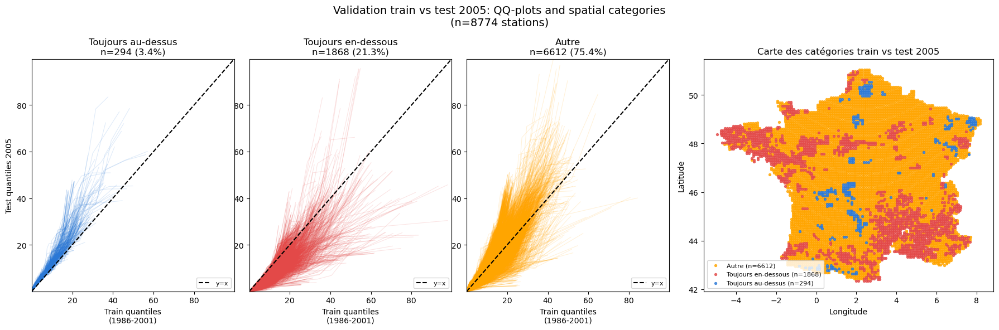

In [91]:
years = [2002, 2003, 2004, 2005]

cat_order = ['above', 'below', 'mixed']
cat_colors = {'above': '#2a78d6', 'below': '#e34948', 'mixed': 'orange'}

for year in years:
    df_qq = classify_stations(
        qq_residue(data_p_train, data_p_test, year, var_col='Precipitation')
    )
    df_cat = df_qq.drop_duplicates('id')[['id', 'category']]
    n_stations = df_qq['id'].nunique()

    fig = plt.figure(figsize=(18, 6))
    gs = fig.add_gridspec(1, 2, width_ratios=[2.2, 1])
    gs_left = gs[0].subgridspec(1, 3)

    axes = [fig.add_subplot(gs_left[i]) for i in range(3)]

    lims = [min(df_qq['train_q'].min(), df_qq['test_q'].min()),
            max(df_qq['train_q'].max(), df_qq['test_q'].max())]

    for ax, cat in zip(axes, cat_order):
        sub = df_qq[df_qq['category'] == cat]
        n_cat = sub['id'].nunique()

        for _, grp in sub.groupby('id'):
            ax.plot(grp['train_q'], grp['test_q'],
                    color=cat_colors[cat], alpha=0.15, linewidth=0.8)

        ax.plot(lims, lims, 'k--', lw=1.5, label='y=x')
        ax.set(xlim=lims, ylim=lims,
               xlabel='Train quantiles\n(1986-2001)',
               title=f"{cat_title_dict[cat]}\nn={n_cat} ({n_cat/n_stations*100:.1f}%)")
        ax.legend(fontsize=8, loc='lower right')

    axes[0].set_ylabel(f'Test quantiles {year}')

    ax_map = fig.add_subplot(gs[1])

    for cat in ['mixed', 'below', 'above']:
        ids_cat = df_cat.loc[df_cat['category'] == cat, 'id']
        n_cat = len(ids_cat)

        ax_map.scatter(station_info.loc[ids_cat, LON_COL],
                       station_info.loc[ids_cat, LAT_COL],
                       s=8, alpha=0.8,
                       color=cat_colors[cat],
                       label=f'{cat_title_dict[cat]} (n={n_cat})')

    ax_map.set(xlabel='Longitude', ylabel='Latitude',
               title=f'Carte des catégories train vs test {year}')
    ax_map.legend(fontsize=8, loc='lower left')

    fig.suptitle(f'Validation train vs test {year}: QQ-plots and spatial categories\n'
                 f'(n={n_stations} stations)', fontsize=14)

    plt.tight_layout()
    plt.show()